In [1]:
# Install libraries.

!pip install wordcloud


In [2]:
# Importing required libraries.

import os

import nltk
#nltk.download()
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from nltk.tag import StanfordPOSTagger

from wordcloud import WordCloud

from pymongo import MongoClient
from pymongo import TEXT

import matplotlib.pyplot as plt
%matplotlib inline

### TALLER 1 - CORTE 2 - SEGUNDA PARTE 

### ──►*Change of the most frequent words week by week (Cambio de las palabras más frecuentes semana a semana).*

### 1. Categoría de Salud.


In [3]:
# Creating a connection to MongoDB
client = MongoClient("localhost", 27017)
db = client["news"]
collection = db["elespectador-salud"]

### primera semana.

In [4]:
#Getting texts from the database.
textSal = []
for news in list(collection.find({"datetime":{'$lt':"22 oct", '$gt':"17 oct"}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textSal.append(news["title"])
    textSal.append(news["summary"])
    textSal.append(news["full_text"])

In [5]:
# Creating a text index over all text fields
collection.create_index([('author', TEXT), ('title', TEXT), ('summary', TEXT), ('full_text', TEXT), ('datetime', TEXT)],default_language = 'spanish')

'author_text_title_text_summary_text_full_text_text_datetime_text'

In [6]:
#Join of the required texts.
textSal = " ".join(textSal)

In [7]:
textSal

'No falte: este sábado 23 de octubre habrá jornada de vacunación en Colombia Durante la pandemia de COVID-19 miles de niños dejaron de recibir las vacunas que necesitan. En Colombia esté sábado será la oportunidad de ponerse al día. Aunque por estos días solo se hable de las vacunas para el COVID-19, hay otros esquemas que son indispensables, especialmente para los menores de edad: los que hacen parte del Plan Ampliado de Inmunización (PAI). De él dependen miles de vidas. (Lea todas las noticias de salud en Colombia) Por eso, este sábado se realizará una nueva jornada nacional de vacunación en la que el Estado colombiano espera vacunar a alrededor 396 mil niños menores de 6 años de edad, 55 mil gestantes y 10 mil adultos de 60 años y más. (Lea Entre 80.000 y 180.000 trabajadores de la salud murieron por el coronavirus) En todo el territorio nacional habrá puntos habilitados para que, quienes lo necesiten, inicien, continúen o terminen sus esquemas. Se aplicarán biológicos, explica el M

### - lowercasing (Transformación a minúsculas).

In [8]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textSal = textSal.lower()

### - tokenization (Tokenización).

In [9]:
#Tokenization per sentences.

sentences = sent_tokenize(textSal)

print(sentences)

['no falte: este sábado 23 de octubre habrá jornada de vacunación en colombia durante la pandemia de covid-19 miles de niños dejaron de recibir las vacunas que necesitan.', 'en colombia esté sábado será la oportunidad de ponerse al día.', 'aunque por estos días solo se hable de las vacunas para el covid-19, hay otros esquemas que son indispensables, especialmente para los menores de edad: los que hacen parte del plan ampliado de inmunización (pai).', 'de él dependen miles de vidas.', '(lea todas las noticias de salud en colombia) por eso, este sábado se realizará una nueva jornada nacional de vacunación en la que el estado colombiano espera vacunar a alrededor 396 mil niños menores de 6 años de edad, 55 mil gestantes y 10 mil adultos de 60 años y más.', '(lea entre 80.000 y 180.000 trabajadores de la salud murieron por el coronavirus) en todo el territorio nacional habrá puntos habilitados para que, quienes lo necesiten, inicien, continúen o terminen sus esquemas.', 'se aplicarán bioló

In [10]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textSal)

print(words)

['no', 'falte', 'este', 'sábado', '23', 'de', 'octubre', 'habrá', 'jornada', 'de', 'vacunación', 'en', 'colombia', 'durante', 'la', 'pandemia', 'de', 'covid', '19', 'miles', 'de', 'niños', 'dejaron', 'de', 'recibir', 'las', 'vacunas', 'que', 'necesitan', 'en', 'colombia', 'esté', 'sábado', 'será', 'la', 'oportunidad', 'de', 'ponerse', 'al', 'día', 'aunque', 'por', 'estos', 'días', 'solo', 'se', 'hable', 'de', 'las', 'vacunas', 'para', 'el', 'covid', '19', 'hay', 'otros', 'esquemas', 'que', 'son', 'indispensables', 'especialmente', 'para', 'los', 'menores', 'de', 'edad', 'los', 'que', 'hacen', 'parte', 'del', 'plan', 'ampliado', 'de', 'inmunización', 'pai', 'de', 'él', 'dependen', 'miles', 'de', 'vidas', 'lea', 'todas', 'las', 'noticias', 'de', 'salud', 'en', 'colombia', 'por', 'eso', 'este', 'sábado', 'se', 'realizará', 'una', 'nueva', 'jornada', 'nacional', 'de', 'vacunación', 'en', 'la', 'que', 'el', 'estado', 'colombiano', 'espera', 'vacunar', 'a', 'alrededor', '396', 'mil', 'niños'

### -removing Stopwords (Remoción de las Stopwords).

In [11]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [12]:
#Removing Stopwords.

filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['no', 'falte', 'este', 'sábado', '23', 'de', 'octubre', 'habrá', 'jornada', 'de', 'vacunación', 'en', 'colombia', 'durante', 'la', 'pandemia', 'de', 'covid', '19', 'miles', 'de', 'niños', 'dejaron', 'de', 'recibir', 'las', 'vacunas', 'que', 'necesitan', 'en', 'colombia', 'esté', 'sábado', 'será', 'la', 'oportunidad', 'de', 'ponerse', 'al', 'día', 'aunque', 'por', 'estos', 'días', 'solo', 'se', 'hable', 'de', 'las', 'vacunas', 'para', 'el', 'covid', '19', 'hay', 'otros', 'esquemas', 'que', 'son', 'indispensables', 'especialmente', 'para', 'los', 'menores', 'de', 'edad', 'los', 'que', 'hacen', 'parte', 'del', 'plan', 'ampliado', 'de', 'inmunización', 'pai', 'de', 'él', 'dependen', 'miles', 'de', 'vidas', 'lea', 'todas', 'las', 'noticias', 'de', 'salud', 'en', 'colombia', 'por', 'eso', 'este', 'sábado', 'se', 'realizará', 'una', 'nueva', 'jornada', 'nacional', 'de', 'vacunación', 'en', 'la', 'que', 'el', 'estado', 'colombiano', 'espera', 'vacunar', 'a', 'alrededor', '396', 'mi

### -part of speech (Parte del discurso).

In [13]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [14]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [15]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(filtered_words)

[('falte', 'VERB'),
 ('sábado', 'NOUN'),
 ('23', 'NUM'),
 ('octubre', 'NOUN'),
 ('jornada', 'NOUN'),
 ('vacunación', 'NOUN'),
 ('colombia', 'ADJ'),
 ('pandemia', 'ADJ'),
 ('covid', 'NOUN'),
 ('19', 'NUM'),
 ('miles', 'NUM'),
 ('niños', 'NOUN'),
 ('dejaron', 'VERB'),
 ('recibir', 'VERB'),
 ('vacunas', 'NOUN'),
 ('necesitan', 'VERB'),
 ('colombia', 'ADJ'),
 ('sábado', 'NOUN'),
 ('oportunidad', 'NOUN'),
 ('ponerse', 'VERB'),
 ('día', 'NOUN'),
 ('aunque', 'SCONJ'),
 ('días', 'NOUN'),
 ('solo', 'ADV'),
 ('hable', 'VERB'),
 ('vacunas', 'NOUN'),
 ('covid', 'ADJ'),
 ('19', 'NUM'),
 ('esquemas', 'NOUN'),
 ('indispensables', 'ADJ'),
 ('especialmente', 'ADV'),
 ('menores', 'ADJ'),
 ('edad', 'NOUN'),
 ('hacen', 'VERB'),
 ('parte', 'NOUN'),
 ('plan', 'NOUN'),
 ('ampliado', 'VERB'),
 ('inmunización', 'NOUN'),
 ('pai', 'NOUN'),
 ('dependen', 'VERB'),
 ('miles', 'NUM'),
 ('vidas', 'NOUN'),
 ('lea', 'VERB'),
 ('todas', 'DET'),
 ('noticias', 'NOUN'),
 ('salud', 'NOUN'),
 ('colombia', 'ADJ'),
 ('sábado',

### -words distribution (Distribución de palabras).

In [16]:
frec_dist = FreqDist(filtered_words)

print(frec_dist)

<FreqDist with 1674 samples and 3965 outcomes>


In [17]:
frec_dist.most_common(5)

[('salud', 73), ('dosis', 60), ('cambio', 36), ('climático', 35), ('años', 33)]

<BarContainer object of 10 artists>

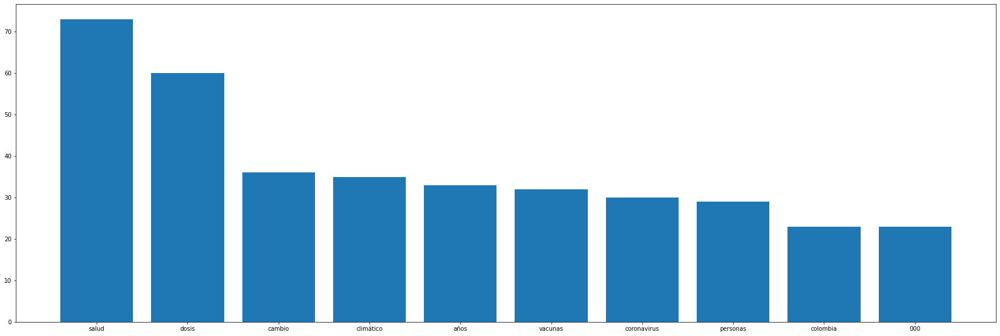

In [18]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

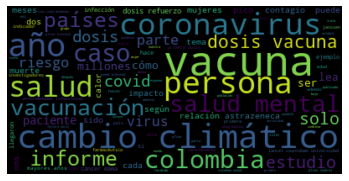

In [19]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### segunda semana.

In [20]:
#Getting texts from the database.
textSal2 = []
for news in list(collection.find({"datetime":{'$lt':"17 oct", '$gt':"10 oct"}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textSal2.append(news["title"])
    textSal2.append(news["summary"])
    textSal2.append(news["full_text"])

In [21]:
# Creating a text index over all text fields
collection.create_index([('author', TEXT), ('title', TEXT), ('summary', TEXT), ('full_text', TEXT), ('datetime', TEXT)],default_language = 'spanish')

'author_text_title_text_summary_text_full_text_text_datetime_text'

In [22]:
#Join of the required texts.
textSal2 = " ".join(textSal2)

In [23]:
textSal2

'Sunniva Ferri, la mujer que perdió el pelo a los 18 años Sunniva Ferri fue diagnosticada a los 18 años con alopecia areata universal, una extraña enfermedad que implica la pérdida del vello en todo el cuerpo. La mujer intentó diferentes métodos para esconder su calvicie, incluyendo pelucas y turbantes, pero después de algunos años entendió que ni la belleza ni la feminidad se rigen por el largo del cabello.  Llegan a Colombia 1´007.370 dosis de vacunas Pfizer por mecanismo Covax El Ministerio de Salud señaló que destinarán para primeras y segundas dosis de gestantes; segundas dosis de niños de 12 años en adelante y personas de 18 años y más que hayan recibido la primera dosis con esta vacuna. El día de hoy, 15 de octubre, en las horas de la tarde, llegaron a Colombia 1´007.370 dosis de vacunas contra el coronavirus de Pfizer, gracias al mecanismo Covax. Según explicó el viceministro de Salud Pública y Prestación de Servicios, Luis Alexander Moscoso, este lote será destinado para prime

### - lowercasing (Transformación a minúsculas).

In [24]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textSal2 = textSal2.lower()

### - tokenization (Tokenización).

In [25]:
#Tokenization per sentences.

sentences = sent_tokenize(textSal2)

print(sentences)

['sunniva ferri, la mujer que perdió el pelo a los 18 años sunniva ferri fue diagnosticada a los 18 años con alopecia areata universal, una extraña enfermedad que implica la pérdida del vello en todo el cuerpo.', 'la mujer intentó diferentes métodos para esconder su calvicie, incluyendo pelucas y turbantes, pero después de algunos años entendió que ni la belleza ni la feminidad se rigen por el largo del cabello.', 'llegan a colombia 1´007.370 dosis de vacunas pfizer por mecanismo covax el ministerio de salud señaló que destinarán para primeras y segundas dosis de gestantes; segundas dosis de niños de 12 años en adelante y personas de 18 años y más que hayan recibido la primera dosis con esta vacuna.', 'el día de hoy, 15 de octubre, en las horas de la tarde, llegaron a colombia 1´007.370 dosis de vacunas contra el coronavirus de pfizer, gracias al mecanismo covax.', 'según explicó el viceministro de salud pública y prestación de servicios, luis alexander moscoso, este lote será destinad

In [26]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textSal2)

print(words)

['sunniva', 'ferri', 'la', 'mujer', 'que', 'perdió', 'el', 'pelo', 'a', 'los', '18', 'años', 'sunniva', 'ferri', 'fue', 'diagnosticada', 'a', 'los', '18', 'años', 'con', 'alopecia', 'areata', 'universal', 'una', 'extraña', 'enfermedad', 'que', 'implica', 'la', 'pérdida', 'del', 'vello', 'en', 'todo', 'el', 'cuerpo', 'la', 'mujer', 'intentó', 'diferentes', 'métodos', 'para', 'esconder', 'su', 'calvicie', 'incluyendo', 'pelucas', 'y', 'turbantes', 'pero', 'después', 'de', 'algunos', 'años', 'entendió', 'que', 'ni', 'la', 'belleza', 'ni', 'la', 'feminidad', 'se', 'rigen', 'por', 'el', 'largo', 'del', 'cabello', 'llegan', 'a', 'colombia', '1', '007', '370', 'dosis', 'de', 'vacunas', 'pfizer', 'por', 'mecanismo', 'covax', 'el', 'ministerio', 'de', 'salud', 'señaló', 'que', 'destinarán', 'para', 'primeras', 'y', 'segundas', 'dosis', 'de', 'gestantes', 'segundas', 'dosis', 'de', 'niños', 'de', '12', 'años', 'en', 'adelante', 'y', 'personas', 'de', '18', 'años', 'y', 'más', 'que', 'hayan', 're

### -removing Stopwords (Remoción de las Stopwords).

In [27]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [28]:
#Removing Stopwords.

filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['sunniva', 'ferri', 'la', 'mujer', 'que', 'perdió', 'el', 'pelo', 'a', 'los', '18', 'años', 'sunniva', 'ferri', 'fue', 'diagnosticada', 'a', 'los', '18', 'años', 'con', 'alopecia', 'areata', 'universal', 'una', 'extraña', 'enfermedad', 'que', 'implica', 'la', 'pérdida', 'del', 'vello', 'en', 'todo', 'el', 'cuerpo', 'la', 'mujer', 'intentó', 'diferentes', 'métodos', 'para', 'esconder', 'su', 'calvicie', 'incluyendo', 'pelucas', 'y', 'turbantes', 'pero', 'después', 'de', 'algunos', 'años', 'entendió', 'que', 'ni', 'la', 'belleza', 'ni', 'la', 'feminidad', 'se', 'rigen', 'por', 'el', 'largo', 'del', 'cabello', 'llegan', 'a', 'colombia', '1', '007', '370', 'dosis', 'de', 'vacunas', 'pfizer', 'por', 'mecanismo', 'covax', 'el', 'ministerio', 'de', 'salud', 'señaló', 'que', 'destinarán', 'para', 'primeras', 'y', 'segundas', 'dosis', 'de', 'gestantes', 'segundas', 'dosis', 'de', 'niños', 'de', '12', 'años', 'en', 'adelante', 'y', 'personas', 'de', '18', 'años', 'y', 'más', 'que', '




Substracting stopwords: ['sunniva', 'ferri', 'mujer', 'perdió', 'pelo', '18', 'años', 'sunniva', 'ferri', 'diagnosticada', '18', 'años', 'alopecia', 'areata', 'universal', 'extraña', 'enfermedad', 'implica', 'pérdida', 'vello', 'cuerpo', 'mujer', 'intentó', 'diferentes', 'métodos', 'esconder', 'calvicie', 'incluyendo', 'pelucas', 'turbantes', 'después', 'años', 'entendió', 'belleza', 'feminidad', 'rigen', 'largo', 'cabello', 'llegan', 'colombia', '1', '007', '370', 'dosis', 'vacunas', 'pfizer', 'mecanismo', 'covax', 'ministerio', 'salud', 'señaló', 'destinarán', 'primeras', 'segundas', 'dosis', 'gestantes', 'segundas', 'dosis', 'niños', '12', 'años', 'adelante', 'personas', '18', 'años', 'recibido', 'primera', 'dosis', 'vacuna', 'día', 'hoy', '15', 'octubre', 'horas', 'tarde', 'llegaron', 'colombia', '1', '007', '370', 'dosis', 'vacunas', 'coronavirus', 'pfizer', 'gracias', 'mecanismo', 'covax', 'según', 'explicó', 'viceministro', 'salud', 'pública', 'prestación', 'servicios', 'luis

### -part of speech (Parte del discurso).

In [29]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [30]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [31]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(filtered_words)

[('sunniva', 'VERB'),
 ('ferri', 'ADJ'),
 ('mujer', 'NOUN'),
 ('perdió', 'VERB'),
 ('pelo', 'ADP'),
 ('18', 'NUM'),
 ('años', 'NOUN'),
 ('sunniva', 'ADJ'),
 ('ferri', 'ADJ'),
 ('diagnosticada', 'ADJ'),
 ('18', 'NUM'),
 ('años', 'NOUN'),
 ('alopecia', 'VERB'),
 ('areata', 'NOUN'),
 ('universal', 'ADJ'),
 ('extraña', 'ADJ'),
 ('enfermedad', 'NOUN'),
 ('implica', 'VERB'),
 ('pérdida', 'NOUN'),
 ('vello', 'NOUN'),
 ('cuerpo', 'NOUN'),
 ('mujer', 'NOUN'),
 ('intentó', 'VERB'),
 ('diferentes', 'DET'),
 ('métodos', 'NOUN'),
 ('esconder', 'VERB'),
 ('calvicie', 'NOUN'),
 ('incluyendo', 'VERB'),
 ('pelucas', 'NOUN'),
 ('turbantes', 'ADJ'),
 ('después', 'ADV'),
 ('años', 'NOUN'),
 ('entendió', 'VERB'),
 ('belleza', 'NOUN'),
 ('feminidad', 'NOUN'),
 ('rigen', 'VERB'),
 ('largo', 'ADJ'),
 ('cabello', 'NOUN'),
 ('llegan', 'VERB'),
 ('colombia', 'ADJ'),
 ('1', 'NUM'),
 ('007', 'NUM'),
 ('370', 'NUM'),
 ('dosis', 'NOUN'),
 ('vacunas', 'NOUN'),
 ('pfizer', 'VERB'),
 ('mecanismo', 'NOUN'),
 ('covax', '

### -words distribution (Distribución de palabras).

In [32]:
frec_dist = FreqDist(filtered_words)

print(frec_dist)

<FreqDist with 2427 samples and 5738 outcomes>


In [33]:
frec_dist.most_common(5)

[('dosis', 46), ('personas', 45), ('si', 38), ('años', 35), ('enfermedad', 32)]

<BarContainer object of 10 artists>

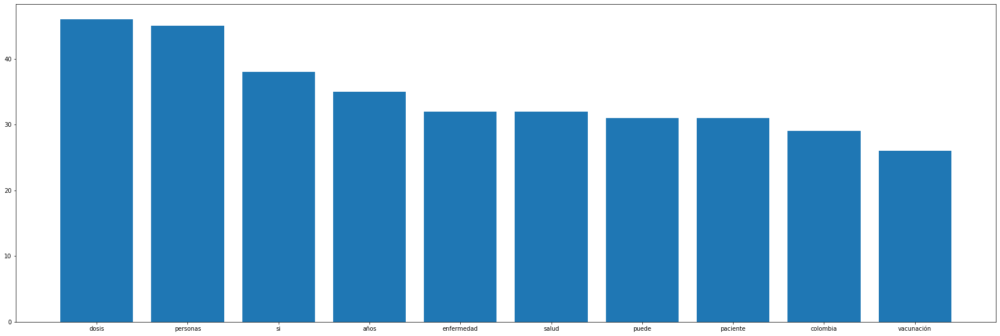

In [34]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

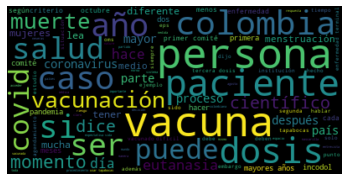

In [35]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### tercera semana.

In [36]:
#Getting texts from the database.
textSal3 = []
for news in list(collection.find({"datetime":{'$lt':"9 oct", '$gt':"3 oct"}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textSal3.append(news["title"])
    textSal3.append(news["summary"])
    textSal3.append(news["full_text"])

In [37]:
# Creating a text index over all text fields
collection.create_index([('author', TEXT), ('title', TEXT), ('summary', TEXT), ('full_text', TEXT), ('datetime', TEXT)],default_language = 'spanish')

'author_text_title_text_summary_text_full_text_text_datetime_text'

In [38]:
#Join of the required texts.
textSal3 = " ".join(textSal3)

In [39]:
textSal3

'Nueva Zelanda y el COVID-19: de los elogios mundiales a la desilusión Por meses la estrategia de países como Nueva Zelanda y Australia recibió aplausos. Como pocos, se enfocaron en tratar de eliminar el COVID-19. Pero ahora sus planeas tuvieron que dar un giro que deja muchas lecciones. En Nueva Zelanda el COVID se avisa como un terremoto o un tsunami. El Servicio de Emergencia Nacional activa una alerta que se reproduce en los celulares de los poco más de cinco millones de personas que habitan las dos islas que conforman el país, ubicado casi al final del mundo. “Se ha identificado un caso comunitario de COVID-19. Quédate en casa y sigue las directrices del nivel de alerta 4”, decía el mensaje enviado el pasado 17 de agosto, cuando los neozelandeses recibieron la orden de guardar cuarentena total, de nuevo. Esa fue, seguramente, la última ocasión en que lo tuvieron que hacer. (Lea: Hubo una caída mundial de nuevos casos de coronavirus) La pandemia no ha terminado allí. De hecho, es j

### - lowercasing (Transformación a minúsculas).

In [40]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textSal3 = textSal3.lower()

### - tokenization (Tokenización).

In [41]:
#Tokenization per sentences.

sentences = sent_tokenize(textSal3)

print(sentences)

['nueva zelanda y el covid-19: de los elogios mundiales a la desilusión por meses la estrategia de países como nueva zelanda y australia recibió aplausos.', 'como pocos, se enfocaron en tratar de eliminar el covid-19.', 'pero ahora sus planeas tuvieron que dar un giro que deja muchas lecciones.', 'en nueva zelanda el covid se avisa como un terremoto o un tsunami.', 'el servicio de emergencia nacional activa una alerta que se reproduce en los celulares de los poco más de cinco millones de personas que habitan las dos islas que conforman el país, ubicado casi al final del mundo.', '“se ha identificado un caso comunitario de covid-19.', 'quédate en casa y sigue las directrices del nivel de alerta 4”, decía el mensaje enviado el pasado 17 de agosto, cuando los neozelandeses recibieron la orden de guardar cuarentena total, de nuevo.', 'esa fue, seguramente, la última ocasión en que lo tuvieron que hacer.', '(lea: hubo una caída mundial de nuevos casos de coronavirus) la pandemia no ha termi

In [42]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textSal3)

print(words)

['nueva', 'zelanda', 'y', 'el', 'covid', '19', 'de', 'los', 'elogios', 'mundiales', 'a', 'la', 'desilusión', 'por', 'meses', 'la', 'estrategia', 'de', 'países', 'como', 'nueva', 'zelanda', 'y', 'australia', 'recibió', 'aplausos', 'como', 'pocos', 'se', 'enfocaron', 'en', 'tratar', 'de', 'eliminar', 'el', 'covid', '19', 'pero', 'ahora', 'sus', 'planeas', 'tuvieron', 'que', 'dar', 'un', 'giro', 'que', 'deja', 'muchas', 'lecciones', 'en', 'nueva', 'zelanda', 'el', 'covid', 'se', 'avisa', 'como', 'un', 'terremoto', 'o', 'un', 'tsunami', 'el', 'servicio', 'de', 'emergencia', 'nacional', 'activa', 'una', 'alerta', 'que', 'se', 'reproduce', 'en', 'los', 'celulares', 'de', 'los', 'poco', 'más', 'de', 'cinco', 'millones', 'de', 'personas', 'que', 'habitan', 'las', 'dos', 'islas', 'que', 'conforman', 'el', 'país', 'ubicado', 'casi', 'al', 'final', 'del', 'mundo', 'se', 'ha', 'identificado', 'un', 'caso', 'comunitario', 'de', 'covid', '19', 'quédate', 'en', 'casa', 'y', 'sigue', 'las', 'directric

### -removing Stopwords (Remoción de las Stopwords).

In [43]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [44]:
#Removing Stopwords.

filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['nueva', 'zelanda', 'y', 'el', 'covid', '19', 'de', 'los', 'elogios', 'mundiales', 'a', 'la', 'desilusión', 'por', 'meses', 'la', 'estrategia', 'de', 'países', 'como', 'nueva', 'zelanda', 'y', 'australia', 'recibió', 'aplausos', 'como', 'pocos', 'se', 'enfocaron', 'en', 'tratar', 'de', 'eliminar', 'el', 'covid', '19', 'pero', 'ahora', 'sus', 'planeas', 'tuvieron', 'que', 'dar', 'un', 'giro', 'que', 'deja', 'muchas', 'lecciones', 'en', 'nueva', 'zelanda', 'el', 'covid', 'se', 'avisa', 'como', 'un', 'terremoto', 'o', 'un', 'tsunami', 'el', 'servicio', 'de', 'emergencia', 'nacional', 'activa', 'una', 'alerta', 'que', 'se', 'reproduce', 'en', 'los', 'celulares', 'de', 'los', 'poco', 'más', 'de', 'cinco', 'millones', 'de', 'personas', 'que', 'habitan', 'las', 'dos', 'islas', 'que', 'conforman', 'el', 'país', 'ubicado', 'casi', 'al', 'final', 'del', 'mundo', 'se', 'ha', 'identificado', 'un', 'caso', 'comunitario', 'de', 'covid', '19', 'quédate', 'en', 'casa', 'y', 'sigue', 'las',

### -part of speech (Parte del discurso).

In [45]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [46]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [47]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(filtered_words)

[('nueva', 'ADJ'),
 ('zelanda', 'NOUN'),
 ('covid', 'VERB'),
 ('19', 'NUM'),
 ('elogios', 'NOUN'),
 ('mundiales', 'ADJ'),
 ('desilusión', 'NOUN'),
 ('meses', 'NOUN'),
 ('estrategia', 'NOUN'),
 ('países', 'NOUN'),
 ('nueva', 'ADJ'),
 ('zelanda', 'ADJ'),
 ('australia', 'ADJ'),
 ('recibió', 'VERB'),
 ('aplausos', 'NOUN'),
 ('pocos', 'DET'),
 ('enfocaron', 'VERB'),
 ('tratar', 'AUX'),
 ('eliminar', 'VERB'),
 ('covid', 'NOUN'),
 ('19', 'NUM'),
 ('ahora', 'ADV'),
 ('planeas', 'ADJ'),
 ('dar', 'VERB'),
 ('giro', 'NOUN'),
 ('deja', 'VERB'),
 ('muchas', 'DET'),
 ('lecciones', 'NOUN'),
 ('nueva', 'ADJ'),
 ('zelanda', 'VERB'),
 ('covid', 'NOUN'),
 ('avisa', 'VERB'),
 ('terremoto', 'NOUN'),
 ('tsunami', 'NOUN'),
 ('servicio', 'NOUN'),
 ('emergencia', 'NOUN'),
 ('nacional', 'ADJ'),
 ('activa', 'ADJ'),
 ('alerta', 'NOUN'),
 ('reproduce', 'VERB'),
 ('celulares', 'ADJ'),
 ('cinco', 'NUM'),
 ('millones', 'NOUN'),
 ('personas', 'NOUN'),
 ('habitan', 'VERB'),
 ('dos', 'NUM'),
 ('islas', 'NOUN'),
 ('confo

### -words distribution (Distribución de palabras).

In [48]:
frec_dist = FreqDist(filtered_words)

print(frec_dist)

<FreqDist with 2506 samples and 5603 outcomes>


In [49]:
frec_dist.most_common(5)

[('salud', 55), ('covid', 40), ('ive', 40), ('dosis', 33), ('eps', 30)]

<BarContainer object of 10 artists>

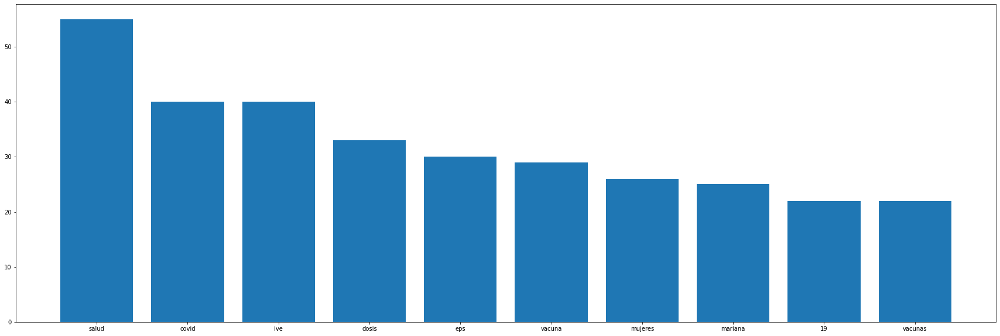

In [50]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

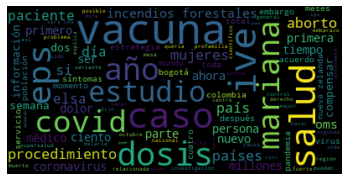

In [51]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### cuarta semana.

In [52]:
#Getting texts from the database.
textSal4 = []
for news in list(collection.find({"datetime":{'$lt':"3 oct", '$gt':"28 sept"}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textSal4.append(news["title"])
    textSal4.append(news["summary"])
    textSal4.append(news["full_text"])

In [53]:
# Creating a text index over all text fields
collection.create_index([('author', TEXT), ('title', TEXT), ('summary', TEXT), ('full_text', TEXT), ('datetime', TEXT)],default_language = 'spanish')

'author_text_title_text_summary_text_full_text_text_datetime_text'

In [54]:
#Join of the required texts.
textSal4 = " ".join(textSal4)

In [55]:
textSal4

'El alquiler de vientres no es solo un negocio En la legislación colombiana existen enormes vacíos jurídicos sobre esta práctica, los cuales propiciarían efectos negativos como la instrumentalización del cuerpo de la mujer. De acuerdo con la doctora en Derecho Sandra Milena Daza, magíster y especialista en Derecho de Familia de la Universidad Nacional de Colombia (UNAL), la denominada maternidad subrogada –también conocida como alquiler de vientres– necesita un marco regulatorio claro y preciso que proteja los derechos de quienes intervienen en este proceso de reproducción humana asistida. La experta asegura que la construcción de una legislación sobre el tema es una necesidad imperante, especialmente para evitar los efectos negativos de la presunta mercantilización de la maternidad. En su tesis de doctorado “La mujer como sujeto de especial protección constitucional en la elección a la maternidad subrogada en Colombia”, la investigadora realiza un análisis jurídico de la legislación n

### - lowercasing (Transformación a minúsculas).

In [56]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textSal4 = textSal4.lower()

### - tokenization (Tokenización).

In [57]:
#Tokenization per sentences.

sentences = sent_tokenize(textSal4)

print(sentences)

['el alquiler de vientres no es solo un negocio en la legislación colombiana existen enormes vacíos jurídicos sobre esta práctica, los cuales propiciarían efectos negativos como la instrumentalización del cuerpo de la mujer.', 'de acuerdo con la doctora en derecho sandra milena daza, magíster y especialista en derecho de familia de la universidad nacional de colombia (unal), la denominada maternidad subrogada –también conocida como alquiler de vientres– necesita un marco regulatorio claro y preciso que proteja los derechos de quienes intervienen en este proceso de reproducción humana asistida.', 'la experta asegura que la construcción de una legislación sobre el tema es una necesidad imperante, especialmente para evitar los efectos negativos de la presunta mercantilización de la maternidad.', 'en su tesis de doctorado “la mujer como sujeto de especial protección constitucional en la elección a la maternidad subrogada en colombia”, la investigadora realiza un análisis jurídico de la leg

In [58]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textSal4)

print(words)

['el', 'alquiler', 'de', 'vientres', 'no', 'es', 'solo', 'un', 'negocio', 'en', 'la', 'legislación', 'colombiana', 'existen', 'enormes', 'vacíos', 'jurídicos', 'sobre', 'esta', 'práctica', 'los', 'cuales', 'propiciarían', 'efectos', 'negativos', 'como', 'la', 'instrumentalización', 'del', 'cuerpo', 'de', 'la', 'mujer', 'de', 'acuerdo', 'con', 'la', 'doctora', 'en', 'derecho', 'sandra', 'milena', 'daza', 'magíster', 'y', 'especialista', 'en', 'derecho', 'de', 'familia', 'de', 'la', 'universidad', 'nacional', 'de', 'colombia', 'unal', 'la', 'denominada', 'maternidad', 'subrogada', 'también', 'conocida', 'como', 'alquiler', 'de', 'vientres', 'necesita', 'un', 'marco', 'regulatorio', 'claro', 'y', 'preciso', 'que', 'proteja', 'los', 'derechos', 'de', 'quienes', 'intervienen', 'en', 'este', 'proceso', 'de', 'reproducción', 'humana', 'asistida', 'la', 'experta', 'asegura', 'que', 'la', 'construcción', 'de', 'una', 'legislación', 'sobre', 'el', 'tema', 'es', 'una', 'necesidad', 'imperante', '

### -removing Stopwords (Remoción de las Stopwords).

In [59]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [60]:
#Removing Stopwords.

filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['el', 'alquiler', 'de', 'vientres', 'no', 'es', 'solo', 'un', 'negocio', 'en', 'la', 'legislación', 'colombiana', 'existen', 'enormes', 'vacíos', 'jurídicos', 'sobre', 'esta', 'práctica', 'los', 'cuales', 'propiciarían', 'efectos', 'negativos', 'como', 'la', 'instrumentalización', 'del', 'cuerpo', 'de', 'la', 'mujer', 'de', 'acuerdo', 'con', 'la', 'doctora', 'en', 'derecho', 'sandra', 'milena', 'daza', 'magíster', 'y', 'especialista', 'en', 'derecho', 'de', 'familia', 'de', 'la', 'universidad', 'nacional', 'de', 'colombia', 'unal', 'la', 'denominada', 'maternidad', 'subrogada', 'también', 'conocida', 'como', 'alquiler', 'de', 'vientres', 'necesita', 'un', 'marco', 'regulatorio', 'claro', 'y', 'preciso', 'que', 'proteja', 'los', 'derechos', 'de', 'quienes', 'intervienen', 'en', 'este', 'proceso', 'de', 'reproducción', 'humana', 'asistida', 'la', 'experta', 'asegura', 'que', 'la', 'construcción', 'de', 'una', 'legislación', 'sobre', 'el', 'tema', 'es', 'una', 'necesidad', 'im

### -part of speech (Parte del discurso).

In [61]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [62]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [63]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(filtered_words)

[('alquiler', 'NOUN'),
 ('vientres', 'NOUN'),
 ('solo', 'ADJ'),
 ('negocio', 'NOUN'),
 ('legislación', 'NOUN'),
 ('colombiana', 'ADJ'),
 ('existen', 'VERB'),
 ('enormes', 'ADJ'),
 ('vacíos', 'ADJ'),
 ('jurídicos', 'ADJ'),
 ('práctica', 'ADJ'),
 ('cuales', 'PRON'),
 ('propiciarían', 'VERB'),
 ('efectos', 'NOUN'),
 ('negativos', 'ADJ'),
 ('instrumentalización', 'NOUN'),
 ('cuerpo', 'NOUN'),
 ('mujer', 'NOUN'),
 ('acuerdo', 'NOUN'),
 ('doctora', 'NOUN'),
 ('derecho', 'NOUN'),
 ('sandra', 'NOUN'),
 ('milena', 'ADJ'),
 ('daza', 'VERB'),
 ('magíster', 'VERB'),
 ('especialista', 'NOUN'),
 ('derecho', 'NOUN'),
 ('familia', 'NOUN'),
 ('universidad', 'NOUN'),
 ('nacional', 'ADJ'),
 ('colombia', 'ADJ'),
 ('unal', 'ADJ'),
 ('denominada', 'ADJ'),
 ('maternidad', 'NOUN'),
 ('subrogada', 'ADJ'),
 ('conocida', 'ADJ'),
 ('alquiler', 'NOUN'),
 ('vientres', 'ADJ'),
 ('necesita', 'VERB'),
 ('marco', 'NOUN'),
 ('regulatorio', 'ADJ'),
 ('claro', 'ADJ'),
 ('preciso', 'ADJ'),
 ('proteja', 'VERB'),
 ('derechos

### -words distribution (Distribución de palabras).

In [64]:
frec_dist = FreqDist(filtered_words)

print(frec_dist)

<FreqDist with 275 samples and 374 outcomes>


In [65]:
frec_dist.most_common(5)

[('mujer', 11),
 ('maternidad', 6),
 ('subrogada', 6),
 ('práctica', 5),
 ('colombia', 5)]

<BarContainer object of 10 artists>

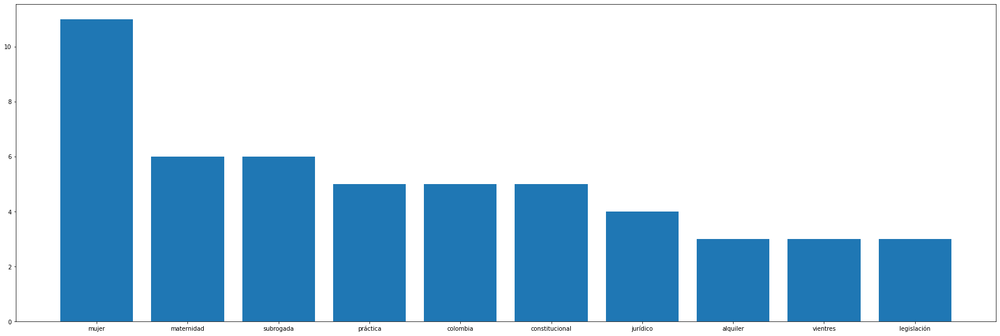

In [66]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

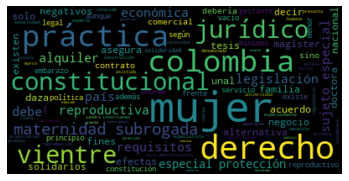

In [67]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### ──►*Analyzing the change of the most frequent words by subject categories (Analizando el cambio de las palabras más frecuentes por categorías de temas).*

In [68]:
#Getting texts from the database.
textSal2do = []
for news in list(collection.find({}, {"title": 1, "author":1 ,"summary": 1, "full_text": 1, "_id": 0})):
    textSal2do.append(news["title"])
    textSal2do.append(news["summary"])
    textSal2do.append(news["author"])
    textSal2do.append(news["full_text"])

In [69]:
#Join of the required texts.
textSal2do = " ".join(textSal2do)

In [70]:
textSal2do

'No falte: este sábado 23 de octubre habrá jornada de vacunación en Colombia Durante la pandemia de COVID-19 miles de niños dejaron de recibir las vacunas que necesitan. En Colombia esté sábado será la oportunidad de ponerse al día. Redacción Salud Aunque por estos días solo se hable de las vacunas para el COVID-19, hay otros esquemas que son indispensables, especialmente para los menores de edad: los que hacen parte del Plan Ampliado de Inmunización (PAI). De él dependen miles de vidas. (Lea todas las noticias de salud en Colombia) Por eso, este sábado se realizará una nueva jornada nacional de vacunación en la que el Estado colombiano espera vacunar a alrededor 396 mil niños menores de 6 años de edad, 55 mil gestantes y 10 mil adultos de 60 años y más. (Lea Entre 80.000 y 180.000 trabajadores de la salud murieron por el coronavirus) En todo el territorio nacional habrá puntos habilitados para que, quienes lo necesiten, inicien, continúen o terminen sus esquemas. Se aplicarán biológic

### - lowercasing (Transformación a minúsculas).

In [71]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textSal2do = textSal2do.lower()

### - tokenization (Tokenización).

In [72]:
#Tokenization per sentences.

sentences = sent_tokenize(textSal2do)

print(sentences)

['no falte: este sábado 23 de octubre habrá jornada de vacunación en colombia durante la pandemia de covid-19 miles de niños dejaron de recibir las vacunas que necesitan.', 'en colombia esté sábado será la oportunidad de ponerse al día.', 'redacción salud aunque por estos días solo se hable de las vacunas para el covid-19, hay otros esquemas que son indispensables, especialmente para los menores de edad: los que hacen parte del plan ampliado de inmunización (pai).', 'de él dependen miles de vidas.', '(lea todas las noticias de salud en colombia) por eso, este sábado se realizará una nueva jornada nacional de vacunación en la que el estado colombiano espera vacunar a alrededor 396 mil niños menores de 6 años de edad, 55 mil gestantes y 10 mil adultos de 60 años y más.', '(lea entre 80.000 y 180.000 trabajadores de la salud murieron por el coronavirus) en todo el territorio nacional habrá puntos habilitados para que, quienes lo necesiten, inicien, continúen o terminen sus esquemas.', 'se

In [73]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textSal2do)

print(words)

['no', 'falte', 'este', 'sábado', '23', 'de', 'octubre', 'habrá', 'jornada', 'de', 'vacunación', 'en', 'colombia', 'durante', 'la', 'pandemia', 'de', 'covid', '19', 'miles', 'de', 'niños', 'dejaron', 'de', 'recibir', 'las', 'vacunas', 'que', 'necesitan', 'en', 'colombia', 'esté', 'sábado', 'será', 'la', 'oportunidad', 'de', 'ponerse', 'al', 'día', 'redacción', 'salud', 'aunque', 'por', 'estos', 'días', 'solo', 'se', 'hable', 'de', 'las', 'vacunas', 'para', 'el', 'covid', '19', 'hay', 'otros', 'esquemas', 'que', 'son', 'indispensables', 'especialmente', 'para', 'los', 'menores', 'de', 'edad', 'los', 'que', 'hacen', 'parte', 'del', 'plan', 'ampliado', 'de', 'inmunización', 'pai', 'de', 'él', 'dependen', 'miles', 'de', 'vidas', 'lea', 'todas', 'las', 'noticias', 'de', 'salud', 'en', 'colombia', 'por', 'eso', 'este', 'sábado', 'se', 'realizará', 'una', 'nueva', 'jornada', 'nacional', 'de', 'vacunación', 'en', 'la', 'que', 'el', 'estado', 'colombiano', 'espera', 'vacunar', 'a', 'alrededor',

### -removing Stopwords (Remoción de las Stopwords).

In [74]:
#Removing Stopwords.

filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['no', 'falte', 'este', 'sábado', '23', 'de', 'octubre', 'habrá', 'jornada', 'de', 'vacunación', 'en', 'colombia', 'durante', 'la', 'pandemia', 'de', 'covid', '19', 'miles', 'de', 'niños', 'dejaron', 'de', 'recibir', 'las', 'vacunas', 'que', 'necesitan', 'en', 'colombia', 'esté', 'sábado', 'será', 'la', 'oportunidad', 'de', 'ponerse', 'al', 'día', 'redacción', 'salud', 'aunque', 'por', 'estos', 'días', 'solo', 'se', 'hable', 'de', 'las', 'vacunas', 'para', 'el', 'covid', '19', 'hay', 'otros', 'esquemas', 'que', 'son', 'indispensables', 'especialmente', 'para', 'los', 'menores', 'de', 'edad', 'los', 'que', 'hacen', 'parte', 'del', 'plan', 'ampliado', 'de', 'inmunización', 'pai', 'de', 'él', 'dependen', 'miles', 'de', 'vidas', 'lea', 'todas', 'las', 'noticias', 'de', 'salud', 'en', 'colombia', 'por', 'eso', 'este', 'sábado', 'se', 'realizará', 'una', 'nueva', 'jornada', 'nacional', 'de', 'vacunación', 'en', 'la', 'que', 'el', 'estado', 'colombiano', 'espera', 'vacunar', 'a', '

### -part of speech (Parte del discurso).

In [75]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [76]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [77]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(filtered_words)

[('falte', 'VERB'),
 ('sábado', 'NOUN'),
 ('23', 'NUM'),
 ('octubre', 'NOUN'),
 ('jornada', 'NOUN'),
 ('vacunación', 'NOUN'),
 ('colombia', 'ADJ'),
 ('pandemia', 'ADJ'),
 ('covid', 'NOUN'),
 ('19', 'NUM'),
 ('miles', 'NUM'),
 ('niños', 'NOUN'),
 ('dejaron', 'VERB'),
 ('recibir', 'VERB'),
 ('vacunas', 'NOUN'),
 ('necesitan', 'VERB'),
 ('colombia', 'ADJ'),
 ('sábado', 'NOUN'),
 ('oportunidad', 'NOUN'),
 ('ponerse', 'VERB'),
 ('día', 'NOUN'),
 ('redacción', 'NOUN'),
 ('salud', 'NOUN'),
 ('aunque', 'SCONJ'),
 ('días', 'NOUN'),
 ('solo', 'ADV'),
 ('hable', 'VERB'),
 ('vacunas', 'NOUN'),
 ('covid', 'ADJ'),
 ('19', 'NUM'),
 ('esquemas', 'NOUN'),
 ('indispensables', 'ADJ'),
 ('especialmente', 'ADV'),
 ('menores', 'ADJ'),
 ('edad', 'NOUN'),
 ('hacen', 'VERB'),
 ('parte', 'NOUN'),
 ('plan', 'NOUN'),
 ('ampliado', 'VERB'),
 ('inmunización', 'NOUN'),
 ('pai', 'NOUN'),
 ('dependen', 'VERB'),
 ('miles', 'NUM'),
 ('vidas', 'NOUN'),
 ('lea', 'VERB'),
 ('todas', 'DET'),
 ('noticias', 'NOUN'),
 ('salud'

### -words distribution (Distribución de palabras).

In [78]:
frec_dist = FreqDist(filtered_words)

print(frec_dist)

<FreqDist with 5158 samples and 17301 outcomes>


In [79]:
frec_dist.most_common(5)

[('salud', 194),
 ('dosis', 190),
 ('vacunas', 103),
 ('años', 100),
 ('personas', 100)]

<BarContainer object of 10 artists>

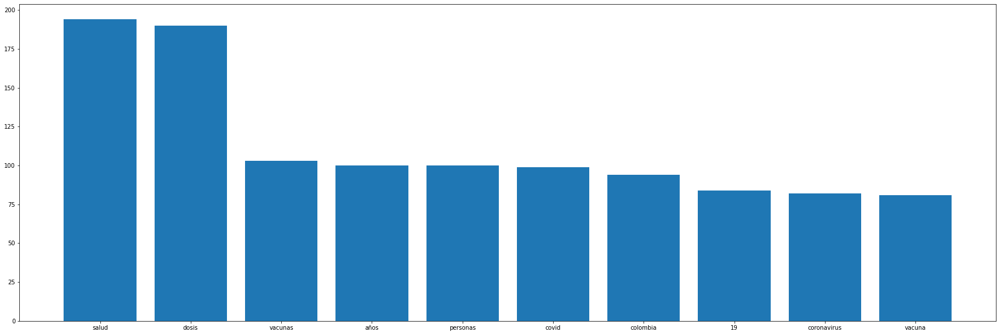

In [80]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

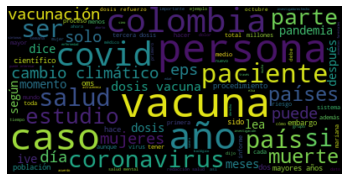

In [81]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### ──►*Change of the most frequent words week by week (Cambio de las palabras más frecuentes semana a semana).*

### 2. Categoría de Ambiente.


In [82]:
# Creating a connection to MongoDB.
client = MongoClient("localhost", 27017)
db = client["news"]
collection = db["elespectador-ambiente"]

### primera semana.

In [83]:
#Getting texts from the database.
textEnvironment1W = []
for news in list(collection.find({"datetime":{'$lt': "7 oct", '$gt':"29 sep"}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textEnvironment1W.append(news["title"])
    textEnvironment1W.append(news["summary"])
    textEnvironment1W.append(news["full_text"])

In [84]:
#Join of the required texts.
textEnvironment1W = " ".join(textEnvironment1W)

In [85]:
textEnvironment1W

'Entre más se urbanice el mundo más expuestos estaremos al calor extremo ¿Cuál es la relación entre la urbanización, la pobreza y el calor extremo? Un estudio de la Academia Nacional de Ciencias de Estados Unidos advierte que el concepto de “calor extremo” está cambiando gracias a la crisis climática, y cada vez más humanos estaremos expuestos a altas temperaturas. Las ciudades han padecido durante los últimos 35 años aumentos drásticos de las temperaturas. Cerca de 1.700 millones de personas vivían expuestas al calor intenso en 2016, un número que se ha triplicado desde 1983. Así lo concluye una investigación publicada el pasado 4 de octubre en las Actas de la Academia Nacional de Ciencias de Estados Unidos. Pero, ¿qué es un “calor intenso”? Los investigadores de la Universidad neoyorquina de Columbia fijaron en 30ºC la temperatura bajo la cual el cuerpo humano comienza a tener dificultades.  Eso, por supuesto, cuando se trata de realizar actividades al aire libre. La estimación se hi

### - lowercasing (Transformación a minúsculas).

In [86]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textEnvironment1W = textEnvironment1W.lower() 

### - tokenization (Tokenización).

In [87]:
#Tokenization per sentences.

sentences = sent_tokenize(textEnvironment1W)

print(sentences)

['entre más se urbanice el mundo más expuestos estaremos al calor extremo ¿cuál es la relación entre la urbanización, la pobreza y el calor extremo?', 'un estudio de la academia nacional de ciencias de estados unidos advierte que el concepto de “calor extremo” está cambiando gracias a la crisis climática, y cada vez más humanos estaremos expuestos a altas temperaturas.', 'las ciudades han padecido durante los últimos 35 años aumentos drásticos de las temperaturas.', 'cerca de 1.700 millones de personas vivían expuestas al calor intenso en 2016, un número que se ha triplicado desde 1983. así lo concluye una investigación publicada el pasado 4 de octubre en las actas de la academia nacional de ciencias de estados unidos.', 'pero, ¿qué es un “calor intenso”?', 'los investigadores de la universidad neoyorquina de columbia fijaron en 30ºc la temperatura bajo la cual el cuerpo humano comienza a tener dificultades.', 'eso, por supuesto, cuando se trata de realizar actividades al aire libre.',

In [88]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

textEnvironment1W = tokenizer.tokenize(textEnvironment1W)

print(words)

['no', 'falte', 'este', 'sábado', '23', 'de', 'octubre', 'habrá', 'jornada', 'de', 'vacunación', 'en', 'colombia', 'durante', 'la', 'pandemia', 'de', 'covid', '19', 'miles', 'de', 'niños', 'dejaron', 'de', 'recibir', 'las', 'vacunas', 'que', 'necesitan', 'en', 'colombia', 'esté', 'sábado', 'será', 'la', 'oportunidad', 'de', 'ponerse', 'al', 'día', 'redacción', 'salud', 'aunque', 'por', 'estos', 'días', 'solo', 'se', 'hable', 'de', 'las', 'vacunas', 'para', 'el', 'covid', '19', 'hay', 'otros', 'esquemas', 'que', 'son', 'indispensables', 'especialmente', 'para', 'los', 'menores', 'de', 'edad', 'los', 'que', 'hacen', 'parte', 'del', 'plan', 'ampliado', 'de', 'inmunización', 'pai', 'de', 'él', 'dependen', 'miles', 'de', 'vidas', 'lea', 'todas', 'las', 'noticias', 'de', 'salud', 'en', 'colombia', 'por', 'eso', 'este', 'sábado', 'se', 'realizará', 'una', 'nueva', 'jornada', 'nacional', 'de', 'vacunación', 'en', 'la', 'que', 'el', 'estado', 'colombiano', 'espera', 'vacunar', 'a', 'alrededor',

### -removing Stopwords (Remoción de las Stopwords).

In [89]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [90]:
#Removing Stopwords.

textEnvironment1W_filtered_words = []
for w in words:
    if w not in stop_words:
        textEnvironment1W_filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", textEnvironment1W_filtered_words)

All words: ['no', 'falte', 'este', 'sábado', '23', 'de', 'octubre', 'habrá', 'jornada', 'de', 'vacunación', 'en', 'colombia', 'durante', 'la', 'pandemia', 'de', 'covid', '19', 'miles', 'de', 'niños', 'dejaron', 'de', 'recibir', 'las', 'vacunas', 'que', 'necesitan', 'en', 'colombia', 'esté', 'sábado', 'será', 'la', 'oportunidad', 'de', 'ponerse', 'al', 'día', 'redacción', 'salud', 'aunque', 'por', 'estos', 'días', 'solo', 'se', 'hable', 'de', 'las', 'vacunas', 'para', 'el', 'covid', '19', 'hay', 'otros', 'esquemas', 'que', 'son', 'indispensables', 'especialmente', 'para', 'los', 'menores', 'de', 'edad', 'los', 'que', 'hacen', 'parte', 'del', 'plan', 'ampliado', 'de', 'inmunización', 'pai', 'de', 'él', 'dependen', 'miles', 'de', 'vidas', 'lea', 'todas', 'las', 'noticias', 'de', 'salud', 'en', 'colombia', 'por', 'eso', 'este', 'sábado', 'se', 'realizará', 'una', 'nueva', 'jornada', 'nacional', 'de', 'vacunación', 'en', 'la', 'que', 'el', 'estado', 'colombiano', 'espera', 'vacunar', 'a', '

### -part of speech (Parte del discurso).

In [91]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [92]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [93]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(textEnvironment1W_filtered_words)

[('falte', 'VERB'),
 ('sábado', 'NOUN'),
 ('23', 'NUM'),
 ('octubre', 'NOUN'),
 ('jornada', 'NOUN'),
 ('vacunación', 'NOUN'),
 ('colombia', 'ADJ'),
 ('pandemia', 'ADJ'),
 ('covid', 'NOUN'),
 ('19', 'NUM'),
 ('miles', 'NUM'),
 ('niños', 'NOUN'),
 ('dejaron', 'VERB'),
 ('recibir', 'VERB'),
 ('vacunas', 'NOUN'),
 ('necesitan', 'VERB'),
 ('colombia', 'ADJ'),
 ('sábado', 'NOUN'),
 ('oportunidad', 'NOUN'),
 ('ponerse', 'VERB'),
 ('día', 'NOUN'),
 ('redacción', 'NOUN'),
 ('salud', 'NOUN'),
 ('aunque', 'SCONJ'),
 ('días', 'NOUN'),
 ('solo', 'ADV'),
 ('hable', 'VERB'),
 ('vacunas', 'NOUN'),
 ('covid', 'ADJ'),
 ('19', 'NUM'),
 ('esquemas', 'NOUN'),
 ('indispensables', 'ADJ'),
 ('especialmente', 'ADV'),
 ('menores', 'ADJ'),
 ('edad', 'NOUN'),
 ('hacen', 'VERB'),
 ('parte', 'NOUN'),
 ('plan', 'NOUN'),
 ('ampliado', 'VERB'),
 ('inmunización', 'NOUN'),
 ('pai', 'NOUN'),
 ('dependen', 'VERB'),
 ('miles', 'NUM'),
 ('vidas', 'NOUN'),
 ('lea', 'VERB'),
 ('todas', 'DET'),
 ('noticias', 'NOUN'),
 ('salud'

### -words distribution (Distribución de palabras).

In [94]:
frec_dist = FreqDist(textEnvironment1W_filtered_words)

print(frec_dist)

<FreqDist with 5158 samples and 17301 outcomes>


In [95]:
frec_dist.most_common(5)

[('salud', 194),
 ('dosis', 190),
 ('vacunas', 103),
 ('años', 100),
 ('personas', 100)]

<BarContainer object of 10 artists>

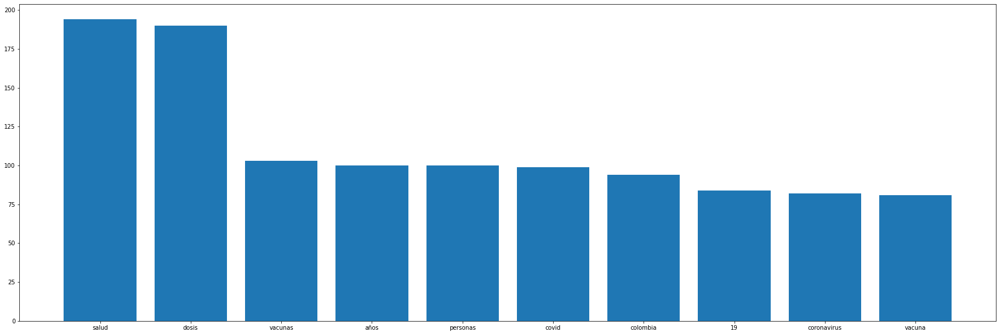

In [96]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

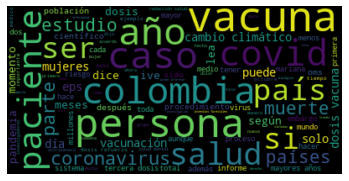

In [97]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### segunda semana.

In [98]:
#Getting texts from the database.
textEnvironment2W = []
for news in list(collection.find({"datetime":{'$lt':"20 oct", '$gt':"10 oct"}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textEnvironment2W.append(news["title"])
    textEnvironment2W.append(news["summary"])
    textEnvironment2W.append(news["full_text"])

In [99]:
#Join of the required texts.
textEnvironment2W = " ".join(textEnvironment2W)

In [100]:
textEnvironment2W

'Colombia podría ser un cementerio de glaciares Solo en el siglo XX el país perdió ocho de los 16 picos nevados que se conocían. La amenaza del calentamiento global y el cambio climático están llevando a nuestros glaciares tropicales a desaparecer en poco tiempo. El caso más preocupante es el del Nevado Santa Isabel, al que solo le quedan entre 5 y 10 años antes de extinguirse. “Hoy somos glaciólogos, estudiando glaciares en extinción. Mañana seremos contadores de historias de glaciares que existieron”. Las palabras son de Jorge Luis Ceballos, un ingeniero geógrafo reconocido popularmente como el primer y el único glaciólogo en Colombia, y uno de los protagonistas del documental Causas elevadas, que se estrenó el pasado 16 de agosto. (Le recomendamos: El último glaciólogo) Ceballos es el responsable de la investigación de los glaciares colombianos en el Instituto de Hidrología, Meteorología y Estudios ambientales (Ideam) y, desde hace 20 años, ha dedicado a su vida a ir, mes a mes, a l

### - lowercasing (Transformación a minúsculas).

In [101]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textEnvironment2W = textEnvironment2W.lower() 

### - tokenization (Tokenización).

In [102]:
#Tokenization per sentences.

sentences = sent_tokenize(textEnvironment2W)

print(sentences)

['colombia podría ser un cementerio de glaciares solo en el siglo xx el país perdió ocho de los 16 picos nevados que se conocían.', 'la amenaza del calentamiento global y el cambio climático están llevando a nuestros glaciares tropicales a desaparecer en poco tiempo.', 'el caso más preocupante es el del nevado santa isabel, al que solo le quedan entre 5 y 10 años antes de extinguirse.', '“hoy somos glaciólogos, estudiando glaciares en extinción.', 'mañana seremos contadores de historias de glaciares que existieron”.', 'las palabras son de jorge luis ceballos, un ingeniero geógrafo reconocido popularmente como el primer y el único glaciólogo en colombia, y uno de los protagonistas del documental causas elevadas, que se estrenó el pasado 16 de agosto.', '(le recomendamos: el último glaciólogo) ceballos es el responsable de la investigación de los glaciares colombianos en el instituto de hidrología, meteorología y estudios ambientales (ideam) y, desde hace 20 años, ha dedicado a su vida a

In [103]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textEnvironment2W)

print(words)

['colombia', 'podría', 'ser', 'un', 'cementerio', 'de', 'glaciares', 'solo', 'en', 'el', 'siglo', 'xx', 'el', 'país', 'perdió', 'ocho', 'de', 'los', '16', 'picos', 'nevados', 'que', 'se', 'conocían', 'la', 'amenaza', 'del', 'calentamiento', 'global', 'y', 'el', 'cambio', 'climático', 'están', 'llevando', 'a', 'nuestros', 'glaciares', 'tropicales', 'a', 'desaparecer', 'en', 'poco', 'tiempo', 'el', 'caso', 'más', 'preocupante', 'es', 'el', 'del', 'nevado', 'santa', 'isabel', 'al', 'que', 'solo', 'le', 'quedan', 'entre', '5', 'y', '10', 'años', 'antes', 'de', 'extinguirse', 'hoy', 'somos', 'glaciólogos', 'estudiando', 'glaciares', 'en', 'extinción', 'mañana', 'seremos', 'contadores', 'de', 'historias', 'de', 'glaciares', 'que', 'existieron', 'las', 'palabras', 'son', 'de', 'jorge', 'luis', 'ceballos', 'un', 'ingeniero', 'geógrafo', 'reconocido', 'popularmente', 'como', 'el', 'primer', 'y', 'el', 'único', 'glaciólogo', 'en', 'colombia', 'y', 'uno', 'de', 'los', 'protagonistas', 'del', 'doc

### -removing Stopwords (Remoción de las Stopwords).

In [104]:
#Removing Stopwords.

textEnvironment2W_filtered_words = []
for w in words:
    if w not in stop_words:
       textEnvironment2W_filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", textEnvironment2W_filtered_words)

All words: ['colombia', 'podría', 'ser', 'un', 'cementerio', 'de', 'glaciares', 'solo', 'en', 'el', 'siglo', 'xx', 'el', 'país', 'perdió', 'ocho', 'de', 'los', '16', 'picos', 'nevados', 'que', 'se', 'conocían', 'la', 'amenaza', 'del', 'calentamiento', 'global', 'y', 'el', 'cambio', 'climático', 'están', 'llevando', 'a', 'nuestros', 'glaciares', 'tropicales', 'a', 'desaparecer', 'en', 'poco', 'tiempo', 'el', 'caso', 'más', 'preocupante', 'es', 'el', 'del', 'nevado', 'santa', 'isabel', 'al', 'que', 'solo', 'le', 'quedan', 'entre', '5', 'y', '10', 'años', 'antes', 'de', 'extinguirse', 'hoy', 'somos', 'glaciólogos', 'estudiando', 'glaciares', 'en', 'extinción', 'mañana', 'seremos', 'contadores', 'de', 'historias', 'de', 'glaciares', 'que', 'existieron', 'las', 'palabras', 'son', 'de', 'jorge', 'luis', 'ceballos', 'un', 'ingeniero', 'geógrafo', 'reconocido', 'popularmente', 'como', 'el', 'primer', 'y', 'el', 'único', 'glaciólogo', 'en', 'colombia', 'y', 'uno', 'de', 'los', 'protagonistas', 

### -part of speech (Parte del discurso).

In [105]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [106]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [107]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(textEnvironment2W_filtered_words)

[('colombia', 'ADJ'),
 ('podría', 'AUX'),
 ('ser', 'AUX'),
 ('cementerio', 'NOUN'),
 ('glaciares', 'ADJ'),
 ('solo', 'ADJ'),
 ('siglo', 'NOUN'),
 ('xx', 'NOUN'),
 ('país', 'NOUN'),
 ('perdió', 'VERB'),
 ('ocho', 'NUM'),
 ('16', 'NUM'),
 ('picos', 'NOUN'),
 ('nevados', 'ADJ'),
 ('conocían', 'VERB'),
 ('amenaza', 'VERB'),
 ('calentamiento', 'NOUN'),
 ('global', 'ADJ'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('llevando', 'VERB'),
 ('glaciares', 'NOUN'),
 ('tropicales', 'ADJ'),
 ('desaparecer', 'VERB'),
 ('tiempo', 'NOUN'),
 ('caso', 'NOUN'),
 ('preocupante', 'ADJ'),
 ('nevado', 'ADJ'),
 ('santa', 'ADJ'),
 ('isabel', 'NOUN'),
 ('solo', 'ADJ'),
 ('quedan', 'VERB'),
 ('5', 'NUM'),
 ('10', 'NUM'),
 ('años', 'NOUN'),
 ('extinguirse', 'VERB'),
 ('hoy', 'ADV'),
 ('glaciólogos', 'NOUN'),
 ('estudiando', 'VERB'),
 ('glaciares', 'ADJ'),
 ('extinción', 'NOUN'),
 ('mañana', 'ADV'),
 ('contadores', 'ADJ'),
 ('historias', 'NOUN'),
 ('glaciares', 'ADJ'),
 ('existieron', 'VERB'),
 ('palabras', 'NOU

### -words distribution (Distribución de palabras).

In [108]:
frec_dist = FreqDist(textEnvironment2W_filtered_words)

print(frec_dist)

<FreqDist with 3976 samples and 10367 outcomes>


In [109]:
frec_dist.most_common(5)

[('colombia', 55),
 ('especies', 53),
 ('climático', 52),
 ('cambio', 49),
 ('biodiversidad', 47)]

<BarContainer object of 10 artists>

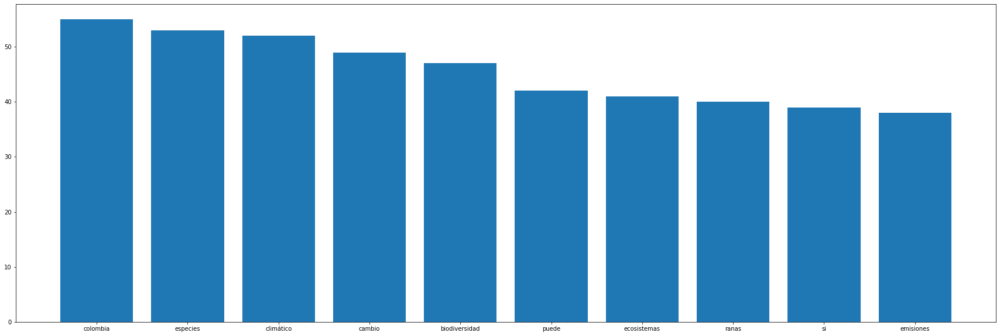

In [110]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

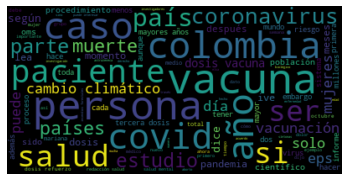

In [111]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### tercera semana.

In [112]:
#Getting texts from the database.
textEnvironment3W = []
for news in list(collection.find({"datetime":{'$lt':"19 oct", '$gt':"15 oct"}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textEnvironment3W.append(news["title"])
    textEnvironment3W.append(news["summary"])
    textEnvironment3W.append(news["full_text"])

In [113]:
#Join of the required texts.
textEnvironment3W = " ".join(textEnvironment3W)

In [114]:
textEnvironment3W

'Los compromisos climáticos de Colombia nos llevarían a un mundo 4° C más caliente La organización Climate Action Tracker realizó un análisis de los objetivos que presentó el país para hacerle frente al cambio climático, también conocidos como NDC, y concluye que son “altamente insuficientes”. El Espectador habló con Gustavo de Vivero, uno de los investigadores que realizó el informe. Además de la siembra de 180 millones de árboles, uno de los compromisos más repetidos por el ministro de Ambiente, Carlos Correa, durante el último año, es que Colombia disminuirá las emisiones de gases efecto invernadero en un 51 % para 2030. La meta ha sido descrita por el Gobierno como ambiciosa, sobre todo teniendo en cuenta que el país solo aporta aproximadamente el 0,7 % de estos gases a escala mundial. Sin embargo, llevada a la acción, parece que se queda corta. Según un análisis que realizó la organización independiente Climate Action Tracker (CAT), la ruta que tiene el país para mitigar el cambio

### - lowercasing (Transformación a minúsculas).

In [115]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textEnvironment3W = textEnvironment3W.lower() 

### - tokenization (Tokenización).

In [116]:
#Tokenization per sentences.

sentences = sent_tokenize(textEnvironment3W)

print(sentences)

['los compromisos climáticos de colombia nos llevarían a un mundo 4° c más caliente la organización climate action tracker realizó un análisis de los objetivos que presentó el país para hacerle frente al cambio climático, también conocidos como ndc, y concluye que son “altamente insuficientes”.', 'el espectador habló con gustavo de vivero, uno de los investigadores que realizó el informe.', 'además de la siembra de 180 millones de árboles, uno de los compromisos más repetidos por el ministro de ambiente, carlos correa, durante el último año, es que colombia disminuirá las emisiones de gases efecto invernadero en un 51 % para 2030. la meta ha sido descrita por el gobierno como ambiciosa, sobre todo teniendo en cuenta que el país solo aporta aproximadamente el 0,7 % de estos gases a escala mundial.', 'sin embargo, llevada a la acción, parece que se queda corta.', 'según un análisis que realizó la organización independiente climate action tracker (cat), la ruta que tiene el país para miti

In [117]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textEnvironment3W)

print(words)

['los', 'compromisos', 'climáticos', 'de', 'colombia', 'nos', 'llevarían', 'a', 'un', 'mundo', '4', 'c', 'más', 'caliente', 'la', 'organización', 'climate', 'action', 'tracker', 'realizó', 'un', 'análisis', 'de', 'los', 'objetivos', 'que', 'presentó', 'el', 'país', 'para', 'hacerle', 'frente', 'al', 'cambio', 'climático', 'también', 'conocidos', 'como', 'ndc', 'y', 'concluye', 'que', 'son', 'altamente', 'insuficientes', 'el', 'espectador', 'habló', 'con', 'gustavo', 'de', 'vivero', 'uno', 'de', 'los', 'investigadores', 'que', 'realizó', 'el', 'informe', 'además', 'de', 'la', 'siembra', 'de', '180', 'millones', 'de', 'árboles', 'uno', 'de', 'los', 'compromisos', 'más', 'repetidos', 'por', 'el', 'ministro', 'de', 'ambiente', 'carlos', 'correa', 'durante', 'el', 'último', 'año', 'es', 'que', 'colombia', 'disminuirá', 'las', 'emisiones', 'de', 'gases', 'efecto', 'invernadero', 'en', 'un', '51', 'para', '2030', 'la', 'meta', 'ha', 'sido', 'descrita', 'por', 'el', 'gobierno', 'como', 'ambici

### -removing Stopwords (Remoción de las Stopwords).

In [118]:
#Removing Stopwords.

textEnvironment3W_filtered_words = []
for w in words:
    if w not in stop_words:
       textEnvironment3W_filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", textEnvironment3W_filtered_words)

All words: ['los', 'compromisos', 'climáticos', 'de', 'colombia', 'nos', 'llevarían', 'a', 'un', 'mundo', '4', 'c', 'más', 'caliente', 'la', 'organización', 'climate', 'action', 'tracker', 'realizó', 'un', 'análisis', 'de', 'los', 'objetivos', 'que', 'presentó', 'el', 'país', 'para', 'hacerle', 'frente', 'al', 'cambio', 'climático', 'también', 'conocidos', 'como', 'ndc', 'y', 'concluye', 'que', 'son', 'altamente', 'insuficientes', 'el', 'espectador', 'habló', 'con', 'gustavo', 'de', 'vivero', 'uno', 'de', 'los', 'investigadores', 'que', 'realizó', 'el', 'informe', 'además', 'de', 'la', 'siembra', 'de', '180', 'millones', 'de', 'árboles', 'uno', 'de', 'los', 'compromisos', 'más', 'repetidos', 'por', 'el', 'ministro', 'de', 'ambiente', 'carlos', 'correa', 'durante', 'el', 'último', 'año', 'es', 'que', 'colombia', 'disminuirá', 'las', 'emisiones', 'de', 'gases', 'efecto', 'invernadero', 'en', 'un', '51', 'para', '2030', 'la', 'meta', 'ha', 'sido', 'descrita', 'por', 'el', 'gobierno', 'com

### -part of speech (Parte del discurso).

In [119]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [120]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [121]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(textEnvironment3W_filtered_words)

[('compromisos', 'NOUN'),
 ('climáticos', 'ADJ'),
 ('colombia', 'ADJ'),
 ('llevarían', 'VERB'),
 ('mundo', 'NOUN'),
 ('4', 'NUM'),
 ('c', 'SYM'),
 ('caliente', 'ADJ'),
 ('organización', 'NOUN'),
 ('climate', 'ADJ'),
 ('action', 'NOUN'),
 ('tracker', 'VERB'),
 ('realizó', 'VERB'),
 ('análisis', 'NOUN'),
 ('objetivos', 'ADJ'),
 ('presentó', 'VERB'),
 ('país', 'NOUN'),
 ('hacerle', 'NOUN'),
 ('frente', 'NOUN'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('conocidos', 'ADJ'),
 ('ndc', 'PROPN'),
 ('concluye', 'VERB'),
 ('altamente', 'ADV'),
 ('insuficientes', 'ADJ'),
 ('espectador', 'NOUN'),
 ('habló', 'VERB'),
 ('gustavo', 'NOUN'),
 ('vivero', 'ADJ'),
 ('investigadores', 'NOUN'),
 ('realizó', 'VERB'),
 ('informe', 'VERB'),
 ('además', 'ADV'),
 ('siembra', 'NOUN'),
 ('180', 'NUM'),
 ('millones', 'NOUN'),
 ('árboles', 'NOUN'),
 ('compromisos', 'NOUN'),
 ('repetidos', 'ADJ'),
 ('ministro', 'NOUN'),
 ('ambiente', 'NOUN'),
 ('carlos', 'ADJ'),
 ('correa', 'NOUN'),
 ('último', 'ADJ'),
 ('año', 

### -words distribution (Distribución de palabras).

In [122]:
frec_dist = FreqDist(textEnvironment3W_filtered_words)

print(frec_dist)

<FreqDist with 1188 samples and 2229 outcomes>


In [123]:
frec_dist.most_common(5)

[('hielo', 32), ('emisiones', 19), ('si', 18), ('lagos', 18), ('colombia', 16)]

<BarContainer object of 10 artists>

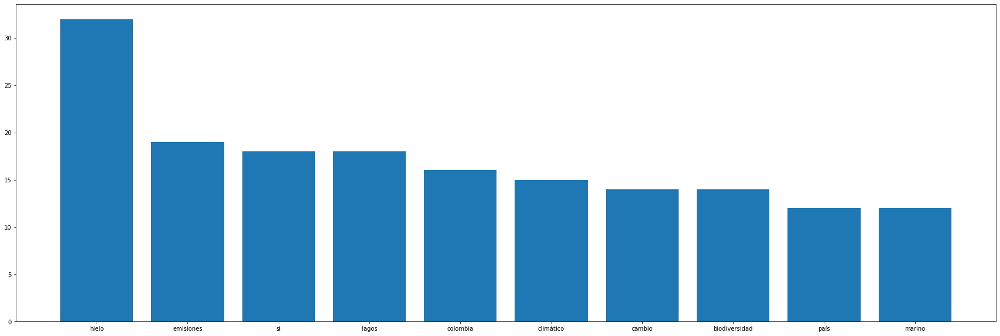

In [124]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

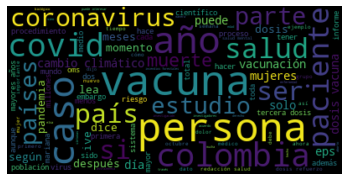

In [125]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### ──►*Analyzing the change of the most frequent words by subject categories (Analizando el cambio de las palabras más frecuentes por categorías de temas).*

In [126]:
#Getting texts from the database.
AlltextEnvironment = []
for news in list(collection.find({}, {"title": 1, "author":1 ,"summary": 1, "full_text": 1, "_id": 0})):
    AlltextEnvironment.append(news["title"])
    AlltextEnvironment.append(news["summary"])
    AlltextEnvironment.append(news["author"])
    AlltextEnvironment.append(news["full_text"])

In [127]:
#Join of the required texts.
AlltextEnvironment = " ".join(AlltextEnvironment)

In [128]:
AlltextEnvironment

'Vibrio, la bacteria indicadora del cambio climático que está en aumento A este patógeno, que tiene una especie que causa el cólera, le atraen las aguas con baja salinidad y más calientes, ambos escenarios que están creciendo con el cambio climático. Luis Escobar y Jaime Martínez Urtanza, autores de la sección de enfermedades infecciosas de The Lancet Countdown, explican el panorama. María Mónica Monsalve “La Vibrio es como un barómetro del cambio climático, un organismo modelo que sirve para establecer las señales de cambio”, es una de las primeras cosas que comenta Jaime Martínez Urtanza, parte del Departamento de Genética y Microbiología de la Universidad Autónoma de Barcelona, España, y uno de los más de 90 autores del “Reporte de Lancet Countdown 2021 sobre la salud y el cambio climático: código rojo para un futuro sano”, publicado esta semana. (Le sugerimos: 345 mil muertes y otras 43 razones de salud para frenar el cambio climático) Junto con investigadores de otros países e ins

### - lowercasing (Transformación a minúsculas).

In [129]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
AlltextEnvironment = AlltextEnvironment.lower() 

### - tokenization (Tokenización).

In [130]:
#Tokenization per sentences.

sentences = sent_tokenize(AlltextEnvironment)

print(sentences)

['vibrio, la bacteria indicadora del cambio climático que está en aumento a este patógeno, que tiene una especie que causa el cólera, le atraen las aguas con baja salinidad y más calientes, ambos escenarios que están creciendo con el cambio climático.', 'luis escobar y jaime martínez urtanza, autores de la sección de enfermedades infecciosas de the lancet countdown, explican el panorama.', 'maría mónica monsalve “la vibrio es como un barómetro del cambio climático, un organismo modelo que sirve para establecer las señales de cambio”, es una de las primeras cosas que comenta jaime martínez urtanza, parte del departamento de genética y microbiología de la universidad autónoma de barcelona, españa, y uno de los más de 90 autores del “reporte de lancet countdown 2021 sobre la salud y el cambio climático: código rojo para un futuro sano”, publicado esta semana.', '(le sugerimos: 345 mil muertes y otras 43 razones de salud para frenar el cambio climático) junto con investigadores de otros pa

In [131]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(AlltextEnvironment)

print(words)

['vibrio', 'la', 'bacteria', 'indicadora', 'del', 'cambio', 'climático', 'que', 'está', 'en', 'aumento', 'a', 'este', 'patógeno', 'que', 'tiene', 'una', 'especie', 'que', 'causa', 'el', 'cólera', 'le', 'atraen', 'las', 'aguas', 'con', 'baja', 'salinidad', 'y', 'más', 'calientes', 'ambos', 'escenarios', 'que', 'están', 'creciendo', 'con', 'el', 'cambio', 'climático', 'luis', 'escobar', 'y', 'jaime', 'martínez', 'urtanza', 'autores', 'de', 'la', 'sección', 'de', 'enfermedades', 'infecciosas', 'de', 'the', 'lancet', 'countdown', 'explican', 'el', 'panorama', 'maría', 'mónica', 'monsalve', 'la', 'vibrio', 'es', 'como', 'un', 'barómetro', 'del', 'cambio', 'climático', 'un', 'organismo', 'modelo', 'que', 'sirve', 'para', 'establecer', 'las', 'señales', 'de', 'cambio', 'es', 'una', 'de', 'las', 'primeras', 'cosas', 'que', 'comenta', 'jaime', 'martínez', 'urtanza', 'parte', 'del', 'departamento', 'de', 'genética', 'y', 'microbiología', 'de', 'la', 'universidad', 'autónoma', 'de', 'barcelona', 

### -removing Stopwords (Remoción de las Stopwords).

In [132]:
#Removing Stopwords.

AlltextEnvironment_filtered_words = []
for w in words:
    if w not in stop_words:
       AlltextEnvironment_filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", AlltextEnvironment_filtered_words)

All words: ['vibrio', 'la', 'bacteria', 'indicadora', 'del', 'cambio', 'climático', 'que', 'está', 'en', 'aumento', 'a', 'este', 'patógeno', 'que', 'tiene', 'una', 'especie', 'que', 'causa', 'el', 'cólera', 'le', 'atraen', 'las', 'aguas', 'con', 'baja', 'salinidad', 'y', 'más', 'calientes', 'ambos', 'escenarios', 'que', 'están', 'creciendo', 'con', 'el', 'cambio', 'climático', 'luis', 'escobar', 'y', 'jaime', 'martínez', 'urtanza', 'autores', 'de', 'la', 'sección', 'de', 'enfermedades', 'infecciosas', 'de', 'the', 'lancet', 'countdown', 'explican', 'el', 'panorama', 'maría', 'mónica', 'monsalve', 'la', 'vibrio', 'es', 'como', 'un', 'barómetro', 'del', 'cambio', 'climático', 'un', 'organismo', 'modelo', 'que', 'sirve', 'para', 'establecer', 'las', 'señales', 'de', 'cambio', 'es', 'una', 'de', 'las', 'primeras', 'cosas', 'que', 'comenta', 'jaime', 'martínez', 'urtanza', 'parte', 'del', 'departamento', 'de', 'genética', 'y', 'microbiología', 'de', 'la', 'universidad', 'autónoma', 'de', 'b




Substracting stopwords: ['vibrio', 'bacteria', 'indicadora', 'cambio', 'climático', 'aumento', 'patógeno', 'especie', 'causa', 'cólera', 'atraen', 'aguas', 'baja', 'salinidad', 'calientes', 'ambos', 'escenarios', 'creciendo', 'cambio', 'climático', 'luis', 'escobar', 'jaime', 'martínez', 'urtanza', 'autores', 'sección', 'enfermedades', 'infecciosas', 'the', 'lancet', 'countdown', 'explican', 'panorama', 'maría', 'mónica', 'monsalve', 'vibrio', 'barómetro', 'cambio', 'climático', 'organismo', 'modelo', 'sirve', 'establecer', 'señales', 'cambio', 'primeras', 'cosas', 'comenta', 'jaime', 'martínez', 'urtanza', 'parte', 'departamento', 'genética', 'microbiología', 'universidad', 'autónoma', 'barcelona', 'españa', '90', 'autores', 'reporte', 'lancet', 'countdown', '2021', 'salud', 'cambio', 'climático', 'código', 'rojo', 'futuro', 'sano', 'publicado', 'semana', 'sugerimos', '345', 'mil', 'muertes', '43', 'razones', 'salud', 'frenar', 'cambio', 'climático', 'junto', 'investigadores', 'paí

### -part of speech (Parte del discurso).

In [133]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [134]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [135]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(AlltextEnvironment_filtered_words)

[('vibrio', 'ADJ'),
 ('bacteria', 'NOUN'),
 ('indicadora', 'ADJ'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('aumento', 'NOUN'),
 ('patógeno', 'ADJ'),
 ('especie', 'NOUN'),
 ('causa', 'NOUN'),
 ('cólera', 'PROPN'),
 ('atraen', 'VERB'),
 ('aguas', 'NOUN'),
 ('baja', 'ADJ'),
 ('salinidad', 'NOUN'),
 ('calientes', 'ADJ'),
 ('ambos', 'NUM'),
 ('escenarios', 'NOUN'),
 ('creciendo', 'VERB'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('luis', 'ADJ'),
 ('escobar', 'VERB'),
 ('jaime', 'NOUN'),
 ('martínez', 'ADJ'),
 ('urtanza', 'VERB'),
 ('autores', 'NOUN'),
 ('sección', 'NOUN'),
 ('enfermedades', 'NOUN'),
 ('infecciosas', 'ADJ'),
 ('the', 'PROPN'),
 ('lancet', 'PROPN'),
 ('countdown', 'PROPN'),
 ('explican', 'VERB'),
 ('panorama', 'NOUN'),
 ('maría', 'NOUN'),
 ('mónica', 'ADJ'),
 ('monsalve', 'VERB'),
 ('vibrio', 'NOUN'),
 ('barómetro', 'NOUN'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('organismo', 'NOUN'),
 ('modelo', 'NOUN'),
 ('sirve', 'VERB'),
 ('establecer', 'VERB'),
 ('señale

### -words distribution (Distribución de palabras).

In [136]:
frec_dist = FreqDist(AlltextEnvironment_filtered_words)

print(frec_dist)

<FreqDist with 5869 samples and 18397 outcomes>


In [137]:
frec_dist.most_common(5)

[('climático', 112),
 ('cambio', 107),
 ('colombia', 90),
 ('especies', 81),
 ('ambiente', 80)]

<BarContainer object of 10 artists>

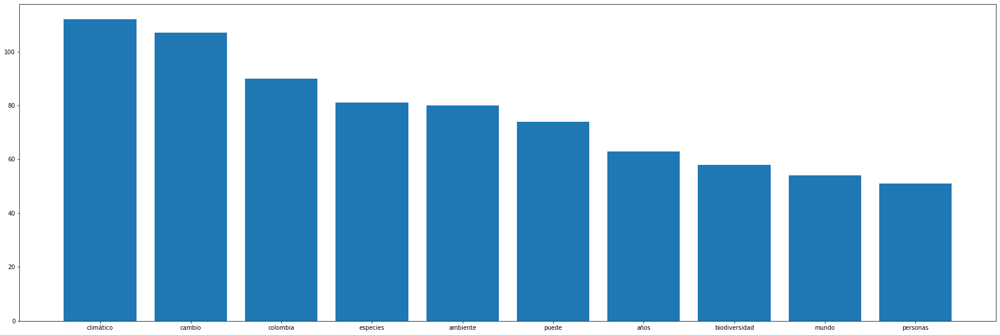

In [138]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

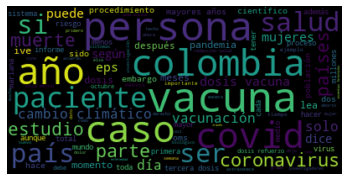

In [139]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### ──►*Change of the most frequent words week by week (Cambio de las palabras más frecuentes semana a semana).*


### 3. Categoría de Ciencia.


In [140]:
# Creating a connection to MongoDB.
client = MongoClient("localhost", 27017)
db = client["news"]
collection = db["elespectador-ciencia"]

In [141]:
# Creating a text index over all text fields
collection.create_index([('author', TEXT), ('title', TEXT), ('summary', TEXT), ('full_text', TEXT), ('datetime', TEXT)],default_language = 'spanish')

'author_text_title_text_summary_text_full_text_text_datetime_text'

### primera semana.

In [142]:
#Getting texts from the database.
textScience1W = []
for news in list(collection.find({"datetime":{'$lt': "23 ago.", '$gt':"10 sept"}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textScience1W.append(news["title"])
    textScience1W.append(news["summary"])
    textScience1W.append(news["full_text"])

In [143]:
#Join of the required texts.
textScience1W = " ".join(textScience1W)

In [144]:
textScience1W

'Diana Valencia, la colombiana que estudia vida en los exoplanetas La astrofísica planetaria fue reconocida con el Premio Paolo Farinella 2021, otorgado por la Sociedad Planetaria Europea, por ser una de las científicas que más conocen sobre exoplanetas, aquellos que no son parte del sistema solar. En la vida de Diana Valencia las matemáticas siempre han estado presentes. Desde los 11 años, cuando estaba en el colegio, asistía a olimpiadas matemáticas, pero cuando llegó el momento de escoger una carrera prefirió la física. “Pensé en enfocarme en la rama de matemáticas, pero, si te digo la verdad, dije: de pronto está muy difícil”, cuenta entre risas. “A mí siempre me causó curiosidad entender el mundo físico, cómo funciona y eso me lo ha permitido mi profesión”. (Lea todas las noticias sobre ciencia) A pesar de que recientemente ganó el Premio Paolo Farinella 2021, uno de los galardones más prestigiosos en física, por ser una de las científicas que más saben de los exoplanetas, que son

### - lowercasing (Transformación a minúsculas).

In [145]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textScience1W = textScience1W.lower() 

### - tokenization (Tokenización).

In [146]:
#Tokenization per sentences.

sentences = sent_tokenize(textScience1W)

print(sentences)

['diana valencia, la colombiana que estudia vida en los exoplanetas la astrofísica planetaria fue reconocida con el premio paolo farinella 2021, otorgado por la sociedad planetaria europea, por ser una de las científicas que más conocen sobre exoplanetas, aquellos que no son parte del sistema solar.', 'en la vida de diana valencia las matemáticas siempre han estado presentes.', 'desde los 11 años, cuando estaba en el colegio, asistía a olimpiadas matemáticas, pero cuando llegó el momento de escoger una carrera prefirió la física.', '“pensé en enfocarme en la rama de matemáticas, pero, si te digo la verdad, dije: de pronto está muy difícil”, cuenta entre risas.', '“a mí siempre me causó curiosidad entender el mundo físico, cómo funciona y eso me lo ha permitido mi profesión”.', '(lea todas las noticias sobre ciencia) a pesar de que recientemente ganó el premio paolo farinella 2021, uno de los galardones más prestigiosos en física, por ser una de las científicas que más saben de los exop

In [147]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

textEnvironment1W = tokenizer.tokenize(textScience1W)

print(words)

['vibrio', 'la', 'bacteria', 'indicadora', 'del', 'cambio', 'climático', 'que', 'está', 'en', 'aumento', 'a', 'este', 'patógeno', 'que', 'tiene', 'una', 'especie', 'que', 'causa', 'el', 'cólera', 'le', 'atraen', 'las', 'aguas', 'con', 'baja', 'salinidad', 'y', 'más', 'calientes', 'ambos', 'escenarios', 'que', 'están', 'creciendo', 'con', 'el', 'cambio', 'climático', 'luis', 'escobar', 'y', 'jaime', 'martínez', 'urtanza', 'autores', 'de', 'la', 'sección', 'de', 'enfermedades', 'infecciosas', 'de', 'the', 'lancet', 'countdown', 'explican', 'el', 'panorama', 'maría', 'mónica', 'monsalve', 'la', 'vibrio', 'es', 'como', 'un', 'barómetro', 'del', 'cambio', 'climático', 'un', 'organismo', 'modelo', 'que', 'sirve', 'para', 'establecer', 'las', 'señales', 'de', 'cambio', 'es', 'una', 'de', 'las', 'primeras', 'cosas', 'que', 'comenta', 'jaime', 'martínez', 'urtanza', 'parte', 'del', 'departamento', 'de', 'genética', 'y', 'microbiología', 'de', 'la', 'universidad', 'autónoma', 'de', 'barcelona', 

### -removing Stopwords (Remoción de las Stopwords).

In [148]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [149]:
#Removing Stopwords.

textScience1W_filtered_words = []
for w in words:
    if w not in stop_words:
        textScience1W_filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", textScience1W_filtered_words)

All words: ['vibrio', 'la', 'bacteria', 'indicadora', 'del', 'cambio', 'climático', 'que', 'está', 'en', 'aumento', 'a', 'este', 'patógeno', 'que', 'tiene', 'una', 'especie', 'que', 'causa', 'el', 'cólera', 'le', 'atraen', 'las', 'aguas', 'con', 'baja', 'salinidad', 'y', 'más', 'calientes', 'ambos', 'escenarios', 'que', 'están', 'creciendo', 'con', 'el', 'cambio', 'climático', 'luis', 'escobar', 'y', 'jaime', 'martínez', 'urtanza', 'autores', 'de', 'la', 'sección', 'de', 'enfermedades', 'infecciosas', 'de', 'the', 'lancet', 'countdown', 'explican', 'el', 'panorama', 'maría', 'mónica', 'monsalve', 'la', 'vibrio', 'es', 'como', 'un', 'barómetro', 'del', 'cambio', 'climático', 'un', 'organismo', 'modelo', 'que', 'sirve', 'para', 'establecer', 'las', 'señales', 'de', 'cambio', 'es', 'una', 'de', 'las', 'primeras', 'cosas', 'que', 'comenta', 'jaime', 'martínez', 'urtanza', 'parte', 'del', 'departamento', 'de', 'genética', 'y', 'microbiología', 'de', 'la', 'universidad', 'autónoma', 'de', 'b

### -part of speech (Parte del discurso).

In [150]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [151]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [152]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(textScience1W_filtered_words)

[('vibrio', 'ADJ'),
 ('bacteria', 'NOUN'),
 ('indicadora', 'ADJ'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('aumento', 'NOUN'),
 ('patógeno', 'ADJ'),
 ('especie', 'NOUN'),
 ('causa', 'NOUN'),
 ('cólera', 'PROPN'),
 ('atraen', 'VERB'),
 ('aguas', 'NOUN'),
 ('baja', 'ADJ'),
 ('salinidad', 'NOUN'),
 ('calientes', 'ADJ'),
 ('ambos', 'NUM'),
 ('escenarios', 'NOUN'),
 ('creciendo', 'VERB'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('luis', 'ADJ'),
 ('escobar', 'VERB'),
 ('jaime', 'NOUN'),
 ('martínez', 'ADJ'),
 ('urtanza', 'VERB'),
 ('autores', 'NOUN'),
 ('sección', 'NOUN'),
 ('enfermedades', 'NOUN'),
 ('infecciosas', 'ADJ'),
 ('the', 'PROPN'),
 ('lancet', 'PROPN'),
 ('countdown', 'PROPN'),
 ('explican', 'VERB'),
 ('panorama', 'NOUN'),
 ('maría', 'NOUN'),
 ('mónica', 'ADJ'),
 ('monsalve', 'VERB'),
 ('vibrio', 'NOUN'),
 ('barómetro', 'NOUN'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('organismo', 'NOUN'),
 ('modelo', 'NOUN'),
 ('sirve', 'VERB'),
 ('establecer', 'VERB'),
 ('señale

### -words distribution (Distribución de palabras).

In [153]:
frec_dist = FreqDist(textScience1W_filtered_words)

print(frec_dist)

<FreqDist with 5869 samples and 18397 outcomes>


In [154]:
frec_dist.most_common(5)

[('climático', 112),
 ('cambio', 107),
 ('colombia', 90),
 ('especies', 81),
 ('ambiente', 80)]

<BarContainer object of 10 artists>

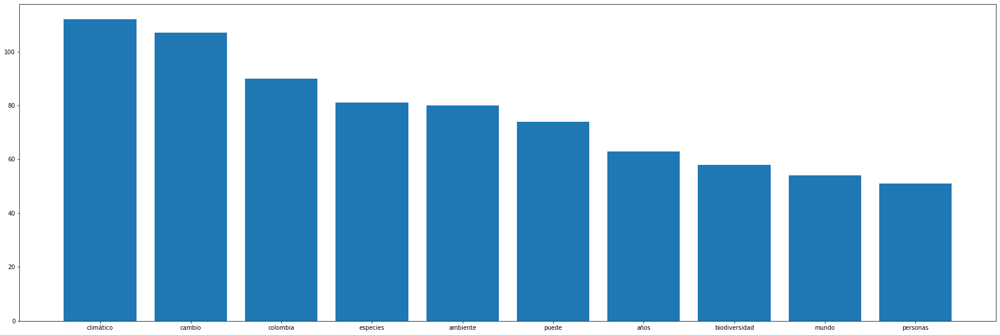

In [155]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

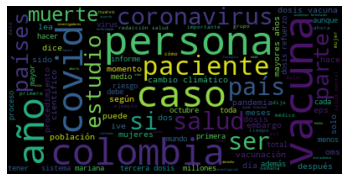

In [156]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### segunda semana.

In [157]:
#Getting texts from the database.
textScience2W = []
for news in list(collection.find({"datetime":{'$lt': "8 sept.", '$gt':"20 sept."}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textScience2W.append(news["title"])
    textScience2W.append(news["summary"])
    textScience2W.append(news["full_text"])

In [158]:
#Join of the required texts.
textScience2W = " ".join(textScience2W)

In [159]:
textScience2W

'Diana Valencia, la colombiana que estudia vida en los exoplanetas La astrofísica planetaria fue reconocida con el Premio Paolo Farinella 2021, otorgado por la Sociedad Planetaria Europea, por ser una de las científicas que más conocen sobre exoplanetas, aquellos que no son parte del sistema solar. En la vida de Diana Valencia las matemáticas siempre han estado presentes. Desde los 11 años, cuando estaba en el colegio, asistía a olimpiadas matemáticas, pero cuando llegó el momento de escoger una carrera prefirió la física. “Pensé en enfocarme en la rama de matemáticas, pero, si te digo la verdad, dije: de pronto está muy difícil”, cuenta entre risas. “A mí siempre me causó curiosidad entender el mundo físico, cómo funciona y eso me lo ha permitido mi profesión”. (Lea todas las noticias sobre ciencia) A pesar de que recientemente ganó el Premio Paolo Farinella 2021, uno de los galardones más prestigiosos en física, por ser una de las científicas que más saben de los exoplanetas, que son

### - lowercasing (Transformación a minúsculas).

In [160]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textScience2W = textScience2W.lower() 

### - tokenization (Tokenización).

In [161]:
#Tokenization per sentences.

sentences = sent_tokenize(textScience2W)

print(sentences)

['diana valencia, la colombiana que estudia vida en los exoplanetas la astrofísica planetaria fue reconocida con el premio paolo farinella 2021, otorgado por la sociedad planetaria europea, por ser una de las científicas que más conocen sobre exoplanetas, aquellos que no son parte del sistema solar.', 'en la vida de diana valencia las matemáticas siempre han estado presentes.', 'desde los 11 años, cuando estaba en el colegio, asistía a olimpiadas matemáticas, pero cuando llegó el momento de escoger una carrera prefirió la física.', '“pensé en enfocarme en la rama de matemáticas, pero, si te digo la verdad, dije: de pronto está muy difícil”, cuenta entre risas.', '“a mí siempre me causó curiosidad entender el mundo físico, cómo funciona y eso me lo ha permitido mi profesión”.', '(lea todas las noticias sobre ciencia) a pesar de que recientemente ganó el premio paolo farinella 2021, uno de los galardones más prestigiosos en física, por ser una de las científicas que más saben de los exop

In [162]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

textEnvironment2W = tokenizer.tokenize(textScience2W)

print(words)

['vibrio', 'la', 'bacteria', 'indicadora', 'del', 'cambio', 'climático', 'que', 'está', 'en', 'aumento', 'a', 'este', 'patógeno', 'que', 'tiene', 'una', 'especie', 'que', 'causa', 'el', 'cólera', 'le', 'atraen', 'las', 'aguas', 'con', 'baja', 'salinidad', 'y', 'más', 'calientes', 'ambos', 'escenarios', 'que', 'están', 'creciendo', 'con', 'el', 'cambio', 'climático', 'luis', 'escobar', 'y', 'jaime', 'martínez', 'urtanza', 'autores', 'de', 'la', 'sección', 'de', 'enfermedades', 'infecciosas', 'de', 'the', 'lancet', 'countdown', 'explican', 'el', 'panorama', 'maría', 'mónica', 'monsalve', 'la', 'vibrio', 'es', 'como', 'un', 'barómetro', 'del', 'cambio', 'climático', 'un', 'organismo', 'modelo', 'que', 'sirve', 'para', 'establecer', 'las', 'señales', 'de', 'cambio', 'es', 'una', 'de', 'las', 'primeras', 'cosas', 'que', 'comenta', 'jaime', 'martínez', 'urtanza', 'parte', 'del', 'departamento', 'de', 'genética', 'y', 'microbiología', 'de', 'la', 'universidad', 'autónoma', 'de', 'barcelona', 

### -removing Stopwords (Remoción de las Stopwords).

In [163]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [164]:
#Removing Stopwords.

textScience2W_filtered_words = []
for w in words:
    if w not in stop_words:
        textScience2W_filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", textScience2W_filtered_words)

All words: ['vibrio', 'la', 'bacteria', 'indicadora', 'del', 'cambio', 'climático', 'que', 'está', 'en', 'aumento', 'a', 'este', 'patógeno', 'que', 'tiene', 'una', 'especie', 'que', 'causa', 'el', 'cólera', 'le', 'atraen', 'las', 'aguas', 'con', 'baja', 'salinidad', 'y', 'más', 'calientes', 'ambos', 'escenarios', 'que', 'están', 'creciendo', 'con', 'el', 'cambio', 'climático', 'luis', 'escobar', 'y', 'jaime', 'martínez', 'urtanza', 'autores', 'de', 'la', 'sección', 'de', 'enfermedades', 'infecciosas', 'de', 'the', 'lancet', 'countdown', 'explican', 'el', 'panorama', 'maría', 'mónica', 'monsalve', 'la', 'vibrio', 'es', 'como', 'un', 'barómetro', 'del', 'cambio', 'climático', 'un', 'organismo', 'modelo', 'que', 'sirve', 'para', 'establecer', 'las', 'señales', 'de', 'cambio', 'es', 'una', 'de', 'las', 'primeras', 'cosas', 'que', 'comenta', 'jaime', 'martínez', 'urtanza', 'parte', 'del', 'departamento', 'de', 'genética', 'y', 'microbiología', 'de', 'la', 'universidad', 'autónoma', 'de', 'b

### -part of speech (Parte del discurso).

In [165]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [166]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [167]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(textScience2W_filtered_words)

[('vibrio', 'ADJ'),
 ('bacteria', 'NOUN'),
 ('indicadora', 'ADJ'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('aumento', 'NOUN'),
 ('patógeno', 'ADJ'),
 ('especie', 'NOUN'),
 ('causa', 'NOUN'),
 ('cólera', 'PROPN'),
 ('atraen', 'VERB'),
 ('aguas', 'NOUN'),
 ('baja', 'ADJ'),
 ('salinidad', 'NOUN'),
 ('calientes', 'ADJ'),
 ('ambos', 'NUM'),
 ('escenarios', 'NOUN'),
 ('creciendo', 'VERB'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('luis', 'ADJ'),
 ('escobar', 'VERB'),
 ('jaime', 'NOUN'),
 ('martínez', 'ADJ'),
 ('urtanza', 'VERB'),
 ('autores', 'NOUN'),
 ('sección', 'NOUN'),
 ('enfermedades', 'NOUN'),
 ('infecciosas', 'ADJ'),
 ('the', 'PROPN'),
 ('lancet', 'PROPN'),
 ('countdown', 'PROPN'),
 ('explican', 'VERB'),
 ('panorama', 'NOUN'),
 ('maría', 'NOUN'),
 ('mónica', 'ADJ'),
 ('monsalve', 'VERB'),
 ('vibrio', 'NOUN'),
 ('barómetro', 'NOUN'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('organismo', 'NOUN'),
 ('modelo', 'NOUN'),
 ('sirve', 'VERB'),
 ('establecer', 'VERB'),
 ('señale

### -words distribution (Distribución de palabras).

In [168]:
frec_dist = FreqDist(textScience2W_filtered_words)

print(frec_dist)

<FreqDist with 5869 samples and 18397 outcomes>


In [169]:
frec_dist.most_common(5)

[('climático', 112),
 ('cambio', 107),
 ('colombia', 90),
 ('especies', 81),
 ('ambiente', 80)]

<BarContainer object of 10 artists>

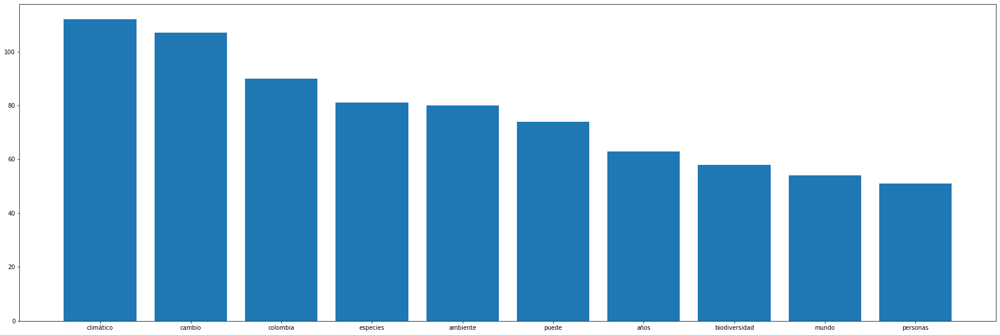

In [170]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

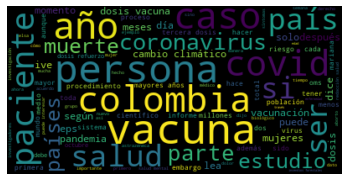

In [171]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### tercera semana.

In [172]:
#Getting texts from the database.
textScience3W = []
for news in list(collection.find({"datetime":{'$lt': "2 oct.", '$gt':"11 oct."}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textScience3W.append(news["title"])
    textScience3W.append(news["summary"])
    textScience3W.append(news["full_text"])

In [173]:
#Join of the required texts.
textScience3W = " ".join(textScience3W)

In [174]:
textScience3W

'Elena Stashenko, profesora de la UIS, elegida entre científicos más influyentes  Por tercer año la investigadora rusa fue incluida entre los 60 científicos analíticos más influyentes del mundo de “The Analytical Scientist”, una revista británica especializada en este campo. Desde 1983, Stashenko trabaja como docente e investigadora la Escuela de Química de la Facultad de Ciencias de la UIS. Todos los años, desde 2013, la revista “The Analytical Scientist”, una publicación británica especializada en ciencia, publica la lista de los 60 científicos analíticos más influyentes del mundo y los 10 más importantes de cada región. Por tercer año aparece el nombre de la investigadora y química orgánica Elena Stashenko, quien llegó a Santander en la década de los 80. (Lea: Otro año sin mujeres galardonadas en los Nobel de Física, Química y Medicina) De acuerdo con la revista, este reconocimiento es otorgado basado “en las nominaciones realizadas por la comunidad científica lectora de la revista,

### - lowercasing (Transformación a minúsculas).

In [175]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textScience3W = textScience3W.lower() 

### - tokenization (Tokenización).

In [176]:
#Tokenization per sentences.

sentences = sent_tokenize(textScience3W)

print(sentences)

['elena stashenko, profesora de la uis, elegida entre científicos más influyentes  por tercer año la investigadora rusa fue incluida entre los 60 científicos analíticos más influyentes del mundo de “the analytical scientist”, una revista británica especializada en este campo.', 'desde 1983, stashenko trabaja como docente e investigadora la escuela de química de la facultad de ciencias de la uis.', 'todos los años, desde 2013, la revista “the analytical scientist”, una publicación británica especializada en ciencia, publica la lista de los 60 científicos analíticos más influyentes del mundo y los 10 más importantes de cada región.', 'por tercer año aparece el nombre de la investigadora y química orgánica elena stashenko, quien llegó a santander en la década de los 80.', '(lea: otro año sin mujeres galardonadas en los nobel de física, química y medicina) de acuerdo con la revista, este reconocimiento es otorgado basado “en las nominaciones realizadas por la comunidad científica lectora d

In [177]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

textEnvironment3W = tokenizer.tokenize(textScience3W)

print(words)

['vibrio', 'la', 'bacteria', 'indicadora', 'del', 'cambio', 'climático', 'que', 'está', 'en', 'aumento', 'a', 'este', 'patógeno', 'que', 'tiene', 'una', 'especie', 'que', 'causa', 'el', 'cólera', 'le', 'atraen', 'las', 'aguas', 'con', 'baja', 'salinidad', 'y', 'más', 'calientes', 'ambos', 'escenarios', 'que', 'están', 'creciendo', 'con', 'el', 'cambio', 'climático', 'luis', 'escobar', 'y', 'jaime', 'martínez', 'urtanza', 'autores', 'de', 'la', 'sección', 'de', 'enfermedades', 'infecciosas', 'de', 'the', 'lancet', 'countdown', 'explican', 'el', 'panorama', 'maría', 'mónica', 'monsalve', 'la', 'vibrio', 'es', 'como', 'un', 'barómetro', 'del', 'cambio', 'climático', 'un', 'organismo', 'modelo', 'que', 'sirve', 'para', 'establecer', 'las', 'señales', 'de', 'cambio', 'es', 'una', 'de', 'las', 'primeras', 'cosas', 'que', 'comenta', 'jaime', 'martínez', 'urtanza', 'parte', 'del', 'departamento', 'de', 'genética', 'y', 'microbiología', 'de', 'la', 'universidad', 'autónoma', 'de', 'barcelona', 

### -removing Stopwords (Remoción de las Stopwords).

In [178]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [179]:
#Removing Stopwords.

textScience3W_filtered_words = []
for w in words:
    if w not in stop_words:
        textScience3W_filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", textScience3W_filtered_words)

All words: ['vibrio', 'la', 'bacteria', 'indicadora', 'del', 'cambio', 'climático', 'que', 'está', 'en', 'aumento', 'a', 'este', 'patógeno', 'que', 'tiene', 'una', 'especie', 'que', 'causa', 'el', 'cólera', 'le', 'atraen', 'las', 'aguas', 'con', 'baja', 'salinidad', 'y', 'más', 'calientes', 'ambos', 'escenarios', 'que', 'están', 'creciendo', 'con', 'el', 'cambio', 'climático', 'luis', 'escobar', 'y', 'jaime', 'martínez', 'urtanza', 'autores', 'de', 'la', 'sección', 'de', 'enfermedades', 'infecciosas', 'de', 'the', 'lancet', 'countdown', 'explican', 'el', 'panorama', 'maría', 'mónica', 'monsalve', 'la', 'vibrio', 'es', 'como', 'un', 'barómetro', 'del', 'cambio', 'climático', 'un', 'organismo', 'modelo', 'que', 'sirve', 'para', 'establecer', 'las', 'señales', 'de', 'cambio', 'es', 'una', 'de', 'las', 'primeras', 'cosas', 'que', 'comenta', 'jaime', 'martínez', 'urtanza', 'parte', 'del', 'departamento', 'de', 'genética', 'y', 'microbiología', 'de', 'la', 'universidad', 'autónoma', 'de', 'b

### -part of speech (Parte del discurso).

In [180]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [181]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [182]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(textScience3W_filtered_words)

[('vibrio', 'ADJ'),
 ('bacteria', 'NOUN'),
 ('indicadora', 'ADJ'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('aumento', 'NOUN'),
 ('patógeno', 'ADJ'),
 ('especie', 'NOUN'),
 ('causa', 'NOUN'),
 ('cólera', 'PROPN'),
 ('atraen', 'VERB'),
 ('aguas', 'NOUN'),
 ('baja', 'ADJ'),
 ('salinidad', 'NOUN'),
 ('calientes', 'ADJ'),
 ('ambos', 'NUM'),
 ('escenarios', 'NOUN'),
 ('creciendo', 'VERB'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('luis', 'ADJ'),
 ('escobar', 'VERB'),
 ('jaime', 'NOUN'),
 ('martínez', 'ADJ'),
 ('urtanza', 'VERB'),
 ('autores', 'NOUN'),
 ('sección', 'NOUN'),
 ('enfermedades', 'NOUN'),
 ('infecciosas', 'ADJ'),
 ('the', 'PROPN'),
 ('lancet', 'PROPN'),
 ('countdown', 'PROPN'),
 ('explican', 'VERB'),
 ('panorama', 'NOUN'),
 ('maría', 'NOUN'),
 ('mónica', 'ADJ'),
 ('monsalve', 'VERB'),
 ('vibrio', 'NOUN'),
 ('barómetro', 'NOUN'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('organismo', 'NOUN'),
 ('modelo', 'NOUN'),
 ('sirve', 'VERB'),
 ('establecer', 'VERB'),
 ('señale

### -words distribution (Distribución de palabras).

In [183]:
frec_dist = FreqDist(textScience3W_filtered_words)

print(frec_dist)

<FreqDist with 5869 samples and 18397 outcomes>


In [184]:
frec_dist.most_common(5)

[('climático', 112),
 ('cambio', 107),
 ('colombia', 90),
 ('especies', 81),
 ('ambiente', 80)]

<BarContainer object of 10 artists>

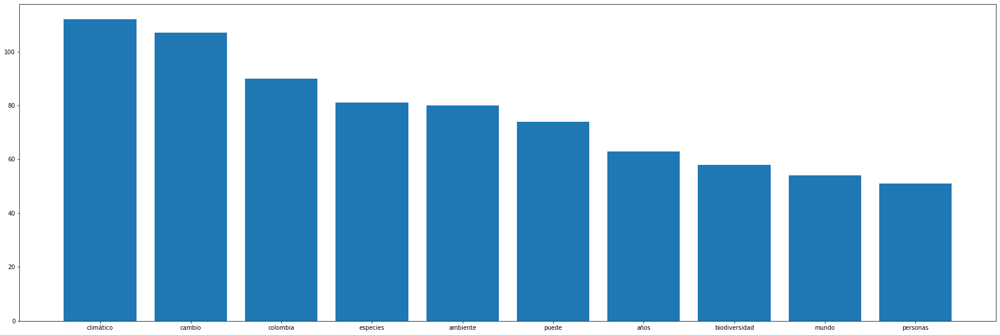

In [185]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

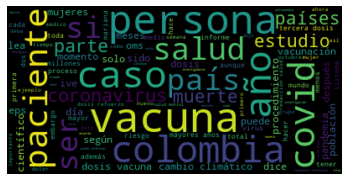

In [186]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### ──►*Analyzing the change of the most frequent words by subject categories (Analizando el cambio de las palabras más frecuentes por categorías de temas).*

In [187]:
#Getting texts from the database.
AlltextScience = []
for news in list(collection.find({}, {"title": 1, "author":1 ,"summary": 1, "full_text": 1, "_id": 0})):
    AlltextScience.append(news["title"])
    AlltextScience.append(news["summary"])
    AlltextScience.append(news["author"])
    AlltextScience.append(news["full_text"])

In [188]:
#Join of the required texts.
AlltextScience = " ".join(AlltextScience)

In [189]:
AlltextScience

'Diana Valencia, la colombiana que estudia vida en los exoplanetas La astrofísica planetaria fue reconocida con el Premio Paolo Farinella 2021, otorgado por la Sociedad Planetaria Europea, por ser una de las científicas que más conocen sobre exoplanetas, aquellos que no son parte del sistema solar. Paula Casas Mogollón En la vida de Diana Valencia las matemáticas siempre han estado presentes. Desde los 11 años, cuando estaba en el colegio, asistía a olimpiadas matemáticas, pero cuando llegó el momento de escoger una carrera prefirió la física. “Pensé en enfocarme en la rama de matemáticas, pero, si te digo la verdad, dije: de pronto está muy difícil”, cuenta entre risas. “A mí siempre me causó curiosidad entender el mundo físico, cómo funciona y eso me lo ha permitido mi profesión”. (Lea todas las noticias sobre ciencia) A pesar de que recientemente ganó el Premio Paolo Farinella 2021, uno de los galardones más prestigiosos en física, por ser una de las científicas que más saben de los

### - lowercasing (Transformación a minúsculas).

In [190]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
AlltextScience = AlltextScience.lower() 

### - tokenization (Tokenización).

In [191]:
#Tokenization per sentences.

sentences = sent_tokenize(AlltextScience)

print(sentences)

['diana valencia, la colombiana que estudia vida en los exoplanetas la astrofísica planetaria fue reconocida con el premio paolo farinella 2021, otorgado por la sociedad planetaria europea, por ser una de las científicas que más conocen sobre exoplanetas, aquellos que no son parte del sistema solar.', 'paula casas mogollón en la vida de diana valencia las matemáticas siempre han estado presentes.', 'desde los 11 años, cuando estaba en el colegio, asistía a olimpiadas matemáticas, pero cuando llegó el momento de escoger una carrera prefirió la física.', '“pensé en enfocarme en la rama de matemáticas, pero, si te digo la verdad, dije: de pronto está muy difícil”, cuenta entre risas.', '“a mí siempre me causó curiosidad entender el mundo físico, cómo funciona y eso me lo ha permitido mi profesión”.', '(lea todas las noticias sobre ciencia) a pesar de que recientemente ganó el premio paolo farinella 2021, uno de los galardones más prestigiosos en física, por ser una de las científicas que 

In [192]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

AlltextScience = tokenizer.tokenize(AlltextScience)

print(words)

['vibrio', 'la', 'bacteria', 'indicadora', 'del', 'cambio', 'climático', 'que', 'está', 'en', 'aumento', 'a', 'este', 'patógeno', 'que', 'tiene', 'una', 'especie', 'que', 'causa', 'el', 'cólera', 'le', 'atraen', 'las', 'aguas', 'con', 'baja', 'salinidad', 'y', 'más', 'calientes', 'ambos', 'escenarios', 'que', 'están', 'creciendo', 'con', 'el', 'cambio', 'climático', 'luis', 'escobar', 'y', 'jaime', 'martínez', 'urtanza', 'autores', 'de', 'la', 'sección', 'de', 'enfermedades', 'infecciosas', 'de', 'the', 'lancet', 'countdown', 'explican', 'el', 'panorama', 'maría', 'mónica', 'monsalve', 'la', 'vibrio', 'es', 'como', 'un', 'barómetro', 'del', 'cambio', 'climático', 'un', 'organismo', 'modelo', 'que', 'sirve', 'para', 'establecer', 'las', 'señales', 'de', 'cambio', 'es', 'una', 'de', 'las', 'primeras', 'cosas', 'que', 'comenta', 'jaime', 'martínez', 'urtanza', 'parte', 'del', 'departamento', 'de', 'genética', 'y', 'microbiología', 'de', 'la', 'universidad', 'autónoma', 'de', 'barcelona', 

### -removing Stopwords (Remoción de las Stopwords).

In [193]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [194]:
#Removing Stopwords.

AlltextScience_filtered_words = []
for w in words:
    if w not in stop_words:
        AlltextScience_filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", AlltextScience_filtered_words)

All words: ['vibrio', 'la', 'bacteria', 'indicadora', 'del', 'cambio', 'climático', 'que', 'está', 'en', 'aumento', 'a', 'este', 'patógeno', 'que', 'tiene', 'una', 'especie', 'que', 'causa', 'el', 'cólera', 'le', 'atraen', 'las', 'aguas', 'con', 'baja', 'salinidad', 'y', 'más', 'calientes', 'ambos', 'escenarios', 'que', 'están', 'creciendo', 'con', 'el', 'cambio', 'climático', 'luis', 'escobar', 'y', 'jaime', 'martínez', 'urtanza', 'autores', 'de', 'la', 'sección', 'de', 'enfermedades', 'infecciosas', 'de', 'the', 'lancet', 'countdown', 'explican', 'el', 'panorama', 'maría', 'mónica', 'monsalve', 'la', 'vibrio', 'es', 'como', 'un', 'barómetro', 'del', 'cambio', 'climático', 'un', 'organismo', 'modelo', 'que', 'sirve', 'para', 'establecer', 'las', 'señales', 'de', 'cambio', 'es', 'una', 'de', 'las', 'primeras', 'cosas', 'que', 'comenta', 'jaime', 'martínez', 'urtanza', 'parte', 'del', 'departamento', 'de', 'genética', 'y', 'microbiología', 'de', 'la', 'universidad', 'autónoma', 'de', 'b

### -part of speech (Parte del discurso).

In [195]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [196]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [197]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(textScience3W_filtered_words)

[('vibrio', 'ADJ'),
 ('bacteria', 'NOUN'),
 ('indicadora', 'ADJ'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('aumento', 'NOUN'),
 ('patógeno', 'ADJ'),
 ('especie', 'NOUN'),
 ('causa', 'NOUN'),
 ('cólera', 'PROPN'),
 ('atraen', 'VERB'),
 ('aguas', 'NOUN'),
 ('baja', 'ADJ'),
 ('salinidad', 'NOUN'),
 ('calientes', 'ADJ'),
 ('ambos', 'NUM'),
 ('escenarios', 'NOUN'),
 ('creciendo', 'VERB'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('luis', 'ADJ'),
 ('escobar', 'VERB'),
 ('jaime', 'NOUN'),
 ('martínez', 'ADJ'),
 ('urtanza', 'VERB'),
 ('autores', 'NOUN'),
 ('sección', 'NOUN'),
 ('enfermedades', 'NOUN'),
 ('infecciosas', 'ADJ'),
 ('the', 'PROPN'),
 ('lancet', 'PROPN'),
 ('countdown', 'PROPN'),
 ('explican', 'VERB'),
 ('panorama', 'NOUN'),
 ('maría', 'NOUN'),
 ('mónica', 'ADJ'),
 ('monsalve', 'VERB'),
 ('vibrio', 'NOUN'),
 ('barómetro', 'NOUN'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('organismo', 'NOUN'),
 ('modelo', 'NOUN'),
 ('sirve', 'VERB'),
 ('establecer', 'VERB'),
 ('señale

### -words distribution (Distribución de palabras).

In [198]:
frec_dist = FreqDist(textScience3W_filtered_words)

print(frec_dist)

<FreqDist with 5869 samples and 18397 outcomes>


In [199]:
frec_dist.most_common(5)

[('climático', 112),
 ('cambio', 107),
 ('colombia', 90),
 ('especies', 81),
 ('ambiente', 80)]

<BarContainer object of 10 artists>

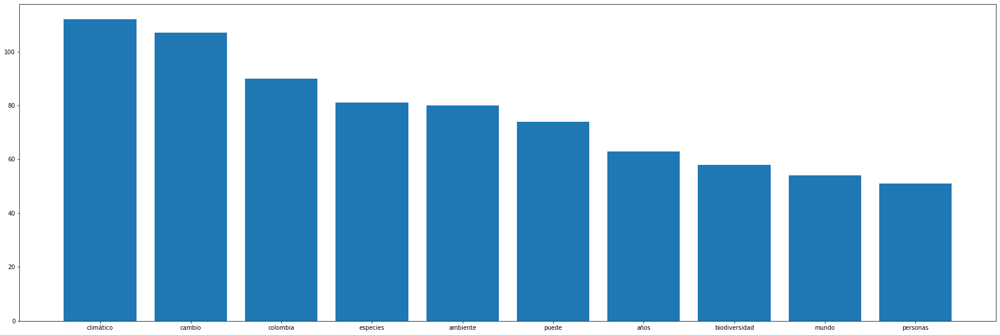

In [200]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

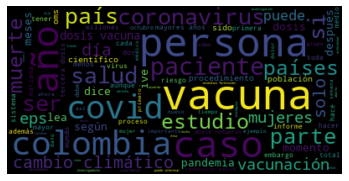

In [201]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### ──►*Change of the most frequent words week by week (Cambio de las palabras más frecuentes semana a semana).*

### 4. Categoría de Tecnología.


In [202]:
# Creating a connection to MongoDB
client = MongoClient("localhost", 27017)
db = client["news"]
collection = db["elespectador-tecnologia"]

### primera semana.

In [203]:
#Getting texts from the database.
textTecno = []
for news in list(collection.find({"datetime":{'$lt':"22 oct", '$gt':"17 oct"}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textTecno.append(news["title"])
    textTecno.append(news["summary"])
    textTecno.append(news["full_text"])

In [204]:
# Creating a text index over all text fields
collection.create_index([('author', TEXT), ('title', TEXT), ('summary', TEXT), ('full_text', TEXT), ('datetime', TEXT)],default_language = 'spanish')

'author_text_title_text_summary_text_full_text_text_datetime_text'

In [205]:
#Join of the required texts.
textTecno = " ".join(textTecno)

In [206]:
textTecno

'Google bajará comisión a suscripciones en tienda de aplicaciones A partir del 1 de enero, Google Play Store cobrará a las aplicaciones de suscripción de terceros una comisión del 15 %, informó la compañía el jueves. Anteriormente, a las aplicaciones de suscripción se les cobraba un 30 %. Google reducirá las comisiones que cobra por los servicios de suscripción en su tienda de aplicaciones tras la presión de los desarrolladores y los legisladores. A partir del 1 de enero, Google Play Store cobrará a las aplicaciones de suscripción de terceros una comisión del 15%, informó la compañía el jueves. Anteriormente, a las aplicaciones de suscripción se les cobraba un 30% durante el primer año y luego un 15%. Google también cobraba el 15% por el primer US$1 millón de ingresos. Lea también: Google lanza Pixel 6, la familia de celulares más rápida de la marca Google explicó que el cambio se debe a que “la rotación de clientes hace que sea difícil para las empresas de suscripción beneficiarse” de

### - lowercasing (Transformación a minúsculas).

In [207]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textTecno = textTecno.lower()

### - tokenization (Tokenización).

In [208]:
#Tokenization per sentences.

sentences = sent_tokenize(textTecno)

print(sentences)

['google bajará comisión a suscripciones en tienda de aplicaciones a partir del 1 de enero, google play store cobrará a las aplicaciones de suscripción de terceros una comisión del 15 %, informó la compañía el jueves.', 'anteriormente, a las aplicaciones de suscripción se les cobraba un 30 %.', 'google reducirá las comisiones que cobra por los servicios de suscripción en su tienda de aplicaciones tras la presión de los desarrolladores y los legisladores.', 'a partir del 1 de enero, google play store cobrará a las aplicaciones de suscripción de terceros una comisión del 15%, informó la compañía el jueves.', 'anteriormente, a las aplicaciones de suscripción se les cobraba un 30% durante el primer año y luego un 15%.', 'google también cobraba el 15% por el primer us$1 millón de ingresos.', 'lea también: google lanza pixel 6, la familia de celulares más rápida de la marca google explicó que el cambio se debe a que “la rotación de clientes hace que sea difícil para las empresas de suscripci

In [209]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textTecno)

print(words)

['google', 'bajará', 'comisión', 'a', 'suscripciones', 'en', 'tienda', 'de', 'aplicaciones', 'a', 'partir', 'del', '1', 'de', 'enero', 'google', 'play', 'store', 'cobrará', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'de', 'terceros', 'una', 'comisión', 'del', '15', 'informó', 'la', 'compañía', 'el', 'jueves', 'anteriormente', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'se', 'les', 'cobraba', 'un', '30', 'google', 'reducirá', 'las', 'comisiones', 'que', 'cobra', 'por', 'los', 'servicios', 'de', 'suscripción', 'en', 'su', 'tienda', 'de', 'aplicaciones', 'tras', 'la', 'presión', 'de', 'los', 'desarrolladores', 'y', 'los', 'legisladores', 'a', 'partir', 'del', '1', 'de', 'enero', 'google', 'play', 'store', 'cobrará', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'de', 'terceros', 'una', 'comisión', 'del', '15', 'informó', 'la', 'compañía', 'el', 'jueves', 'anteriormente', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'se', 'les', 'cobraba', 'un', '30', 'durante', 'el', 'p

### -removing Stopwords (Remoción de las Stopwords).

In [210]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [211]:
#Removing Stopwords.

filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['google', 'bajará', 'comisión', 'a', 'suscripciones', 'en', 'tienda', 'de', 'aplicaciones', 'a', 'partir', 'del', '1', 'de', 'enero', 'google', 'play', 'store', 'cobrará', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'de', 'terceros', 'una', 'comisión', 'del', '15', 'informó', 'la', 'compañía', 'el', 'jueves', 'anteriormente', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'se', 'les', 'cobraba', 'un', '30', 'google', 'reducirá', 'las', 'comisiones', 'que', 'cobra', 'por', 'los', 'servicios', 'de', 'suscripción', 'en', 'su', 'tienda', 'de', 'aplicaciones', 'tras', 'la', 'presión', 'de', 'los', 'desarrolladores', 'y', 'los', 'legisladores', 'a', 'partir', 'del', '1', 'de', 'enero', 'google', 'play', 'store', 'cobrará', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'de', 'terceros', 'una', 'comisión', 'del', '15', 'informó', 'la', 'compañía', 'el', 'jueves', 'anteriormente', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'se', 'les', 'cobraba', 'un', '30', 'durante

### -part of speech (Parte del discurso).

In [212]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [213]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [214]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(filtered_words)

[('google', 'NOUN'),
 ('bajará', 'VERB'),
 ('comisión', 'NOUN'),
 ('suscripciones', 'NOUN'),
 ('tienda', 'NOUN'),
 ('aplicaciones', 'NOUN'),
 ('partir', 'VERB'),
 ('1', 'NUM'),
 ('enero', 'NOUN'),
 ('google', 'NOUN'),
 ('play', 'NOUN'),
 ('store', 'NOUN'),
 ('cobrará', 'VERB'),
 ('aplicaciones', 'NOUN'),
 ('suscripción', 'NOUN'),
 ('terceros', 'ADJ'),
 ('comisión', 'NOUN'),
 ('15', 'NUM'),
 ('informó', 'VERB'),
 ('compañía', 'NOUN'),
 ('jueves', 'NOUN'),
 ('anteriormente', 'ADV'),
 ('aplicaciones', 'NOUN'),
 ('suscripción', 'NOUN'),
 ('cobraba', 'AUX'),
 ('30', 'NUM'),
 ('google', 'NOUN'),
 ('reducirá', 'VERB'),
 ('comisiones', 'NOUN'),
 ('cobra', 'VERB'),
 ('servicios', 'NOUN'),
 ('suscripción', 'NOUN'),
 ('tienda', 'NOUN'),
 ('aplicaciones', 'NOUN'),
 ('tras', 'ADP'),
 ('presión', 'NOUN'),
 ('desarrolladores', 'ADJ'),
 ('legisladores', 'NOUN'),
 ('partir', 'VERB'),
 ('1', 'NUM'),
 ('enero', 'NOUN'),
 ('google', 'NOUN'),
 ('play', 'NOUN'),
 ('store', 'NOUN'),
 ('cobrará', 'VERB'),
 ('

### -words distribution (Distribución de palabras).

In [215]:
frec_dist = FreqDist(filtered_words)

print(frec_dist)

<FreqDist with 1622 samples and 3182 outcomes>


In [216]:
frec_dist.most_common(5)

[('facebook', 27),
 ('aplicaciones', 23),
 ('google', 22),
 ('año', 16),
 ('us', 15)]

<BarContainer object of 10 artists>

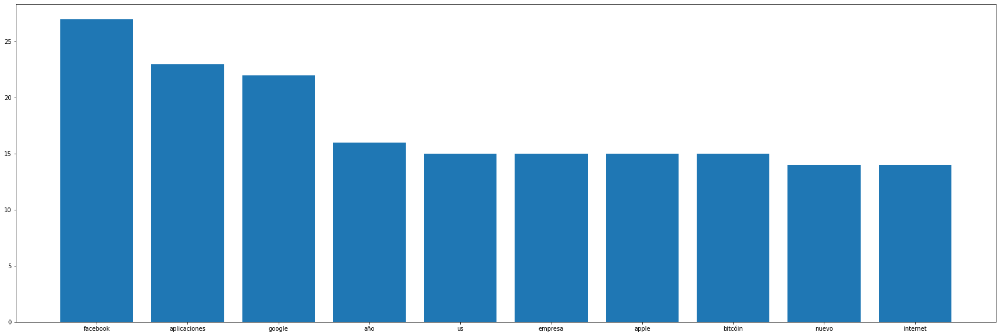

In [217]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

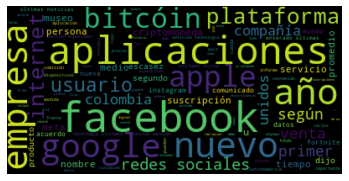

In [218]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### segunda semana.

In [219]:
#Getting texts from the database.
textTecno2 = []
for news in list(collection.find({"datetime":{'$lt':"17 oct", '$gt':"10 oct"}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textTecno2.append(news["title"])
    textTecno2.append(news["summary"])
    textTecno2.append(news["full_text"])

In [220]:
# Creating a text index over all text fields
collection.create_index([('author', TEXT), ('title', TEXT), ('summary', TEXT), ('full_text', TEXT), ('datetime', TEXT)],default_language = 'spanish')

'author_text_title_text_summary_text_full_text_text_datetime_text'

In [221]:
#Join of the required texts.
textTecno2 = " ".join(textTecno2)

In [222]:
textTecno2

'Tinder lanza función para encontrar acompañante para bodas Los usuarios podrán indicar si están buscando acompañante o si están dispuestos a servir como pareja en alguna boda.  La aplicación de citas Tinder ha lanzado su nueva función ‘Plus One’ (‘más uno’, en inglés), con la que busca ayudar a sus usuarios a que conozcan a otras personas para que sean sus acompañantes para asistir a bodas. También te puede interesar: Precio del bitcóin vuelve a superar los US$60.000 Desde este jueves, los usuarios de Tinder podrán indicar en la pestaña explorar de la aplicación si están buscando acompañantes para una boda o si ellos mismos están dispuestos a ser el ‘más uno’ de otras personas, como ha informado la compañía en un comunicado. La plataforma especializada en bodas WeddingWire espera que se produzca un aumento de hasta el 20 % en las bodas en los años 2021 y 2022 debido a las ceremonias pospuestas por la pandemia. Esto coincide con un crecimiento de las menciones a ‘más uno’ del 45 % en p

### - lowercasing (Transformación a minúsculas).

In [223]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textTecno2 = textTecno2.lower() 

### - tokenization (Tokenización).

In [224]:
#Tokenization per sentences.

sentences = sent_tokenize(textTecno2)

print(sentences)

['tinder lanza función para encontrar acompañante para bodas los usuarios podrán indicar si están buscando acompañante o si están dispuestos a servir como pareja en alguna boda.', 'la aplicación de citas tinder ha lanzado su nueva función ‘plus one’ (‘más uno’, en inglés), con la que busca ayudar a sus usuarios a que conozcan a otras personas para que sean sus acompañantes para asistir a bodas.', 'también te puede interesar: precio del bitcóin vuelve a superar los us$60.000 desde este jueves, los usuarios de tinder podrán indicar en la pestaña explorar de la aplicación si están buscando acompañantes para una boda o si ellos mismos están dispuestos a ser el ‘más uno’ de otras personas, como ha informado la compañía en un comunicado.', 'la plataforma especializada en bodas weddingwire espera que se produzca un aumento de hasta el 20 % en las bodas en los años 2021 y 2022 debido a las ceremonias pospuestas por la pandemia.', 'esto coincide con un crecimiento de las menciones a ‘más uno’ d

In [225]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textTecno2)

print(words)

['tinder', 'lanza', 'función', 'para', 'encontrar', 'acompañante', 'para', 'bodas', 'los', 'usuarios', 'podrán', 'indicar', 'si', 'están', 'buscando', 'acompañante', 'o', 'si', 'están', 'dispuestos', 'a', 'servir', 'como', 'pareja', 'en', 'alguna', 'boda', 'la', 'aplicación', 'de', 'citas', 'tinder', 'ha', 'lanzado', 'su', 'nueva', 'función', 'plus', 'one', 'más', 'uno', 'en', 'inglés', 'con', 'la', 'que', 'busca', 'ayudar', 'a', 'sus', 'usuarios', 'a', 'que', 'conozcan', 'a', 'otras', 'personas', 'para', 'que', 'sean', 'sus', 'acompañantes', 'para', 'asistir', 'a', 'bodas', 'también', 'te', 'puede', 'interesar', 'precio', 'del', 'bitcóin', 'vuelve', 'a', 'superar', 'los', 'us', '60', '000', 'desde', 'este', 'jueves', 'los', 'usuarios', 'de', 'tinder', 'podrán', 'indicar', 'en', 'la', 'pestaña', 'explorar', 'de', 'la', 'aplicación', 'si', 'están', 'buscando', 'acompañantes', 'para', 'una', 'boda', 'o', 'si', 'ellos', 'mismos', 'están', 'dispuestos', 'a', 'ser', 'el', 'más', 'uno', 'de'

### -removing Stopwords (Remoción de las Stopwords).

In [226]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [227]:
#Removing Stopwords.

filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['tinder', 'lanza', 'función', 'para', 'encontrar', 'acompañante', 'para', 'bodas', 'los', 'usuarios', 'podrán', 'indicar', 'si', 'están', 'buscando', 'acompañante', 'o', 'si', 'están', 'dispuestos', 'a', 'servir', 'como', 'pareja', 'en', 'alguna', 'boda', 'la', 'aplicación', 'de', 'citas', 'tinder', 'ha', 'lanzado', 'su', 'nueva', 'función', 'plus', 'one', 'más', 'uno', 'en', 'inglés', 'con', 'la', 'que', 'busca', 'ayudar', 'a', 'sus', 'usuarios', 'a', 'que', 'conozcan', 'a', 'otras', 'personas', 'para', 'que', 'sean', 'sus', 'acompañantes', 'para', 'asistir', 'a', 'bodas', 'también', 'te', 'puede', 'interesar', 'precio', 'del', 'bitcóin', 'vuelve', 'a', 'superar', 'los', 'us', '60', '000', 'desde', 'este', 'jueves', 'los', 'usuarios', 'de', 'tinder', 'podrán', 'indicar', 'en', 'la', 'pestaña', 'explorar', 'de', 'la', 'aplicación', 'si', 'están', 'buscando', 'acompañantes', 'para', 'una', 'boda', 'o', 'si', 'ellos', 'mismos', 'están', 'dispuestos', 'a', 'ser', 'el', 'más', 

### -part of speech (Parte del discurso).

In [228]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [229]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [230]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(filtered_words)

[('tinder', 'VERB'),
 ('lanza', 'VERB'),
 ('función', 'NOUN'),
 ('encontrar', 'VERB'),
 ('acompañante', 'NOUN'),
 ('bodas', 'NOUN'),
 ('usuarios', 'ADJ'),
 ('podrán', 'AUX'),
 ('indicar', 'AUX'),
 ('si', 'SCONJ'),
 ('buscando', 'VERB'),
 ('acompañante', 'NOUN'),
 ('si', 'SCONJ'),
 ('dispuestos', 'ADJ'),
 ('servir', 'VERB'),
 ('pareja', 'NOUN'),
 ('alguna', 'DET'),
 ('boda', 'NOUN'),
 ('aplicación', 'NOUN'),
 ('citas', 'NOUN'),
 ('tinder', 'VERB'),
 ('lanzado', 'VERB'),
 ('nueva', 'ADJ'),
 ('función', 'NOUN'),
 ('plus', 'NOUN'),
 ('one', 'NOUN'),
 ('inglés', 'ADJ'),
 ('busca', 'VERB'),
 ('ayudar', 'VERB'),
 ('usuarios', 'ADJ'),
 ('conozcan', 'VERB'),
 ('personas', 'NOUN'),
 ('acompañantes', 'NOUN'),
 ('asistir', 'VERB'),
 ('bodas', 'NOUN'),
 ('puede', 'AUX'),
 ('interesar', 'VERB'),
 ('precio', 'NOUN'),
 ('bitcóin', 'ADJ'),
 ('vuelve', 'AUX'),
 ('superar', 'VERB'),
 ('us', 'PRON'),
 ('60', 'NUM'),
 ('000', 'NUM'),
 ('jueves', 'NOUN'),
 ('usuarios', 'ADJ'),
 ('tinder', 'VERB'),
 ('podrán

### -words distribution (Distribución de palabras).

In [231]:
frec_dist = FreqDist(filtered_words)

print(frec_dist)

<FreqDist with 1832 samples and 3343 outcomes>


In [232]:
frec_dist.most_common(5)

[('facebook', 26),
 ('usuarios', 16),
 ('compañía', 16),
 ('china', 16),
 ('datos', 15)]

<BarContainer object of 10 artists>

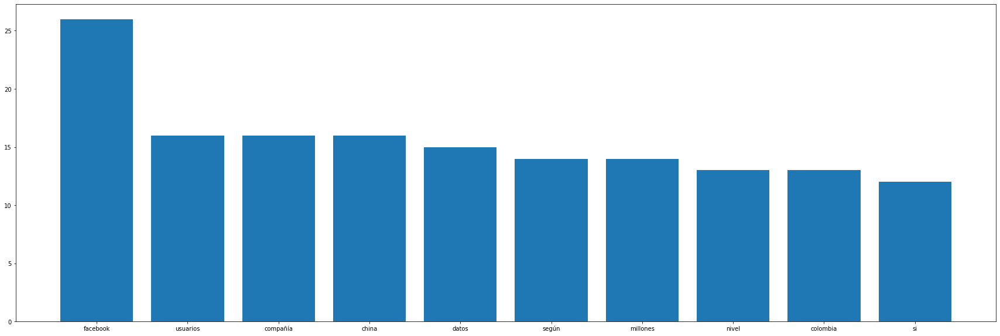

In [233]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

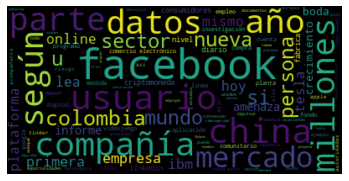

In [234]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### tercera semana.

In [235]:
#Getting texts from the database.
textTecno3 = []
for news in list(collection.find({"datetime":{'$lt':"9 oct", '$gt':"3 oct"}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textTecno3.append(news["title"])
    textTecno3.append(news["summary"])
    textTecno3.append(news["full_text"])

In [236]:
# Creating a text index over all text fields
collection.create_index([('author', TEXT), ('title', TEXT), ('summary', TEXT), ('full_text', TEXT), ('datetime', TEXT)],default_language = 'spanish')

'author_text_title_text_summary_text_full_text_text_datetime_text'

In [237]:
#Join of the required texts.
textTecno3 = " ".join(textTecno3)

In [238]:
textTecno3

'Far Cry 6 ya está disponible para PC y consolas con su mecánica de guerrillas El videojuego se ambienta en Yara, un paraíso tropical que vive un levantamiento guerrillero contra el dictador Antón Castillo. Ubisoft ha lanzado Far Cry 6, la última entrega de su saga de videojuegos de acción. Está disponible para las consolas de nueva generación (PS5 y Xbox Series X y S), la pasada (PS4 y Xbox One), PC y Google Stadia. Far Cry 6 se ambienta en Yara, un paraíso tropical congelado en el tiempo ubicado en el corazón del Caribe. Los jugadores podrán unirse a la revolución contra el yugo del dictador Antón Castillo y su hijo adolescente Diego, interpretados respectivamente por Giancarlo Esposito (actor de The Mandalorian y Breaking Bad) y Anthony Gonzalez (Coco). Lea también: El videojuego más vendido, la consola más usada y otros datos del mundo ‘gamer’ En el videojuego, cuyo desarrollo está liderado por Ubisoft Toronto, los jugadores encarnarán a Dani Rojas, habitante de Yara y excombatient

### - lowercasing (Transformación a minúsculas).

In [239]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textTecno3 = textTecno3.lower()

### - tokenization (Tokenización).

In [240]:
#Tokenization per sentences.

sentences = sent_tokenize(textTecno3)

print(sentences)

['far cry 6 ya está disponible para pc y consolas con su mecánica de guerrillas el videojuego se ambienta en yara, un paraíso tropical que vive un levantamiento guerrillero contra el dictador antón castillo.', 'ubisoft ha lanzado far cry 6, la última entrega de su saga de videojuegos de acción.', 'está disponible para las consolas de nueva generación (ps5 y xbox series x y s), la pasada (ps4 y xbox one), pc y google stadia.', 'far cry 6 se ambienta en yara, un paraíso tropical congelado en el tiempo ubicado en el corazón del caribe.', 'los jugadores podrán unirse a la revolución contra el yugo del dictador antón castillo y su hijo adolescente diego, interpretados respectivamente por giancarlo esposito (actor de the mandalorian y breaking bad) y anthony gonzalez (coco).', 'lea también: el videojuego más vendido, la consola más usada y otros datos del mundo ‘gamer’ en el videojuego, cuyo desarrollo está liderado por ubisoft toronto, los jugadores encarnarán a dani rojas, habitante de yar

In [241]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textTecno3)

print(words)

['far', 'cry', '6', 'ya', 'está', 'disponible', 'para', 'pc', 'y', 'consolas', 'con', 'su', 'mecánica', 'de', 'guerrillas', 'el', 'videojuego', 'se', 'ambienta', 'en', 'yara', 'un', 'paraíso', 'tropical', 'que', 'vive', 'un', 'levantamiento', 'guerrillero', 'contra', 'el', 'dictador', 'antón', 'castillo', 'ubisoft', 'ha', 'lanzado', 'far', 'cry', '6', 'la', 'última', 'entrega', 'de', 'su', 'saga', 'de', 'videojuegos', 'de', 'acción', 'está', 'disponible', 'para', 'las', 'consolas', 'de', 'nueva', 'generación', 'ps5', 'y', 'xbox', 'series', 'x', 'y', 's', 'la', 'pasada', 'ps4', 'y', 'xbox', 'one', 'pc', 'y', 'google', 'stadia', 'far', 'cry', '6', 'se', 'ambienta', 'en', 'yara', 'un', 'paraíso', 'tropical', 'congelado', 'en', 'el', 'tiempo', 'ubicado', 'en', 'el', 'corazón', 'del', 'caribe', 'los', 'jugadores', 'podrán', 'unirse', 'a', 'la', 'revolución', 'contra', 'el', 'yugo', 'del', 'dictador', 'antón', 'castillo', 'y', 'su', 'hijo', 'adolescente', 'diego', 'interpretados', 'respectiv

### -removing Stopwords (Remoción de las Stopwords).

In [242]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [243]:
#Removing Stopwords.

filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['far', 'cry', '6', 'ya', 'está', 'disponible', 'para', 'pc', 'y', 'consolas', 'con', 'su', 'mecánica', 'de', 'guerrillas', 'el', 'videojuego', 'se', 'ambienta', 'en', 'yara', 'un', 'paraíso', 'tropical', 'que', 'vive', 'un', 'levantamiento', 'guerrillero', 'contra', 'el', 'dictador', 'antón', 'castillo', 'ubisoft', 'ha', 'lanzado', 'far', 'cry', '6', 'la', 'última', 'entrega', 'de', 'su', 'saga', 'de', 'videojuegos', 'de', 'acción', 'está', 'disponible', 'para', 'las', 'consolas', 'de', 'nueva', 'generación', 'ps5', 'y', 'xbox', 'series', 'x', 'y', 's', 'la', 'pasada', 'ps4', 'y', 'xbox', 'one', 'pc', 'y', 'google', 'stadia', 'far', 'cry', '6', 'se', 'ambienta', 'en', 'yara', 'un', 'paraíso', 'tropical', 'congelado', 'en', 'el', 'tiempo', 'ubicado', 'en', 'el', 'corazón', 'del', 'caribe', 'los', 'jugadores', 'podrán', 'unirse', 'a', 'la', 'revolución', 'contra', 'el', 'yugo', 'del', 'dictador', 'antón', 'castillo', 'y', 'su', 'hijo', 'adolescente', 'diego', 'interpretados',




Substracting stopwords: ['far', 'cry', '6', 'disponible', 'pc', 'consolas', 'mecánica', 'guerrillas', 'videojuego', 'ambienta', 'yara', 'paraíso', 'tropical', 'vive', 'levantamiento', 'guerrillero', 'dictador', 'antón', 'castillo', 'ubisoft', 'lanzado', 'far', 'cry', '6', 'última', 'entrega', 'saga', 'videojuegos', 'acción', 'disponible', 'consolas', 'nueva', 'generación', 'ps5', 'xbox', 'series', 'x', 's', 'pasada', 'ps4', 'xbox', 'one', 'pc', 'google', 'stadia', 'far', 'cry', '6', 'ambienta', 'yara', 'paraíso', 'tropical', 'congelado', 'tiempo', 'ubicado', 'corazón', 'caribe', 'jugadores', 'podrán', 'unirse', 'revolución', 'yugo', 'dictador', 'antón', 'castillo', 'hijo', 'adolescente', 'diego', 'interpretados', 'respectivamente', 'giancarlo', 'esposito', 'actor', 'the', 'mandalorian', 'breaking', 'bad', 'anthony', 'gonzalez', 'coco', 'lea', 'videojuego', 'vendido', 'consola', 'usada', 'datos', 'mundo', 'gamer', 'videojuego', 'cuyo', 'desarrollo', 'liderado', 'ubisoft', 'toronto', 

### -part of speech (Parte del discurso).

In [244]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [245]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [246]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(filtered_words)

[('far', 'VERB'),
 ('cry', 'NOUN'),
 ('6', 'NUM'),
 ('disponible', 'ADJ'),
 ('pc', 'PRON'),
 ('consolas', 'NOUN'),
 ('mecánica', 'ADJ'),
 ('guerrillas', 'ADJ'),
 ('videojuego', 'NOUN'),
 ('ambienta', 'ADJ'),
 ('yara', 'ADJ'),
 ('paraíso', 'NOUN'),
 ('tropical', 'ADJ'),
 ('vive', 'VERB'),
 ('levantamiento', 'NOUN'),
 ('guerrillero', 'ADJ'),
 ('dictador', 'NOUN'),
 ('antón', 'ADJ'),
 ('castillo', 'NOUN'),
 ('ubisoft', 'ADJ'),
 ('lanzado', 'VERB'),
 ('far', 'VERB'),
 ('cry', 'NOUN'),
 ('6', 'NUM'),
 ('última', 'ADJ'),
 ('entrega', 'NOUN'),
 ('saga', 'VERB'),
 ('videojuegos', 'NOUN'),
 ('acción', 'NOUN'),
 ('disponible', 'ADJ'),
 ('consolas', 'ADJ'),
 ('nueva', 'ADJ'),
 ('generación', 'NOUN'),
 ('ps5', 'ADJ'),
 ('xbox', 'AUX'),
 ('series', 'NOUN'),
 ('x', 'CCONJ'),
 ('s', 'NOUN'),
 ('pasada', 'ADJ'),
 ('ps4', 'NUM'),
 ('xbox', 'NOUN'),
 ('one', 'VERB'),
 ('pc', 'DET'),
 ('google', 'NOUN'),
 ('stadia', 'ADJ'),
 ('far', 'VERB'),
 ('cry', 'NOUN'),
 ('6', 'NUM'),
 ('ambienta', 'ADJ'),
 ('yara'

### -words distribution (Distribución de palabras).

In [247]:
frec_dist = FreqDist(filtered_words)

print(frec_dist)

<FreqDist with 1479 samples and 2950 outcomes>


In [248]:
frec_dist.most_common(5)

[('facebook', 66),
 ('usuarios', 28),
 ('whatsapp', 21),
 ('datos', 20),
 ('twitch', 20)]

<BarContainer object of 10 artists>

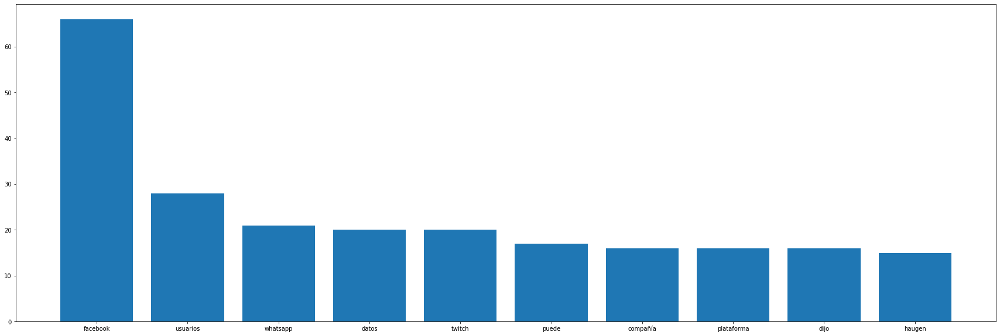

In [249]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

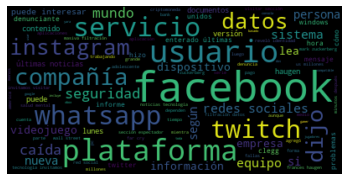

In [250]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### ──►*Analyzing the change of the most frequent words by subject categories (Analizando el cambio de las palabras más frecuentes por categorías de temas).*

In [251]:
#Getting texts from the database.
textTecno2do = []
for news in list(collection.find({}, {"title": 1, "author":1 ,"summary": 1, "full_text": 1, "_id": 0})):
    textTecno2do.append(news["title"])
    textTecno2do.append(news["summary"])
    textTecno2do.append(news["author"])
    textTecno2do.append(news["full_text"])

In [252]:
#Join of the required texts.
textTecno2do = " ".join(textTecno2do)

In [253]:
textTecno2do

'Google bajará comisión a suscripciones en tienda de aplicaciones A partir del 1 de enero, Google Play Store cobrará a las aplicaciones de suscripción de terceros una comisión del 15 %, informó la compañía el jueves. Anteriormente, a las aplicaciones de suscripción se les cobraba un 30 %. Agencia Bloomberg Google reducirá las comisiones que cobra por los servicios de suscripción en su tienda de aplicaciones tras la presión de los desarrolladores y los legisladores. A partir del 1 de enero, Google Play Store cobrará a las aplicaciones de suscripción de terceros una comisión del 15%, informó la compañía el jueves. Anteriormente, a las aplicaciones de suscripción se les cobraba un 30% durante el primer año y luego un 15%. Google también cobraba el 15% por el primer US$1 millón de ingresos. Lea también: Google lanza Pixel 6, la familia de celulares más rápida de la marca Google explicó que el cambio se debe a que “la rotación de clientes hace que sea difícil para las empresas de suscripció

### - lowercasing (Transformación a minúsculas).

In [254]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textTecno2do = textTecno2do.lower()

### - tokenization (Tokenización).

In [255]:
#Tokenization per sentences.

sentences = sent_tokenize(textTecno2do)

print(sentences)

['google bajará comisión a suscripciones en tienda de aplicaciones a partir del 1 de enero, google play store cobrará a las aplicaciones de suscripción de terceros una comisión del 15 %, informó la compañía el jueves.', 'anteriormente, a las aplicaciones de suscripción se les cobraba un 30 %.', 'agencia bloomberg google reducirá las comisiones que cobra por los servicios de suscripción en su tienda de aplicaciones tras la presión de los desarrolladores y los legisladores.', 'a partir del 1 de enero, google play store cobrará a las aplicaciones de suscripción de terceros una comisión del 15%, informó la compañía el jueves.', 'anteriormente, a las aplicaciones de suscripción se les cobraba un 30% durante el primer año y luego un 15%.', 'google también cobraba el 15% por el primer us$1 millón de ingresos.', 'lea también: google lanza pixel 6, la familia de celulares más rápida de la marca google explicó que el cambio se debe a que “la rotación de clientes hace que sea difícil para las emp

In [256]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textTecno2do)

print(words)

['google', 'bajará', 'comisión', 'a', 'suscripciones', 'en', 'tienda', 'de', 'aplicaciones', 'a', 'partir', 'del', '1', 'de', 'enero', 'google', 'play', 'store', 'cobrará', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'de', 'terceros', 'una', 'comisión', 'del', '15', 'informó', 'la', 'compañía', 'el', 'jueves', 'anteriormente', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'se', 'les', 'cobraba', 'un', '30', 'agencia', 'bloomberg', 'google', 'reducirá', 'las', 'comisiones', 'que', 'cobra', 'por', 'los', 'servicios', 'de', 'suscripción', 'en', 'su', 'tienda', 'de', 'aplicaciones', 'tras', 'la', 'presión', 'de', 'los', 'desarrolladores', 'y', 'los', 'legisladores', 'a', 'partir', 'del', '1', 'de', 'enero', 'google', 'play', 'store', 'cobrará', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'de', 'terceros', 'una', 'comisión', 'del', '15', 'informó', 'la', 'compañía', 'el', 'jueves', 'anteriormente', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'se', 'les', 'cobraba', 'un', '

### -removing Stopwords (Remoción de las Stopwords).

In [257]:
#Removing Stopwords.

filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['google', 'bajará', 'comisión', 'a', 'suscripciones', 'en', 'tienda', 'de', 'aplicaciones', 'a', 'partir', 'del', '1', 'de', 'enero', 'google', 'play', 'store', 'cobrará', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'de', 'terceros', 'una', 'comisión', 'del', '15', 'informó', 'la', 'compañía', 'el', 'jueves', 'anteriormente', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'se', 'les', 'cobraba', 'un', '30', 'agencia', 'bloomberg', 'google', 'reducirá', 'las', 'comisiones', 'que', 'cobra', 'por', 'los', 'servicios', 'de', 'suscripción', 'en', 'su', 'tienda', 'de', 'aplicaciones', 'tras', 'la', 'presión', 'de', 'los', 'desarrolladores', 'y', 'los', 'legisladores', 'a', 'partir', 'del', '1', 'de', 'enero', 'google', 'play', 'store', 'cobrará', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'de', 'terceros', 'una', 'comisión', 'del', '15', 'informó', 'la', 'compañía', 'el', 'jueves', 'anteriormente', 'a', 'las', 'aplicaciones', 'de', 'suscripción', 'se', 'les', 'cobrab

### -part of speech (Parte del discurso).

In [258]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [259]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [260]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(filtered_words)

[('google', 'NOUN'),
 ('bajará', 'VERB'),
 ('comisión', 'NOUN'),
 ('suscripciones', 'NOUN'),
 ('tienda', 'NOUN'),
 ('aplicaciones', 'NOUN'),
 ('partir', 'VERB'),
 ('1', 'NUM'),
 ('enero', 'NOUN'),
 ('google', 'NOUN'),
 ('play', 'NOUN'),
 ('store', 'NOUN'),
 ('cobrará', 'VERB'),
 ('aplicaciones', 'NOUN'),
 ('suscripción', 'NOUN'),
 ('terceros', 'ADJ'),
 ('comisión', 'NOUN'),
 ('15', 'NUM'),
 ('informó', 'VERB'),
 ('compañía', 'NOUN'),
 ('jueves', 'NOUN'),
 ('anteriormente', 'ADV'),
 ('aplicaciones', 'NOUN'),
 ('suscripción', 'NOUN'),
 ('cobraba', 'AUX'),
 ('30', 'NUM'),
 ('agencia', 'NOUN'),
 ('bloomberg', 'ADJ'),
 ('google', 'NOUN'),
 ('reducirá', 'VERB'),
 ('comisiones', 'NOUN'),
 ('cobra', 'VERB'),
 ('servicios', 'NOUN'),
 ('suscripción', 'NOUN'),
 ('tienda', 'NOUN'),
 ('aplicaciones', 'NOUN'),
 ('tras', 'ADP'),
 ('presión', 'NOUN'),
 ('desarrolladores', 'ADJ'),
 ('legisladores', 'NOUN'),
 ('partir', 'VERB'),
 ('1', 'NUM'),
 ('enero', 'NOUN'),
 ('google', 'NOUN'),
 ('play', 'NOUN'),


### -words distribution (Distribución de palabras).

In [261]:
frec_dist = FreqDist(filtered_words)

print(frec_dist)

<FreqDist with 4912 samples and 14041 outcomes>


In [262]:
frec_dist.most_common(5)

[('facebook', 155),
 ('puede', 64),
 ('usuarios', 61),
 ('millones', 57),
 ('tecnología', 55)]

<BarContainer object of 10 artists>

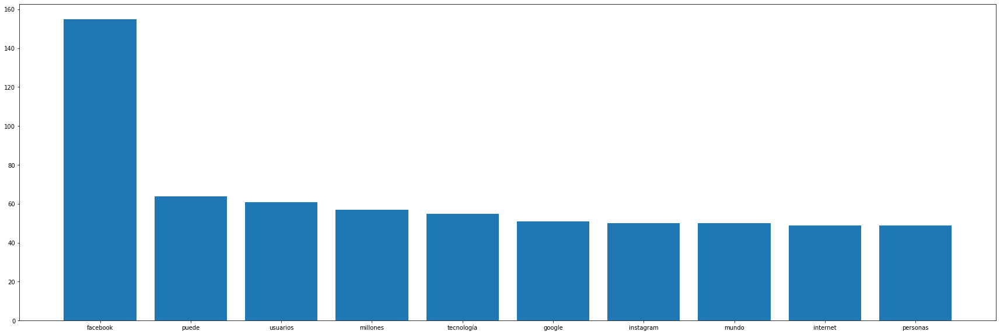

In [263]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

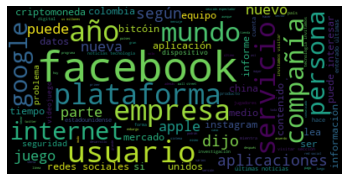

In [265]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### ──►*Change of the most frequent words week by week (Cambio de las palabras más frecuentes semana a semana).*

### 4. Categoría de Economía.


In [266]:
# Creating a connection to MongoDB
client = MongoClient("localhost", 27017)
db = client["news"]
collection = db["elespectador-economia"]

### primera semana.

In [267]:
#Getting texts from the database.
textEco = []
for news in list(collection.find({"datetime":{'$lt':"22 oct", '$gt':"17 oct"}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textEco.append(news["title"])
    textEco.append(news["summary"])
    textEco.append(news["full_text"])

In [268]:
# Creating a text index over all text fields
collection.create_index([('author', TEXT), ('title', TEXT), ('summary', TEXT), ('full_text', TEXT), ('datetime', TEXT)],default_language = 'spanish')

'author_text_title_text_summary_text_full_text_text_datetime_text'

In [269]:
#Join of the required texts.
textEco = " ".join(textEco)

In [270]:
textEco

'Caos en la cadena de suministro amenaza el crecimiento económico mundial El aumento de los precios de las materias primas, la congestión de los puertos y la escasez de conductores de camiones, entre otros, afectan a las economías de todos los países y los problemas no serán superados sino hasta 2023, cuando menos. Mientras la economía mundial se recupera de la crisis por la pandemia de coronavirus, las interrupciones en la cadena de suministro en curso ponen en riesgo el crecimiento mundial. Los problemas en la cadena de suministro, incluidos el aumento de los precios de las materias primas, la escasez de chips de computador, la congestión de los puertos y la escasez de conductores de camiones, amenazan la economía mundial.  En declaraciones a la Agencia Anadolu, el economista experto de Moody’s Analytics, Tim Uy, dice que las interrupciones en la cadena de suministro continuarán. ”Hay atascos en cada eslabón de la cadena, ya sea en los envíos, los puertos, los camiones, los trenes, l

### - lowercasing (Transformación a minúsculas).

In [271]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textEco = textEco.lower()

### - tokenization (Tokenización).

In [272]:
#Tokenization per sentences.

sentences = sent_tokenize(textEco)

print(sentences)

['caos en la cadena de suministro amenaza el crecimiento económico mundial el aumento de los precios de las materias primas, la congestión de los puertos y la escasez de conductores de camiones, entre otros, afectan a las economías de todos los países y los problemas no serán superados sino hasta 2023, cuando menos.', 'mientras la economía mundial se recupera de la crisis por la pandemia de coronavirus, las interrupciones en la cadena de suministro en curso ponen en riesgo el crecimiento mundial.', 'los problemas en la cadena de suministro, incluidos el aumento de los precios de las materias primas, la escasez de chips de computador, la congestión de los puertos y la escasez de conductores de camiones, amenazan la economía mundial.', 'en declaraciones a la agencia anadolu, el economista experto de moody’s analytics, tim uy, dice que las interrupciones en la cadena de suministro continuarán.', '”hay atascos en cada eslabón de la cadena, ya sea en los envíos, los puertos, los camiones, l

In [273]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textEco)

print(words)

['caos', 'en', 'la', 'cadena', 'de', 'suministro', 'amenaza', 'el', 'crecimiento', 'económico', 'mundial', 'el', 'aumento', 'de', 'los', 'precios', 'de', 'las', 'materias', 'primas', 'la', 'congestión', 'de', 'los', 'puertos', 'y', 'la', 'escasez', 'de', 'conductores', 'de', 'camiones', 'entre', 'otros', 'afectan', 'a', 'las', 'economías', 'de', 'todos', 'los', 'países', 'y', 'los', 'problemas', 'no', 'serán', 'superados', 'sino', 'hasta', '2023', 'cuando', 'menos', 'mientras', 'la', 'economía', 'mundial', 'se', 'recupera', 'de', 'la', 'crisis', 'por', 'la', 'pandemia', 'de', 'coronavirus', 'las', 'interrupciones', 'en', 'la', 'cadena', 'de', 'suministro', 'en', 'curso', 'ponen', 'en', 'riesgo', 'el', 'crecimiento', 'mundial', 'los', 'problemas', 'en', 'la', 'cadena', 'de', 'suministro', 'incluidos', 'el', 'aumento', 'de', 'los', 'precios', 'de', 'las', 'materias', 'primas', 'la', 'escasez', 'de', 'chips', 'de', 'computador', 'la', 'congestión', 'de', 'los', 'puertos', 'y', 'la', 'esca

### -removing Stopwords (Remoción de las Stopwords).

In [274]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [275]:
#Removing Stopwords.

filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['caos', 'en', 'la', 'cadena', 'de', 'suministro', 'amenaza', 'el', 'crecimiento', 'económico', 'mundial', 'el', 'aumento', 'de', 'los', 'precios', 'de', 'las', 'materias', 'primas', 'la', 'congestión', 'de', 'los', 'puertos', 'y', 'la', 'escasez', 'de', 'conductores', 'de', 'camiones', 'entre', 'otros', 'afectan', 'a', 'las', 'economías', 'de', 'todos', 'los', 'países', 'y', 'los', 'problemas', 'no', 'serán', 'superados', 'sino', 'hasta', '2023', 'cuando', 'menos', 'mientras', 'la', 'economía', 'mundial', 'se', 'recupera', 'de', 'la', 'crisis', 'por', 'la', 'pandemia', 'de', 'coronavirus', 'las', 'interrupciones', 'en', 'la', 'cadena', 'de', 'suministro', 'en', 'curso', 'ponen', 'en', 'riesgo', 'el', 'crecimiento', 'mundial', 'los', 'problemas', 'en', 'la', 'cadena', 'de', 'suministro', 'incluidos', 'el', 'aumento', 'de', 'los', 'precios', 'de', 'las', 'materias', 'primas', 'la', 'escasez', 'de', 'chips', 'de', 'computador', 'la', 'congestión', 'de', 'los', 'puertos', 'y', 

### -part of speech (Parte del discurso).

In [276]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [277]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [278]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(filtered_words)

[('caos', 'NOUN'),
 ('cadena', 'NOUN'),
 ('suministro', 'NOUN'),
 ('amenaza', 'VERB'),
 ('crecimiento', 'NOUN'),
 ('económico', 'ADJ'),
 ('mundial', 'ADJ'),
 ('aumento', 'NOUN'),
 ('precios', 'NOUN'),
 ('materias', 'NOUN'),
 ('primas', 'NOUN'),
 ('congestión', 'NOUN'),
 ('puertos', 'NOUN'),
 ('escasez', 'NOUN'),
 ('conductores', 'ADJ'),
 ('camiones', 'NOUN'),
 ('afectan', 'VERB'),
 ('economías', 'NOUN'),
 ('países', 'NOUN'),
 ('problemas', 'NOUN'),
 ('superados', 'ADJ'),
 ('sino', 'CCONJ'),
 ('2023', 'NUM'),
 ('menos', 'ADV'),
 ('mientras', 'SCONJ'),
 ('economía', 'NOUN'),
 ('mundial', 'ADJ'),
 ('recupera', 'VERB'),
 ('crisis', 'NOUN'),
 ('pandemia', 'ADJ'),
 ('coronavirus', 'ADJ'),
 ('interrupciones', 'NOUN'),
 ('cadena', 'ADJ'),
 ('suministro', 'NOUN'),
 ('curso', 'NOUN'),
 ('ponen', 'VERB'),
 ('riesgo', 'NOUN'),
 ('crecimiento', 'NOUN'),
 ('mundial', 'ADJ'),
 ('problemas', 'NOUN'),
 ('cadena', 'ADJ'),
 ('suministro', 'NOUN'),
 ('incluidos', 'VERB'),
 ('aumento', 'NOUN'),
 ('precios'

### -words distribution (Distribución de palabras).

In [279]:
frec_dist = FreqDist(filtered_words)

print(frec_dist)

<FreqDist with 4197 samples and 10967 outcomes>


In [280]:
frec_dist.most_common(5)

[('colombia', 48), ('1', 43), ('4', 41), ('parte', 39), ('puede', 39)]

<BarContainer object of 10 artists>

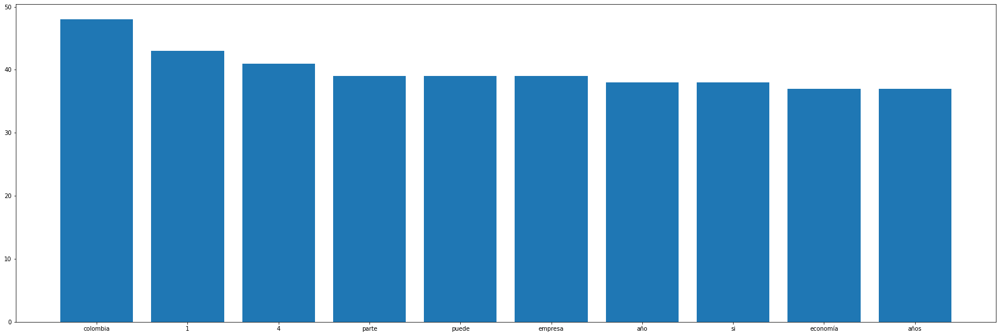

In [281]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

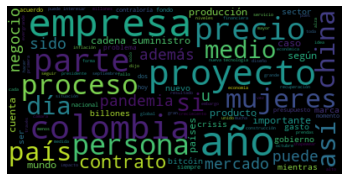

In [282]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### segunda semana.

In [283]:
#Getting texts from the database.
textEco2 = []
for news in list(collection.find({"datetime":{'$lt':"17 oct", '$gt':"10 oct"}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textEco2.append(news["title"])
    textEco2.append(news["summary"])
    textEco2.append(news["full_text"])

In [284]:
# Creating a text index over all text fields
collection.create_index([('author', TEXT), ('title', TEXT), ('summary', TEXT), ('full_text', TEXT), ('datetime', TEXT)],default_language = 'spanish')

'author_text_title_text_summary_text_full_text_text_datetime_text'

In [285]:
#Join of the required texts.
textEco2 = " ".join(textEco2)

In [286]:
textEco2

'Buscan a las mejores empresas de Medellín en ciencia y tecnología para acelerarlas La iniciativa busca ofrecer acompañamientos personalizados y capital para invertir en estas compañías. Ruta N anunció la convocatoria Mass Challenge, abierta hasta el próximo 19 de octubre, para acelerar a las 10 mejores empresas y emprendimientos de base tecnológica y científica de Medellín. La iniciativa busca ofrecer acompañamientos personalizados y capital para invertir en estas compañías. En primer lugar, sobre las 10 seleccionadas, habrá una fase de diagnóstico para identificar lo que se requiere para que estas iniciativas tengan éxito en el mercado. “Con la asesoría de Mass Challenge buscamos acelerar empresas con enfoque tecnológico o científico que tengan un alto potencial de crecimiento. Quienes se postulen podrán entrar a un proceso de acompañamiento por cuatro meses, en el que se revisarán aspectos como los legales, de producto y financieros para luego tener la posibilidad de acceder a capit

### - lowercasing (Transformación a minúsculas).

In [287]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textEco2 = textTecno2.lower()

### - tokenization (Tokenización).

In [288]:
#Tokenization per sentences.

sentences = sent_tokenize(textEco2)

print(sentences)

['tinder lanza función para encontrar acompañante para bodas los usuarios podrán indicar si están buscando acompañante o si están dispuestos a servir como pareja en alguna boda.', 'la aplicación de citas tinder ha lanzado su nueva función ‘plus one’ (‘más uno’, en inglés), con la que busca ayudar a sus usuarios a que conozcan a otras personas para que sean sus acompañantes para asistir a bodas.', 'también te puede interesar: precio del bitcóin vuelve a superar los us$60.000 desde este jueves, los usuarios de tinder podrán indicar en la pestaña explorar de la aplicación si están buscando acompañantes para una boda o si ellos mismos están dispuestos a ser el ‘más uno’ de otras personas, como ha informado la compañía en un comunicado.', 'la plataforma especializada en bodas weddingwire espera que se produzca un aumento de hasta el 20 % en las bodas en los años 2021 y 2022 debido a las ceremonias pospuestas por la pandemia.', 'esto coincide con un crecimiento de las menciones a ‘más uno’ d

In [289]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textEco2)

print(words)

['tinder', 'lanza', 'función', 'para', 'encontrar', 'acompañante', 'para', 'bodas', 'los', 'usuarios', 'podrán', 'indicar', 'si', 'están', 'buscando', 'acompañante', 'o', 'si', 'están', 'dispuestos', 'a', 'servir', 'como', 'pareja', 'en', 'alguna', 'boda', 'la', 'aplicación', 'de', 'citas', 'tinder', 'ha', 'lanzado', 'su', 'nueva', 'función', 'plus', 'one', 'más', 'uno', 'en', 'inglés', 'con', 'la', 'que', 'busca', 'ayudar', 'a', 'sus', 'usuarios', 'a', 'que', 'conozcan', 'a', 'otras', 'personas', 'para', 'que', 'sean', 'sus', 'acompañantes', 'para', 'asistir', 'a', 'bodas', 'también', 'te', 'puede', 'interesar', 'precio', 'del', 'bitcóin', 'vuelve', 'a', 'superar', 'los', 'us', '60', '000', 'desde', 'este', 'jueves', 'los', 'usuarios', 'de', 'tinder', 'podrán', 'indicar', 'en', 'la', 'pestaña', 'explorar', 'de', 'la', 'aplicación', 'si', 'están', 'buscando', 'acompañantes', 'para', 'una', 'boda', 'o', 'si', 'ellos', 'mismos', 'están', 'dispuestos', 'a', 'ser', 'el', 'más', 'uno', 'de'

### -removing Stopwords (Remoción de las Stopwords).

In [290]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [291]:
#Removing Stopwords.

filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['tinder', 'lanza', 'función', 'para', 'encontrar', 'acompañante', 'para', 'bodas', 'los', 'usuarios', 'podrán', 'indicar', 'si', 'están', 'buscando', 'acompañante', 'o', 'si', 'están', 'dispuestos', 'a', 'servir', 'como', 'pareja', 'en', 'alguna', 'boda', 'la', 'aplicación', 'de', 'citas', 'tinder', 'ha', 'lanzado', 'su', 'nueva', 'función', 'plus', 'one', 'más', 'uno', 'en', 'inglés', 'con', 'la', 'que', 'busca', 'ayudar', 'a', 'sus', 'usuarios', 'a', 'que', 'conozcan', 'a', 'otras', 'personas', 'para', 'que', 'sean', 'sus', 'acompañantes', 'para', 'asistir', 'a', 'bodas', 'también', 'te', 'puede', 'interesar', 'precio', 'del', 'bitcóin', 'vuelve', 'a', 'superar', 'los', 'us', '60', '000', 'desde', 'este', 'jueves', 'los', 'usuarios', 'de', 'tinder', 'podrán', 'indicar', 'en', 'la', 'pestaña', 'explorar', 'de', 'la', 'aplicación', 'si', 'están', 'buscando', 'acompañantes', 'para', 'una', 'boda', 'o', 'si', 'ellos', 'mismos', 'están', 'dispuestos', 'a', 'ser', 'el', 'más', 

### -part of speech (Parte del discurso).

In [292]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [293]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [294]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(filtered_words)

[('tinder', 'VERB'),
 ('lanza', 'VERB'),
 ('función', 'NOUN'),
 ('encontrar', 'VERB'),
 ('acompañante', 'NOUN'),
 ('bodas', 'NOUN'),
 ('usuarios', 'ADJ'),
 ('podrán', 'AUX'),
 ('indicar', 'AUX'),
 ('si', 'SCONJ'),
 ('buscando', 'VERB'),
 ('acompañante', 'NOUN'),
 ('si', 'SCONJ'),
 ('dispuestos', 'ADJ'),
 ('servir', 'VERB'),
 ('pareja', 'NOUN'),
 ('alguna', 'DET'),
 ('boda', 'NOUN'),
 ('aplicación', 'NOUN'),
 ('citas', 'NOUN'),
 ('tinder', 'VERB'),
 ('lanzado', 'VERB'),
 ('nueva', 'ADJ'),
 ('función', 'NOUN'),
 ('plus', 'NOUN'),
 ('one', 'NOUN'),
 ('inglés', 'ADJ'),
 ('busca', 'VERB'),
 ('ayudar', 'VERB'),
 ('usuarios', 'ADJ'),
 ('conozcan', 'VERB'),
 ('personas', 'NOUN'),
 ('acompañantes', 'NOUN'),
 ('asistir', 'VERB'),
 ('bodas', 'NOUN'),
 ('puede', 'AUX'),
 ('interesar', 'VERB'),
 ('precio', 'NOUN'),
 ('bitcóin', 'ADJ'),
 ('vuelve', 'AUX'),
 ('superar', 'VERB'),
 ('us', 'PRON'),
 ('60', 'NUM'),
 ('000', 'NUM'),
 ('jueves', 'NOUN'),
 ('usuarios', 'ADJ'),
 ('tinder', 'VERB'),
 ('podrán

### -words distribution (Distribución de palabras).

In [295]:
frec_dist = FreqDist(filtered_words)

print(frec_dist)

<FreqDist with 1832 samples and 3343 outcomes>


In [296]:
frec_dist.most_common(5)

[('facebook', 26),
 ('usuarios', 16),
 ('compañía', 16),
 ('china', 16),
 ('datos', 15)]

<BarContainer object of 10 artists>

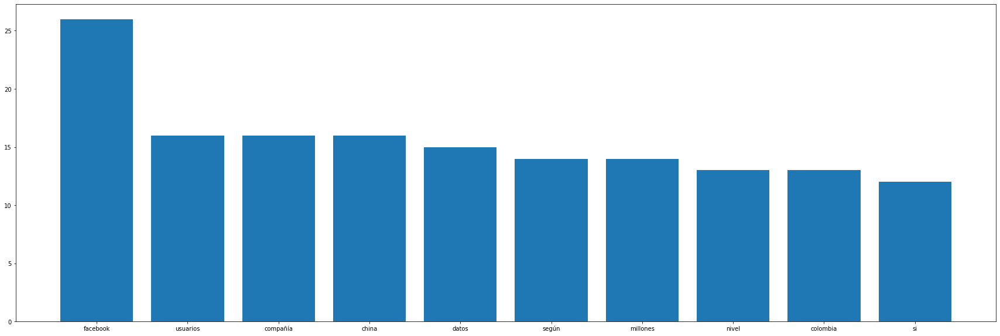

In [297]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

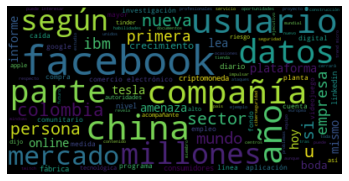

In [298]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### tercera semana.

In [299]:
#Getting texts from the database.
textEco3 = []
for news in list(collection.find({"datetime":{'$lt':"9 oct", '$gt':"3 oct"}}, {"title": 1, "summary": 1, "full_text": 1, "_id": 0})):
    textEco3.append(news["title"])
    textEco3.append(news["summary"])
    textEco3.append(news["full_text"])

In [300]:
# Creating a text index over all text fields
collection.create_index([('author', TEXT), ('title', TEXT), ('summary', TEXT), ('full_text', TEXT), ('datetime', TEXT)],default_language = 'spanish')

'author_text_title_text_summary_text_full_text_text_datetime_text'

In [301]:
#Join of the required texts.
textEco3 = " ".join(textEco3)

In [302]:
textEco3

''

### - lowercasing (Transformación a minúsculas).

In [303]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textEco3 = textTecno3.lower()

### - tokenization (Tokenización).

In [304]:
#Tokenization per sentences.

sentences = sent_tokenize(textEco3)

print(sentences)

['far cry 6 ya está disponible para pc y consolas con su mecánica de guerrillas el videojuego se ambienta en yara, un paraíso tropical que vive un levantamiento guerrillero contra el dictador antón castillo.', 'ubisoft ha lanzado far cry 6, la última entrega de su saga de videojuegos de acción.', 'está disponible para las consolas de nueva generación (ps5 y xbox series x y s), la pasada (ps4 y xbox one), pc y google stadia.', 'far cry 6 se ambienta en yara, un paraíso tropical congelado en el tiempo ubicado en el corazón del caribe.', 'los jugadores podrán unirse a la revolución contra el yugo del dictador antón castillo y su hijo adolescente diego, interpretados respectivamente por giancarlo esposito (actor de the mandalorian y breaking bad) y anthony gonzalez (coco).', 'lea también: el videojuego más vendido, la consola más usada y otros datos del mundo ‘gamer’ en el videojuego, cuyo desarrollo está liderado por ubisoft toronto, los jugadores encarnarán a dani rojas, habitante de yar

In [305]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textEco3)

print(words)

['far', 'cry', '6', 'ya', 'está', 'disponible', 'para', 'pc', 'y', 'consolas', 'con', 'su', 'mecánica', 'de', 'guerrillas', 'el', 'videojuego', 'se', 'ambienta', 'en', 'yara', 'un', 'paraíso', 'tropical', 'que', 'vive', 'un', 'levantamiento', 'guerrillero', 'contra', 'el', 'dictador', 'antón', 'castillo', 'ubisoft', 'ha', 'lanzado', 'far', 'cry', '6', 'la', 'última', 'entrega', 'de', 'su', 'saga', 'de', 'videojuegos', 'de', 'acción', 'está', 'disponible', 'para', 'las', 'consolas', 'de', 'nueva', 'generación', 'ps5', 'y', 'xbox', 'series', 'x', 'y', 's', 'la', 'pasada', 'ps4', 'y', 'xbox', 'one', 'pc', 'y', 'google', 'stadia', 'far', 'cry', '6', 'se', 'ambienta', 'en', 'yara', 'un', 'paraíso', 'tropical', 'congelado', 'en', 'el', 'tiempo', 'ubicado', 'en', 'el', 'corazón', 'del', 'caribe', 'los', 'jugadores', 'podrán', 'unirse', 'a', 'la', 'revolución', 'contra', 'el', 'yugo', 'del', 'dictador', 'antón', 'castillo', 'y', 'su', 'hijo', 'adolescente', 'diego', 'interpretados', 'respectiv

### -removing Stopwords (Remoción de las Stopwords).

In [306]:
#Stopwords list for spanish language.

stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [307]:
#Removing Stopwords.

filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['far', 'cry', '6', 'ya', 'está', 'disponible', 'para', 'pc', 'y', 'consolas', 'con', 'su', 'mecánica', 'de', 'guerrillas', 'el', 'videojuego', 'se', 'ambienta', 'en', 'yara', 'un', 'paraíso', 'tropical', 'que', 'vive', 'un', 'levantamiento', 'guerrillero', 'contra', 'el', 'dictador', 'antón', 'castillo', 'ubisoft', 'ha', 'lanzado', 'far', 'cry', '6', 'la', 'última', 'entrega', 'de', 'su', 'saga', 'de', 'videojuegos', 'de', 'acción', 'está', 'disponible', 'para', 'las', 'consolas', 'de', 'nueva', 'generación', 'ps5', 'y', 'xbox', 'series', 'x', 'y', 's', 'la', 'pasada', 'ps4', 'y', 'xbox', 'one', 'pc', 'y', 'google', 'stadia', 'far', 'cry', '6', 'se', 'ambienta', 'en', 'yara', 'un', 'paraíso', 'tropical', 'congelado', 'en', 'el', 'tiempo', 'ubicado', 'en', 'el', 'corazón', 'del', 'caribe', 'los', 'jugadores', 'podrán', 'unirse', 'a', 'la', 'revolución', 'contra', 'el', 'yugo', 'del', 'dictador', 'antón', 'castillo', 'y', 'su', 'hijo', 'adolescente', 'diego', 'interpretados',

### -part of speech (Parte del discurso).

In [308]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [309]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [310]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(filtered_words)

[('far', 'VERB'),
 ('cry', 'NOUN'),
 ('6', 'NUM'),
 ('disponible', 'ADJ'),
 ('pc', 'PRON'),
 ('consolas', 'NOUN'),
 ('mecánica', 'ADJ'),
 ('guerrillas', 'ADJ'),
 ('videojuego', 'NOUN'),
 ('ambienta', 'ADJ'),
 ('yara', 'ADJ'),
 ('paraíso', 'NOUN'),
 ('tropical', 'ADJ'),
 ('vive', 'VERB'),
 ('levantamiento', 'NOUN'),
 ('guerrillero', 'ADJ'),
 ('dictador', 'NOUN'),
 ('antón', 'ADJ'),
 ('castillo', 'NOUN'),
 ('ubisoft', 'ADJ'),
 ('lanzado', 'VERB'),
 ('far', 'VERB'),
 ('cry', 'NOUN'),
 ('6', 'NUM'),
 ('última', 'ADJ'),
 ('entrega', 'NOUN'),
 ('saga', 'VERB'),
 ('videojuegos', 'NOUN'),
 ('acción', 'NOUN'),
 ('disponible', 'ADJ'),
 ('consolas', 'ADJ'),
 ('nueva', 'ADJ'),
 ('generación', 'NOUN'),
 ('ps5', 'ADJ'),
 ('xbox', 'AUX'),
 ('series', 'NOUN'),
 ('x', 'CCONJ'),
 ('s', 'NOUN'),
 ('pasada', 'ADJ'),
 ('ps4', 'NUM'),
 ('xbox', 'NOUN'),
 ('one', 'VERB'),
 ('pc', 'DET'),
 ('google', 'NOUN'),
 ('stadia', 'ADJ'),
 ('far', 'VERB'),
 ('cry', 'NOUN'),
 ('6', 'NUM'),
 ('ambienta', 'ADJ'),
 ('yara'

### -words distribution (Distribución de palabras).

In [311]:
frec_dist = FreqDist(filtered_words)

print(frec_dist)

<FreqDist with 1479 samples and 2950 outcomes>


In [312]:
frec_dist.most_common(5)

[('facebook', 66),
 ('usuarios', 28),
 ('whatsapp', 21),
 ('datos', 20),
 ('twitch', 20)]

<BarContainer object of 10 artists>

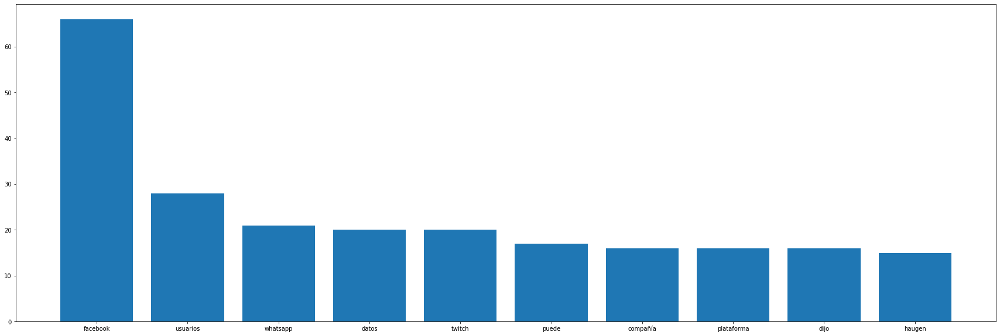

In [313]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

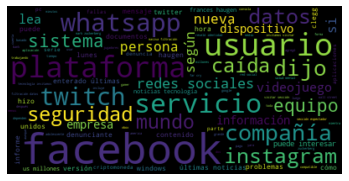

In [314]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### ──►*Analyzing the change of the most frequent words by subject categories (Analizando el cambio de las palabras más frecuentes por categorías de temas).*

In [315]:
#Getting texts from the database.
textEco2do = []
for news in list(collection.find({}, {"title": 1, "author":1 ,"summary": 1, "full_text": 1, "_id": 0})):
    textEco2do.append(news["title"])
    textEco2do.append(news["summary"])
    textEco2do.append(news["author"])
    textEco2do.append(news["full_text"])
    

In [316]:
#Join of the required texts.
textEco2do = " ".join(textEco2do)

In [317]:
textEco2do

'Caos en la cadena de suministro amenaza el crecimiento económico mundial El aumento de los precios de las materias primas, la congestión de los puertos y la escasez de conductores de camiones, entre otros, afectan a las economías de todos los países y los problemas no serán superados sino hasta 2023, cuando menos. Agencia Anadolu Mientras la economía mundial se recupera de la crisis por la pandemia de coronavirus, las interrupciones en la cadena de suministro en curso ponen en riesgo el crecimiento mundial. Los problemas en la cadena de suministro, incluidos el aumento de los precios de las materias primas, la escasez de chips de computador, la congestión de los puertos y la escasez de conductores de camiones, amenazan la economía mundial.  En declaraciones a la Agencia Anadolu, el economista experto de Moody’s Analytics, Tim Uy, dice que las interrupciones en la cadena de suministro continuarán. ”Hay atascos en cada eslabón de la cadena, ya sea en los envíos, los puertos, los camione

### - lowercasing (Transformación a minúsculas).

In [318]:
#At this point, it is necessary to be careful with warnings by losing some important words like names and others. 
textEco2do = textEco2do.lower() 

### - tokenization (Tokenización).

In [319]:
#Tokenization per sentences.

sentences = sent_tokenize(textEco2do)

print(sentences)

['caos en la cadena de suministro amenaza el crecimiento económico mundial el aumento de los precios de las materias primas, la congestión de los puertos y la escasez de conductores de camiones, entre otros, afectan a las economías de todos los países y los problemas no serán superados sino hasta 2023, cuando menos.', 'agencia anadolu mientras la economía mundial se recupera de la crisis por la pandemia de coronavirus, las interrupciones en la cadena de suministro en curso ponen en riesgo el crecimiento mundial.', 'los problemas en la cadena de suministro, incluidos el aumento de los precios de las materias primas, la escasez de chips de computador, la congestión de los puertos y la escasez de conductores de camiones, amenazan la economía mundial.', 'en declaraciones a la agencia anadolu, el economista experto de moody’s analytics, tim uy, dice que las interrupciones en la cadena de suministro continuarán.', '”hay atascos en cada eslabón de la cadena, ya sea en los envíos, los puertos,

In [320]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textEco2do)

print(words)

['caos', 'en', 'la', 'cadena', 'de', 'suministro', 'amenaza', 'el', 'crecimiento', 'económico', 'mundial', 'el', 'aumento', 'de', 'los', 'precios', 'de', 'las', 'materias', 'primas', 'la', 'congestión', 'de', 'los', 'puertos', 'y', 'la', 'escasez', 'de', 'conductores', 'de', 'camiones', 'entre', 'otros', 'afectan', 'a', 'las', 'economías', 'de', 'todos', 'los', 'países', 'y', 'los', 'problemas', 'no', 'serán', 'superados', 'sino', 'hasta', '2023', 'cuando', 'menos', 'agencia', 'anadolu', 'mientras', 'la', 'economía', 'mundial', 'se', 'recupera', 'de', 'la', 'crisis', 'por', 'la', 'pandemia', 'de', 'coronavirus', 'las', 'interrupciones', 'en', 'la', 'cadena', 'de', 'suministro', 'en', 'curso', 'ponen', 'en', 'riesgo', 'el', 'crecimiento', 'mundial', 'los', 'problemas', 'en', 'la', 'cadena', 'de', 'suministro', 'incluidos', 'el', 'aumento', 'de', 'los', 'precios', 'de', 'las', 'materias', 'primas', 'la', 'escasez', 'de', 'chips', 'de', 'computador', 'la', 'congestión', 'de', 'los', 'puer

### -removing Stopwords (Remoción de las Stopwords).

In [321]:
#Removing Stopwords.

filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['caos', 'en', 'la', 'cadena', 'de', 'suministro', 'amenaza', 'el', 'crecimiento', 'económico', 'mundial', 'el', 'aumento', 'de', 'los', 'precios', 'de', 'las', 'materias', 'primas', 'la', 'congestión', 'de', 'los', 'puertos', 'y', 'la', 'escasez', 'de', 'conductores', 'de', 'camiones', 'entre', 'otros', 'afectan', 'a', 'las', 'economías', 'de', 'todos', 'los', 'países', 'y', 'los', 'problemas', 'no', 'serán', 'superados', 'sino', 'hasta', '2023', 'cuando', 'menos', 'agencia', 'anadolu', 'mientras', 'la', 'economía', 'mundial', 'se', 'recupera', 'de', 'la', 'crisis', 'por', 'la', 'pandemia', 'de', 'coronavirus', 'las', 'interrupciones', 'en', 'la', 'cadena', 'de', 'suministro', 'en', 'curso', 'ponen', 'en', 'riesgo', 'el', 'crecimiento', 'mundial', 'los', 'problemas', 'en', 'la', 'cadena', 'de', 'suministro', 'incluidos', 'el', 'aumento', 'de', 'los', 'precios', 'de', 'las', 'materias', 'primas', 'la', 'escasez', 'de', 'chips', 'de', 'computador', 'la', 'congestión', 'de', '

### -part of speech (Parte del discurso).

In [322]:
#Using models and libraries from Stanford for the spanish language.

jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"


In [323]:
#Put the JAVA address inside the O.S.

java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [324]:
#Using the function: .tag, to calculate the part of speech for the text. 

pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(filtered_words)

[('caos', 'NOUN'),
 ('cadena', 'NOUN'),
 ('suministro', 'NOUN'),
 ('amenaza', 'VERB'),
 ('crecimiento', 'NOUN'),
 ('económico', 'ADJ'),
 ('mundial', 'ADJ'),
 ('aumento', 'NOUN'),
 ('precios', 'NOUN'),
 ('materias', 'NOUN'),
 ('primas', 'NOUN'),
 ('congestión', 'NOUN'),
 ('puertos', 'NOUN'),
 ('escasez', 'NOUN'),
 ('conductores', 'ADJ'),
 ('camiones', 'NOUN'),
 ('afectan', 'VERB'),
 ('economías', 'NOUN'),
 ('países', 'NOUN'),
 ('problemas', 'NOUN'),
 ('superados', 'ADJ'),
 ('sino', 'CCONJ'),
 ('2023', 'NUM'),
 ('menos', 'ADV'),
 ('agencia', 'NOUN'),
 ('anadolu', 'ADJ'),
 ('mientras', 'SCONJ'),
 ('economía', 'NOUN'),
 ('mundial', 'ADJ'),
 ('recupera', 'VERB'),
 ('crisis', 'NOUN'),
 ('pandemia', 'ADJ'),
 ('coronavirus', 'ADJ'),
 ('interrupciones', 'NOUN'),
 ('cadena', 'ADJ'),
 ('suministro', 'NOUN'),
 ('curso', 'NOUN'),
 ('ponen', 'VERB'),
 ('riesgo', 'NOUN'),
 ('crecimiento', 'NOUN'),
 ('mundial', 'ADJ'),
 ('problemas', 'NOUN'),
 ('cadena', 'ADJ'),
 ('suministro', 'NOUN'),
 ('incluidos',

### -words distribution (Distribución de palabras).

In [325]:
frec_dist = FreqDist(filtered_words)

print(frec_dist)

<FreqDist with 6381 samples and 21199 outcomes>


In [326]:
frec_dist.most_common(5)

[('años', 99),
 ('empresa', 83),
 ('parte', 81),
 ('emprendimiento', 80),
 ('colombia', 77)]

<BarContainer object of 10 artists>

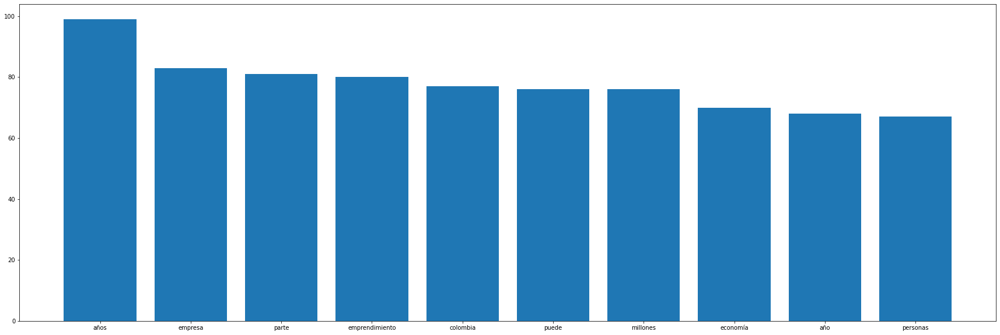

In [327]:
n = 10

plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

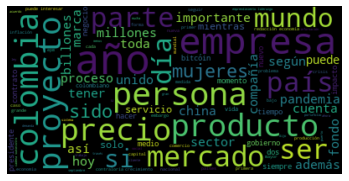

In [329]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

### ──► ÚLTIMO APARTADO

### Change analysis of the most frequent words depending on the search term.

### Author search term.

In [330]:
# Creating a connection to MongoDB
client = MongoClient("localhost", 27017)
db = client["news"]
collection = db["elespectador-salud"]

In [331]:
collection.create_index([('title', TEXT), ('summary', TEXT), ('full_text', TEXT)], default_language = 'spanish')
'$text': {'$search': 'María Mónica Monsalve'}}

SyntaxError: unmatched '}' (Temp/ipykernel_10948/1936638570.py, line 2)

In [332]:
textSal3ro = []
for news in list(collection.find({'$text': {'$search': 'María Mónica Monsalve'}}, {'_id': 0, 'summary': 1, 'title': 1, 'full_text': 1, 'author':1,})):
    textSal3ro.append(news["title"])
    textSal3ro.append(news["summary"])
    textSal3ro.append(news["author"])
    textSal3ro.append(news["full_text"])

In [333]:
textSal3ro = " ".join(textSal3ro)

In [334]:
textSal3ro

'Salud mental: el cambio climático incrementó sentimientos negativos en un 155% El último informe de The Lancet Countdown encontró que, durante las olas de calor, los sentimientos negativos que reportaron las personas en Twitter aumentaron en un 155%. Entrevista con Sonja Ayeb-Karlsson, quien hace parte de la iniciativa desde el 2015, y se ha dedicado a estudiar temas de cambio climático desde la perspectiva de la migración, el desplazamiento y la salud mental. María Mónica Monsalve Cada año, desde el 2015, un grupo de más de 90 investigadores, agrupados bajo The Lancet Countdown, publica un minucioso informe sobre cuál es el impacto que el cambio climático está teniendo en la salud humana. Se trata de un largo análisis que pasa por las olas de calor, la polución del aire y qué tan sólidos son los sistemas de salud para afrontar esta crisis. Pero el año pasado el informe hizo una valiosa reflexión que venía, además, con una promesa. “Correlacionar el cambio climático y la salud mental 

In [335]:
textSal3ro = textSal3ro.lower() # WARNING

sentences = sent_tokenize(textSal3ro)

print(sentences)

['salud mental: el cambio climático incrementó sentimientos negativos en un 155% el último informe de the lancet countdown encontró que, durante las olas de calor, los sentimientos negativos que reportaron las personas en twitter aumentaron en un 155%.', 'entrevista con sonja ayeb-karlsson, quien hace parte de la iniciativa desde el 2015, y se ha dedicado a estudiar temas de cambio climático desde la perspectiva de la migración, el desplazamiento y la salud mental.', 'maría mónica monsalve cada año, desde el 2015, un grupo de más de 90 investigadores, agrupados bajo the lancet countdown, publica un minucioso informe sobre cuál es el impacto que el cambio climático está teniendo en la salud humana.', 'se trata de un largo análisis que pasa por las olas de calor, la polución del aire y qué tan sólidos son los sistemas de salud para afrontar esta crisis.', 'pero el año pasado el informe hizo una valiosa reflexión que venía, además, con una promesa.', '“correlacionar el cambio climático y 

In [336]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textSal3ro)

print(words)

['salud', 'mental', 'el', 'cambio', 'climático', 'incrementó', 'sentimientos', 'negativos', 'en', 'un', '155', 'el', 'último', 'informe', 'de', 'the', 'lancet', 'countdown', 'encontró', 'que', 'durante', 'las', 'olas', 'de', 'calor', 'los', 'sentimientos', 'negativos', 'que', 'reportaron', 'las', 'personas', 'en', 'twitter', 'aumentaron', 'en', 'un', '155', 'entrevista', 'con', 'sonja', 'ayeb', 'karlsson', 'quien', 'hace', 'parte', 'de', 'la', 'iniciativa', 'desde', 'el', '2015', 'y', 'se', 'ha', 'dedicado', 'a', 'estudiar', 'temas', 'de', 'cambio', 'climático', 'desde', 'la', 'perspectiva', 'de', 'la', 'migración', 'el', 'desplazamiento', 'y', 'la', 'salud', 'mental', 'maría', 'mónica', 'monsalve', 'cada', 'año', 'desde', 'el', '2015', 'un', 'grupo', 'de', 'más', 'de', '90', 'investigadores', 'agrupados', 'bajo', 'the', 'lancet', 'countdown', 'publica', 'un', 'minucioso', 'informe', 'sobre', 'cuál', 'es', 'el', 'impacto', 'que', 'el', 'cambio', 'climático', 'está', 'teniendo', 'en', '

In [337]:
frec_dist = FreqDist(words)

print(frec_dist)

<FreqDist with 2330 samples and 9449 outcomes>


<BarContainer object of 10 artists>

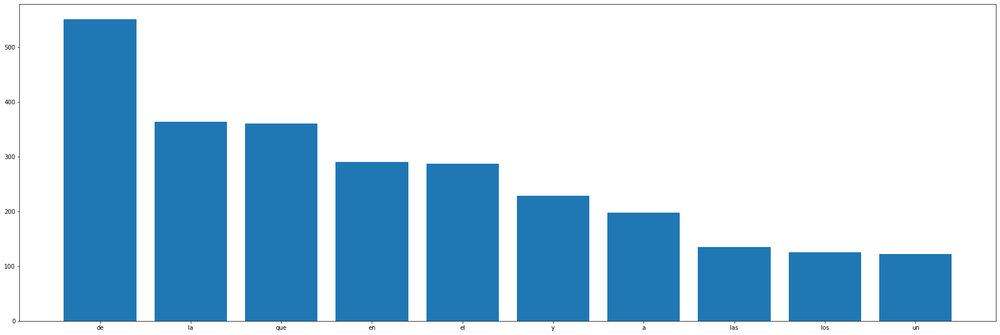

In [338]:
n = 10
plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

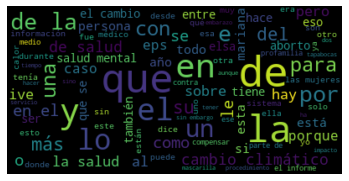

In [339]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(textSal3ro)

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

In [340]:
stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [341]:
filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['salud', 'mental', 'el', 'cambio', 'climático', 'incrementó', 'sentimientos', 'negativos', 'en', 'un', '155', 'el', 'último', 'informe', 'de', 'the', 'lancet', 'countdown', 'encontró', 'que', 'durante', 'las', 'olas', 'de', 'calor', 'los', 'sentimientos', 'negativos', 'que', 'reportaron', 'las', 'personas', 'en', 'twitter', 'aumentaron', 'en', 'un', '155', 'entrevista', 'con', 'sonja', 'ayeb', 'karlsson', 'quien', 'hace', 'parte', 'de', 'la', 'iniciativa', 'desde', 'el', '2015', 'y', 'se', 'ha', 'dedicado', 'a', 'estudiar', 'temas', 'de', 'cambio', 'climático', 'desde', 'la', 'perspectiva', 'de', 'la', 'migración', 'el', 'desplazamiento', 'y', 'la', 'salud', 'mental', 'maría', 'mónica', 'monsalve', 'cada', 'año', 'desde', 'el', '2015', 'un', 'grupo', 'de', 'más', 'de', '90', 'investigadores', 'agrupados', 'bajo', 'the', 'lancet', 'countdown', 'publica', 'un', 'minucioso', 'informe', 'sobre', 'cuál', 'es', 'el', 'impacto', 'que', 'el', 'cambio', 'climático', 'está', 'teniend

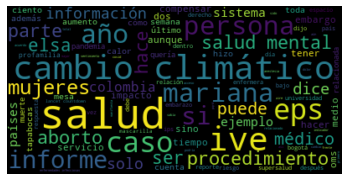

In [342]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

In [343]:
jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"

In [344]:
java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [345]:
pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(words)

[('salud', 'NOUN'),
 ('mental', 'ADJ'),
 ('el', 'DET'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('incrementó', 'VERB'),
 ('sentimientos', 'NOUN'),
 ('negativos', 'ADJ'),
 ('en', 'ADP'),
 ('un', 'DET'),
 ('155', 'NUM'),
 ('el', 'DET'),
 ('último', 'ADJ'),
 ('informe', 'NOUN'),
 ('de', 'ADP'),
 ('the', 'PROPN'),
 ('lancet', 'PROPN'),
 ('countdown', 'PROPN'),
 ('encontró', 'VERB'),
 ('que', 'SCONJ'),
 ('durante', 'ADP'),
 ('las', 'DET'),
 ('olas', 'NOUN'),
 ('de', 'ADP'),
 ('calor', 'NOUN'),
 ('los', 'DET'),
 ('sentimientos', 'NOUN'),
 ('negativos', 'ADJ'),
 ('que', 'PRON'),
 ('reportaron', 'VERB'),
 ('las', 'DET'),
 ('personas', 'NOUN'),
 ('en', 'ADP'),
 ('twitter', 'NOUN'),
 ('aumentaron', 'VERB'),
 ('en', 'ADP'),
 ('un', 'DET'),
 ('155', 'NUM'),
 ('entrevista', 'NOUN'),
 ('con', 'ADP'),
 ('sonja', 'NOUN'),
 ('ayeb', 'ADJ'),
 ('karlsson', 'VERB'),
 ('quien', 'PRON'),
 ('hace', 'VERB'),
 ('parte', 'NOUN'),
 ('de', 'ADP'),
 ('la', 'DET'),
 ('iniciativa', 'NOUN'),
 ('desde', 'ADP'),
 

### Facebook word search term.

In [346]:
# Creating a connection to MongoDB
client = MongoClient("localhost", 27017)
db = client["news"]
collection = db["elespectador-tecnologia"]

In [347]:
# Creating a text index over all text fields
collection.create_index([('title', TEXT), ('summary', TEXT), ('full_text', TEXT)], default_language = 'spanish')

OperationFailure: An equivalent index already exists with a different name and options. Requested index: { v: 2, key: { _fts: "text", _ftsx: 1 }, name: "title_text_summary_text_full_text_text", default_language: "spanish", weights: { full_text: 1, summary: 1, title: 1 }, language_override: "language", textIndexVersion: 3 }, existing index: { v: 2, key: { _fts: "text", _ftsx: 1 }, name: "author_text_title_text_summary_text_full_text_text_datetime_text", default_language: "spanish", weights: { author: 1, datetime: 1, full_text: 1, summary: 1, title: 1 }, language_override: "language", textIndexVersion: 3 }, full error: {'ok': 0.0, 'errmsg': 'An equivalent index already exists with a different name and options. Requested index: { v: 2, key: { _fts: "text", _ftsx: 1 }, name: "title_text_summary_text_full_text_text", default_language: "spanish", weights: { full_text: 1, summary: 1, title: 1 }, language_override: "language", textIndexVersion: 3 }, existing index: { v: 2, key: { _fts: "text", _ftsx: 1 }, name: "author_text_title_text_summary_text_full_text_text_datetime_text", default_language: "spanish", weights: { author: 1, datetime: 1, full_text: 1, summary: 1, title: 1 }, language_override: "language", textIndexVersion: 3 }', 'code': 85, 'codeName': 'IndexOptionsConflict'}

In [ ]:
textTecno3ro = []
for news in list(collection.find({'$text': {'$search': 'Facebook'}}, {'_id': 0, 'summary': 1, 'title': 1, 'full_text': 1, 'author':1,})):
    textTecno3ro.append(news["title"])
    textTecno3ro.append(news["summary"])
    textTecno3ro.append(news["author"])
    textTecno3ro.append(news["full_text"])

In [ ]:
textTecno3ro = " ".join(textTecno3ro)

In [ ]:
textTecno3ro

In [ ]:
textTecno3ro = textTecno3ro.lower() # WARNING

sentences = sent_tokenize(textTecno3ro)

print(sentences)

In [ ]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textTecno3ro)

print(words)

In [348]:
frec_dist = FreqDist(words)

print(frec_dist)

<FreqDist with 2330 samples and 9449 outcomes>


<BarContainer object of 10 artists>

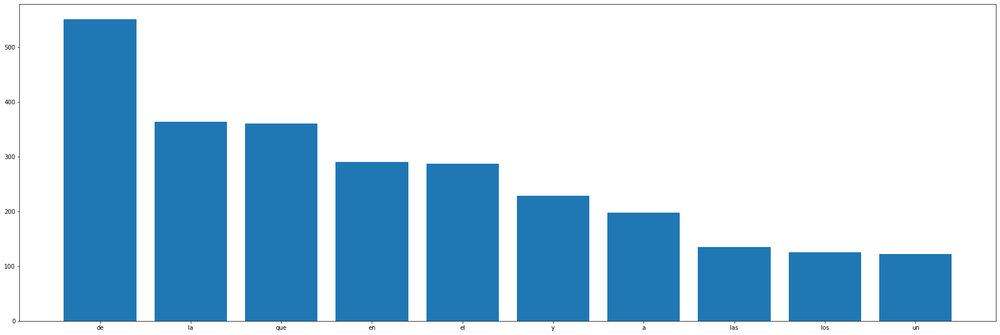

In [349]:
n = 10
plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

In [350]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(textTecno3ro)

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

NameError: name 'textTecno3ro' is not defined

In [351]:
stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [352]:
filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['salud', 'mental', 'el', 'cambio', 'climático', 'incrementó', 'sentimientos', 'negativos', 'en', 'un', '155', 'el', 'último', 'informe', 'de', 'the', 'lancet', 'countdown', 'encontró', 'que', 'durante', 'las', 'olas', 'de', 'calor', 'los', 'sentimientos', 'negativos', 'que', 'reportaron', 'las', 'personas', 'en', 'twitter', 'aumentaron', 'en', 'un', '155', 'entrevista', 'con', 'sonja', 'ayeb', 'karlsson', 'quien', 'hace', 'parte', 'de', 'la', 'iniciativa', 'desde', 'el', '2015', 'y', 'se', 'ha', 'dedicado', 'a', 'estudiar', 'temas', 'de', 'cambio', 'climático', 'desde', 'la', 'perspectiva', 'de', 'la', 'migración', 'el', 'desplazamiento', 'y', 'la', 'salud', 'mental', 'maría', 'mónica', 'monsalve', 'cada', 'año', 'desde', 'el', '2015', 'un', 'grupo', 'de', 'más', 'de', '90', 'investigadores', 'agrupados', 'bajo', 'the', 'lancet', 'countdown', 'publica', 'un', 'minucioso', 'informe', 'sobre', 'cuál', 'es', 'el', 'impacto', 'que', 'el', 'cambio', 'climático', 'está', 'teniend

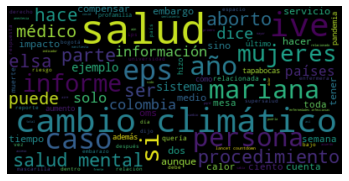

In [353]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

In [354]:
jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"

In [355]:
java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [356]:
pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(words)

[('salud', 'NOUN'),
 ('mental', 'ADJ'),
 ('el', 'DET'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('incrementó', 'VERB'),
 ('sentimientos', 'NOUN'),
 ('negativos', 'ADJ'),
 ('en', 'ADP'),
 ('un', 'DET'),
 ('155', 'NUM'),
 ('el', 'DET'),
 ('último', 'ADJ'),
 ('informe', 'NOUN'),
 ('de', 'ADP'),
 ('the', 'PROPN'),
 ('lancet', 'PROPN'),
 ('countdown', 'PROPN'),
 ('encontró', 'VERB'),
 ('que', 'SCONJ'),
 ('durante', 'ADP'),
 ('las', 'DET'),
 ('olas', 'NOUN'),
 ('de', 'ADP'),
 ('calor', 'NOUN'),
 ('los', 'DET'),
 ('sentimientos', 'NOUN'),
 ('negativos', 'ADJ'),
 ('que', 'PRON'),
 ('reportaron', 'VERB'),
 ('las', 'DET'),
 ('personas', 'NOUN'),
 ('en', 'ADP'),
 ('twitter', 'NOUN'),
 ('aumentaron', 'VERB'),
 ('en', 'ADP'),
 ('un', 'DET'),
 ('155', 'NUM'),
 ('entrevista', 'NOUN'),
 ('con', 'ADP'),
 ('sonja', 'NOUN'),
 ('ayeb', 'ADJ'),
 ('karlsson', 'VERB'),
 ('quien', 'PRON'),
 ('hace', 'VERB'),
 ('parte', 'NOUN'),
 ('de', 'ADP'),
 ('la', 'DET'),
 ('iniciativa', 'NOUN'),
 ('desde', 'ADP'),
 

### 'Superintendencia de industria' word search term.

In [357]:
# Creating a connection to MongoDB
client = MongoClient("localhost", 27017)
db = client["news"]
collection = db["elespectador-economia"]

In [358]:
collection.create_index([('title', TEXT), ('summary', TEXT), ('full_text', TEXT)], default_language = 'spanish')

OperationFailure: An equivalent index already exists with a different name and options. Requested index: { v: 2, key: { _fts: "text", _ftsx: 1 }, name: "title_text_summary_text_full_text_text", default_language: "spanish", weights: { full_text: 1, summary: 1, title: 1 }, language_override: "language", textIndexVersion: 3 }, existing index: { v: 2, key: { _fts: "text", _ftsx: 1 }, name: "author_text_title_text_summary_text_full_text_text_datetime_text", default_language: "spanish", weights: { author: 1, datetime: 1, full_text: 1, summary: 1, title: 1 }, language_override: "language", textIndexVersion: 3 }, full error: {'ok': 0.0, 'errmsg': 'An equivalent index already exists with a different name and options. Requested index: { v: 2, key: { _fts: "text", _ftsx: 1 }, name: "title_text_summary_text_full_text_text", default_language: "spanish", weights: { full_text: 1, summary: 1, title: 1 }, language_override: "language", textIndexVersion: 3 }, existing index: { v: 2, key: { _fts: "text", _ftsx: 1 }, name: "author_text_title_text_summary_text_full_text_text_datetime_text", default_language: "spanish", weights: { author: 1, datetime: 1, full_text: 1, summary: 1, title: 1 }, language_override: "language", textIndexVersion: 3 }', 'code': 85, 'codeName': 'IndexOptionsConflict'}

In [ ]:
textEco3ro = []
for news in list(collection.find({'$text': {'$search': 'Superintendencia de industria'}}, {'_id': 0, 'summary': 1, 'title': 1, 'full_text': 1, 'author':1,})):
    textEco3ro.append(news["title"])
    textEco3ro.append(news["summary"])
    textEco3ro.append(news["author"])
    textEco3ro.append(news["full_text"])

In [ ]:
textEco3ro = " ".join(textEco3ro)


In [ ]:
textEco3ro

In [ ]:
textEco3ro = textEco3ro.lower() # WARNING

sentences = sent_tokenize(textEco3ro)

print(sentences)

In [359]:
#Tokenization per words with removing punctuation and empty spaces.

tokenizer = nltk.RegexpTokenizer(r"\w+")

words = tokenizer.tokenize(textEco3ro)

print(words)

NameError: name 'textEco3ro' is not defined

In [360]:
frec_dist = FreqDist(words)

print(frec_dist)

<FreqDist with 2330 samples and 9449 outcomes>


<BarContainer object of 10 artists>

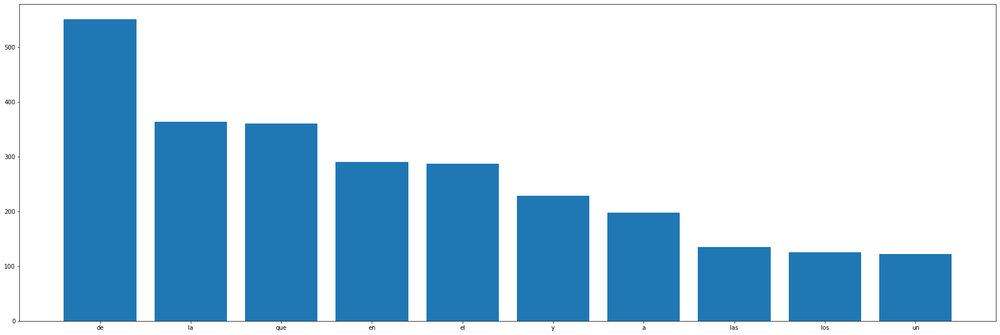

In [361]:
n = 10
plt.figure(figsize = (30, 10))
plt.bar([ w[0] for w in frec_dist.most_common(n) ], [ w[1] for w in frec_dist.most_common(n) ])

In [362]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(textTecno3ro)

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

NameError: name 'textTecno3ro' is not defined

In [363]:
stop_words = set(stopwords.words("spanish"))
print(stop_words)

{'siente', 'donde', 'habidos', 'estén', 'una', 'te', 'hubieseis', 'esté', 'fuisteis', 'tuviste', 'tuviésemos', 'tuya', 'hubiste', 'estés', 'mía', 'tengamos', 'teníamos', 'estada', 'tenían', 'tiene', 'he', 'tendríamos', 'quien', 'estaríais', 'yo', 'tienes', 'estás', 'es', 'habréis', 'vuestras', 'algunas', 'tuvierais', 'sea', 'tuvieran', 'también', 'hay', 'estará', 'pero', 'han', 'teniendo', 'unos', 'habrá', 'estarían', 'contra', 'quienes', 'hubiese', 'estuviese', 'hasta', 'su', 'se', 'nada', 'éramos', 'os', 'estuvisteis', 'nos', 'sentid', 'porque', 'fuimos', 'tendrá', 'tuyos', 'fuera', 'tengan', 'había', 'durante', 'míos', 'hayan', 'e', 'seré', 'estarías', 'tendríais', 'habremos', 'habíamos', 'fueras', 'no', 'antes', 'habría', 'vuestro', 'estuve', 'has', 'tendrán', 'estuvieron', 'habida', 'a', 'hubiera', 'suyos', 'nuestro', 'como', 'estuviste', 'hubisteis', 'estaré', 'y', 'ha', 'sois', 'mucho', 'esa', 'serían', 'ella', 'habríais', 'habrías', 'nuestra', 'sintiendo', 'habrían', 'estabas',

In [364]:
filtered_words = []
for w in words:
    if w not in stop_words:
        filtered_words.append(w)

print("All words:", words)
print("\n")
print("Substracting stopwords:", filtered_words)

All words: ['salud', 'mental', 'el', 'cambio', 'climático', 'incrementó', 'sentimientos', 'negativos', 'en', 'un', '155', 'el', 'último', 'informe', 'de', 'the', 'lancet', 'countdown', 'encontró', 'que', 'durante', 'las', 'olas', 'de', 'calor', 'los', 'sentimientos', 'negativos', 'que', 'reportaron', 'las', 'personas', 'en', 'twitter', 'aumentaron', 'en', 'un', '155', 'entrevista', 'con', 'sonja', 'ayeb', 'karlsson', 'quien', 'hace', 'parte', 'de', 'la', 'iniciativa', 'desde', 'el', '2015', 'y', 'se', 'ha', 'dedicado', 'a', 'estudiar', 'temas', 'de', 'cambio', 'climático', 'desde', 'la', 'perspectiva', 'de', 'la', 'migración', 'el', 'desplazamiento', 'y', 'la', 'salud', 'mental', 'maría', 'mónica', 'monsalve', 'cada', 'año', 'desde', 'el', '2015', 'un', 'grupo', 'de', 'más', 'de', '90', 'investigadores', 'agrupados', 'bajo', 'the', 'lancet', 'countdown', 'publica', 'un', 'minucioso', 'informe', 'sobre', 'cuál', 'es', 'el', 'impacto', 'que', 'el', 'cambio', 'climático', 'está', 'teniend

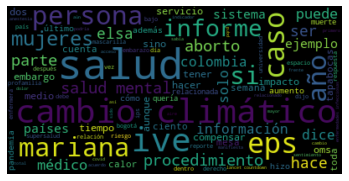

In [365]:
wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "black").generate(" ".join(filtered_words))

plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

In [366]:
jar = "./pos-tagger/stanford-postagger/stanford-postagger-4.2.0.jar"
model = "./pos-tagger/stanford-postagger/models/spanish-ud.tagger"

In [367]:
java_path = "C:/Program Files/Java/jre1.8.0_261/bin"
os.environ["JAVAHOME"] = java_path

In [368]:
pos_tagger = StanfordPOSTagger(model, jar, encoding = "utf8")
pos_tagger.tag(words)

[('salud', 'NOUN'),
 ('mental', 'ADJ'),
 ('el', 'DET'),
 ('cambio', 'NOUN'),
 ('climático', 'ADJ'),
 ('incrementó', 'VERB'),
 ('sentimientos', 'NOUN'),
 ('negativos', 'ADJ'),
 ('en', 'ADP'),
 ('un', 'DET'),
 ('155', 'NUM'),
 ('el', 'DET'),
 ('último', 'ADJ'),
 ('informe', 'NOUN'),
 ('de', 'ADP'),
 ('the', 'PROPN'),
 ('lancet', 'PROPN'),
 ('countdown', 'PROPN'),
 ('encontró', 'VERB'),
 ('que', 'SCONJ'),
 ('durante', 'ADP'),
 ('las', 'DET'),
 ('olas', 'NOUN'),
 ('de', 'ADP'),
 ('calor', 'NOUN'),
 ('los', 'DET'),
 ('sentimientos', 'NOUN'),
 ('negativos', 'ADJ'),
 ('que', 'PRON'),
 ('reportaron', 'VERB'),
 ('las', 'DET'),
 ('personas', 'NOUN'),
 ('en', 'ADP'),
 ('twitter', 'NOUN'),
 ('aumentaron', 'VERB'),
 ('en', 'ADP'),
 ('un', 'DET'),
 ('155', 'NUM'),
 ('entrevista', 'NOUN'),
 ('con', 'ADP'),
 ('sonja', 'NOUN'),
 ('ayeb', 'ADJ'),
 ('karlsson', 'VERB'),
 ('quien', 'PRON'),
 ('hace', 'VERB'),
 ('parte', 'NOUN'),
 ('de', 'ADP'),
 ('la', 'DET'),
 ('iniciativa', 'NOUN'),
 ('desde', 'ADP'),
 